In [ ]:
from slim_gsgp_lib_np.utils.utils import train_test_split
from slim_gsgp_lib_np.utils.callbacks import *
from slim_gsgp_lib_np.evaluators.fitness_functions import rmse
from slim_gsgp_lib_np.main_multi_slim import multi_slim 
from slim_gsgp_lib_np.main_slim import slim
from slim_gsgp_lib_np.datasets.data_loader import *
from matplotlib.colors import LinearSegmentedColormap
from scipy.spatial.distance import pdist, squareform
import numpy as np
import time
import os
from ace_tools_open import display_dataframe_to_user
import pickle
from tqdm import tqdm
from itertools import combinations
from functions.metrics_test import mape, nrmse, r_squared, mae, standardized_rmse
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from slim_gsgp_lib_np.config.multi_slim_config import SlimParameters, GPParameters
from slim_gsgp_lib_np.algorithms.SLIM_GSGP.representations.individual import Individual
from slim_gsgp_lib_np.algorithms.GSGP.representations.tree import Tree
from slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.tree import Tree as MultiTree
from slim_gsgp_lib_np.algorithms.GP.representations.tree import Tree as GP_Tree
from slim_gsgp_lib_np.utils.callbacks import SLIM_GSGP_Callback
from slim_gsgp_lib_np.datasets.synthetic_datasets import * 
from slim_gsgp_lib_np.main_gp import gp
from functions.misc_functions import pf_rmse_comp_extended

# Import clear output function
from IPython.display import clear_output, display
datasets = [globals()[i] for i in globals() if 'load' in i][2:]

In [164]:
df = pd.read_csv('gp_experiment_results.csv')
df.head(5)

,dataset,split_id,seed,selector,train_rmse,test_rmse,nodes_count,time_s,auc_train,auc_val,mean_diversity,mean_size,itconv_train,itconv_test,best_test,cutoff_it,cutoff_train,cutoff_test,pf
0,airfoil,0,4,dalex_fast_rand,3.596181,3.702216,261,45.615230,19236.408942,19639.182997,2.397733e+09,191.658671,1642,1999,3.678562,2000,3.596181,3.702216,"[(np.float64(3.5961808990562347), 261), (np.fl..."
1,airfoil,0,3,dalex_fast_rand,3.263271,3.184838,175,49.316217,11215.285124,11382.095507,4.416639e+11,148.406297,1714,1867,3.184433,862,3.361050,3.311246,"[(np.float64(3.2632709649449443), 175), (np.fl..."
2,airfoil,0,6,dalex,4.158528,3.989009,211,50.692778,13052.120133,12745.908140,6.943703e+07,179.664668,1967,1967,3.989009,2000,4.158528,3.989009,"[(np.float64(4.158528424119127), 211), (np.flo..."
3,airfoil,0,4,dalex_fast,4.970266,4.578024,265,55.684096,12391.994221,11580.906998,5.779198e+11,217.454773,1712,1999,4.565982,1376,5.288108,4.888139,"[(np.float64(4.970265955866367), 265), (np.flo..."
4,airfoil,0,2,dalex,3.845230,3.763905,173,61.057571,13491.175054,13563.166032,9.955912e+09,142.422289,1970,1992,3.760811,2000,3.845230,3.763905,"[(np.float64(3.845230285969885), 173), (np.flo..."


In [166]:
df[['dataset', 'selector', 'itconv_train', 'itconv_test']].groupby(['dataset', 'selector']).agg({'itconv_train': 'median', 'itconv_test': 'median'}).reset_index().sort_values(by=['dataset', 'selector'])

,dataset,selector,itconv_train,itconv_test
0,airfoil,dalex,1949.0,1986.0
1,airfoil,dalex_fast,1924.0,1990.0
2,airfoil,dalex_fast_rand,1932.0,1988.0
3,bioav,dalex,830.0,1984.0
4,bioav,dalex_fast,699.0,1983.0
5,bioav,dalex_fast_rand,557.0,1985.0
6,boston,dalex,1390.0,1973.0
7,boston,dalex_fast,1119.0,1976.0
8,boston,dalex_fast_rand,1373.0,1972.0
9,breast_cancer,dalex,1131.0,1955.0


In [ ]:
def str_list(s):
    if not isinstance(s, str):
        return []
    s_clean = s.replace('[', '').replace(']', '').replace('\r', '').replace('\n', '')
    tokens = s_clean.split()
    return [int(tok) for tok in tokens if tok.isdigit()]

In [158]:
gen_params = { 
    "test_elite": True,
    "dataset_name": "test",
    "pop_size": 100,
    "n_iter": 2000,
    "max_depth": 9,
    "init_depth": 2,
    "p_xo": 0.8,
    "prob_const": 0.2,
    "prob_terminal": 0.7,
    "tree_functions": ['add','multiply','subtract','AQ'],
    "log_level": 'evaluate',
    "it_tolerance": 20000,
    "down_sampling": 1,
    "full_return": True,
    "verbose": True,
}

def create_split(loader, split_id):
    X, y = loader()
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, p_test=0.2, seed=split_id
    )
    return {
        'X_train': X_train,
        'y_train': y_train,
        'X_test': X_test,
        'y_test': y_test
    }

def run_task(task):
    """
    task is a tuple: (dataset_name, data_split, split_id, seed, selector)
    """
    dataset_name, data_split, split_id, seed, selector = task
    t0 = time.time()

    optimizer = gp(
        seed=seed,
        **gen_params,
        **data_split,
        selector=selector,
        dalex_n_cases=5,
        tournament_size=2,
        particularity_pressure=10,
    )
    dt = time.time() - t0

    elite = optimizer.elite
    pop = optimizer.population
    hof = optimizer.hall_of_fame[:]
    log = optimizer.log

    # Hall-of-fame erweitern
    hof.extend(pop)
    points = [(ind.fitness, ind.total_nodes) for ind in hof]
    pf = pf_rmse_comp_extended(points)

    train_fit = elite.fitness
    test_fit = elite.test_fitness
    nodes_count = elite.total_nodes

    train_rmse = log['train_rmse']
    val_rmse = log['val_rmse']
    diversity_var = log['diversity_var']
    nodes_log = log['nodes_count']

    auc_train = np.trapezoid(train_rmse, dx=1)
    auc_val = np.trapezoid(val_rmse, dx=1)
    mean_diversity = np.mean(diversity_var)
    mean_size = np.mean(nodes_log)

    best_test = min(val_rmse)
    best_train = min(train_rmse)
    itconv_train = np.where(np.array(val_rmse) == best_test)[0][0]
    itconv_test = np.where(np.array(train_rmse) == best_train)[0][0]
    
    last_best, count = np.inf, 0
    for i, point in enumerate(train_rmse): 
        if point < last_best * 0.999:
            count = 0
            last_best = point
        else:
            count += 1
        if count >= 200:
            cutoff = i
            break
    
    print(cutoff, point)

    print(itconv_train, itconv_test)
    print('test_fit:', test_fit, 'train_fit:', train_fit, 'nodes_count:', nodes_count)

task = ('ld50', create_split(load_ld50, 0), 0, 1, 'dalex')
result = run_task(task)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |     2559.650    |     2183.032    |      0.003      |        3        |      3.000      |      28233      |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |     2559.650    |     2183.032    |      0.005      

In [ ]:
dataset_name, data_split, split_id, seed, selector = task

In [168]:
dataset_data = {}
for (dataset, selector), group in df.groupby(['dataset', 'selector']):
    points = group['pf'].values
    ext_points = []
    for point in points: 
        exec('ext_points.extend({})'.format(point))
    
    pf = pf_rmse_comp_extended(ext_points)
    dataset_data[(dataset, selector)] = pf

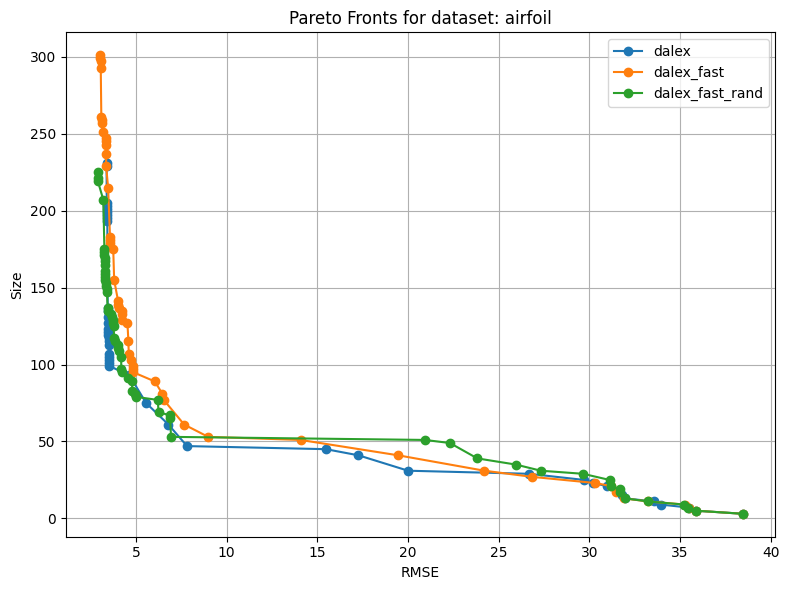

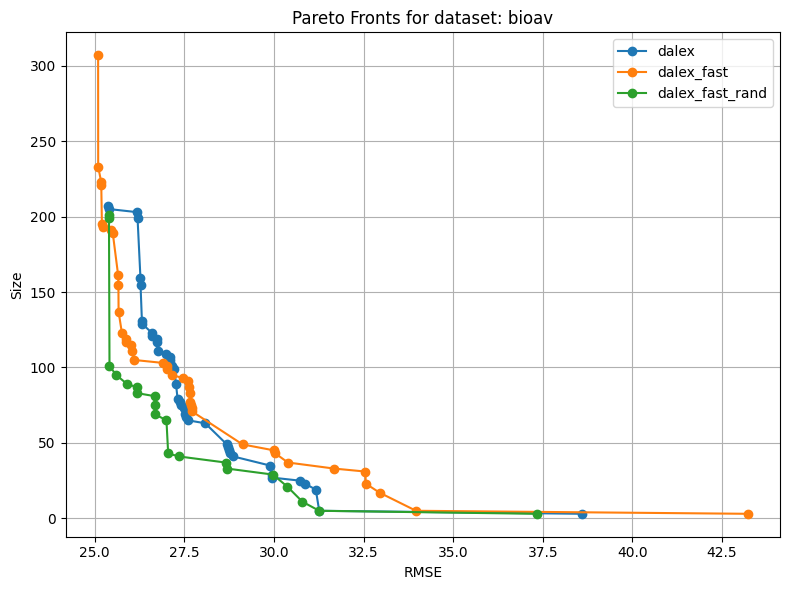

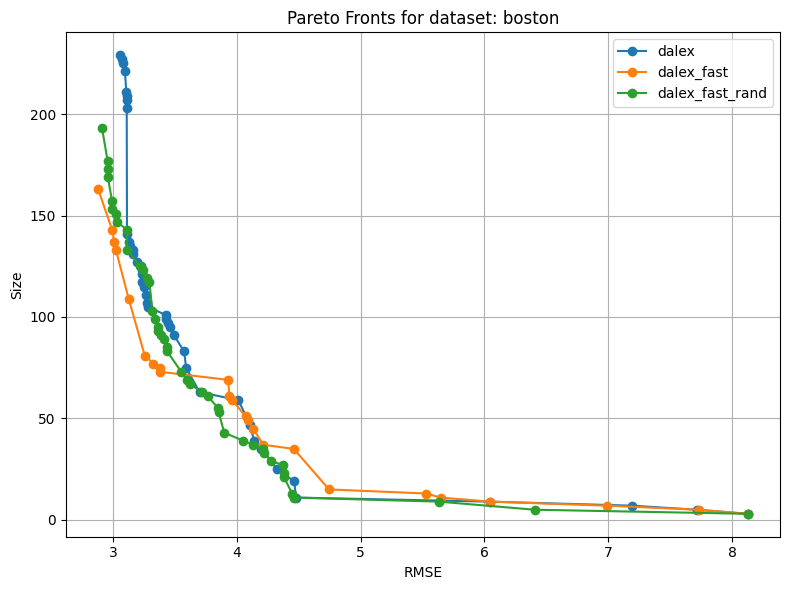

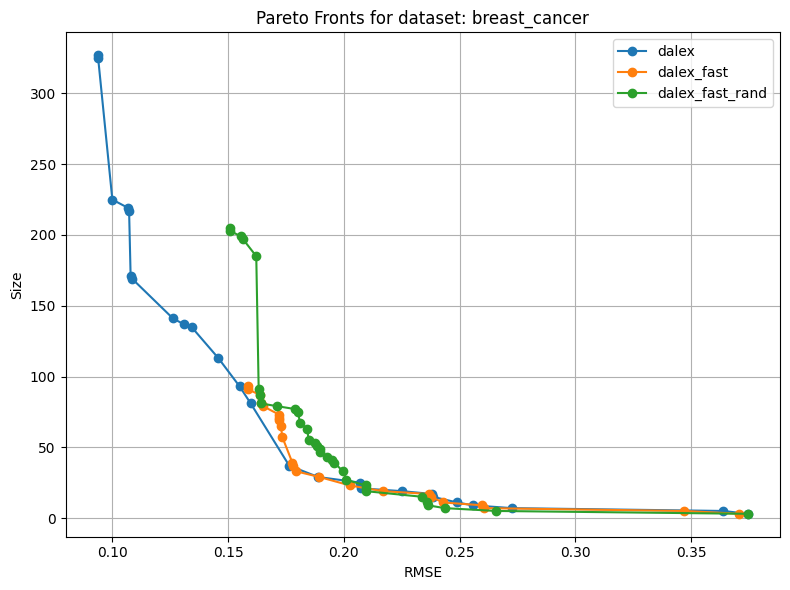

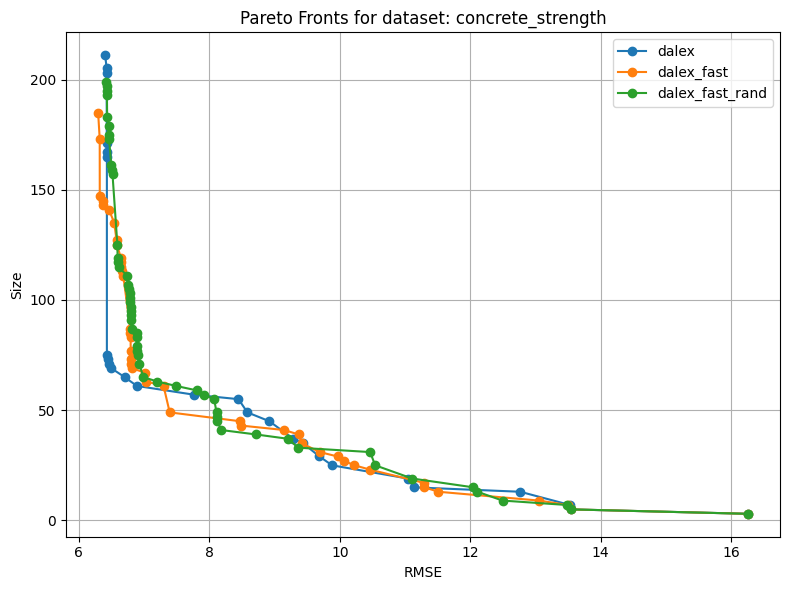

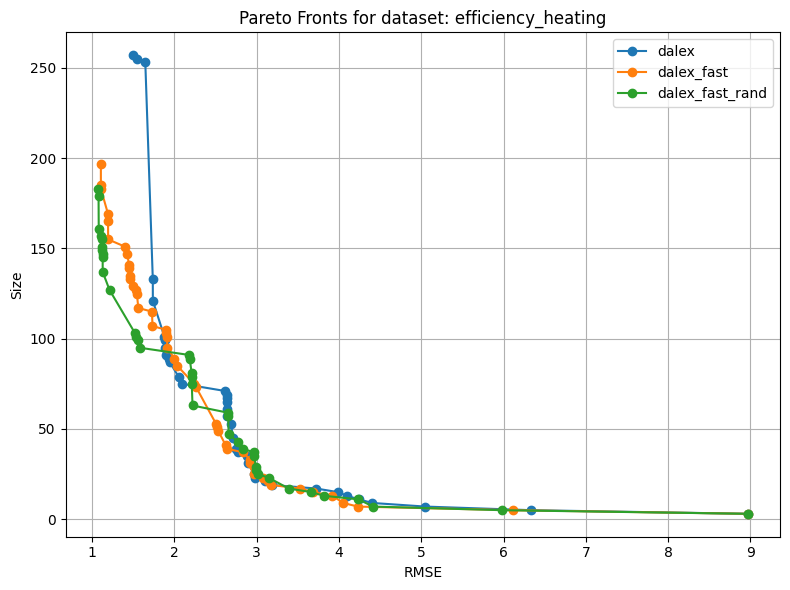

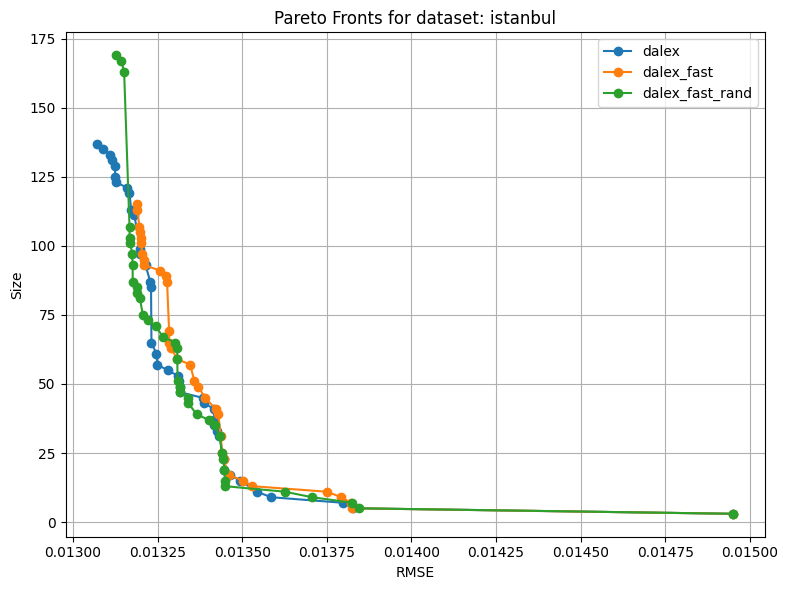

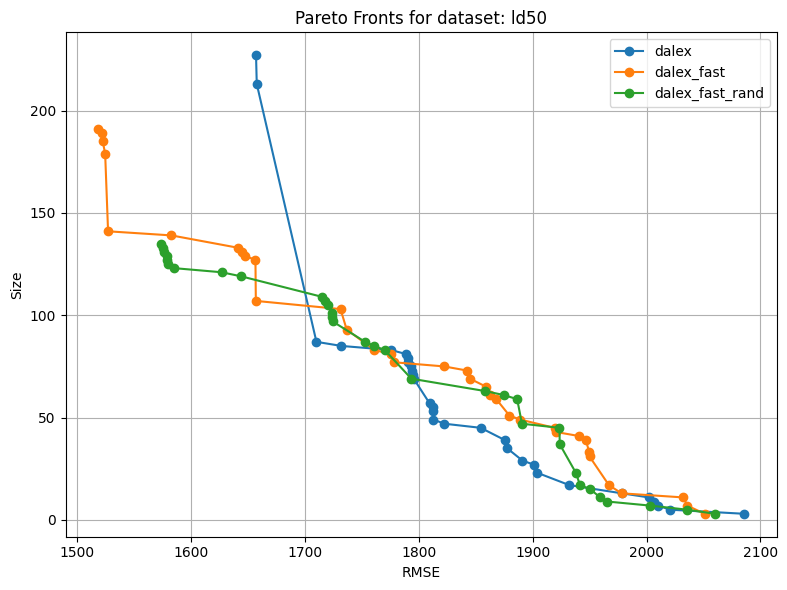

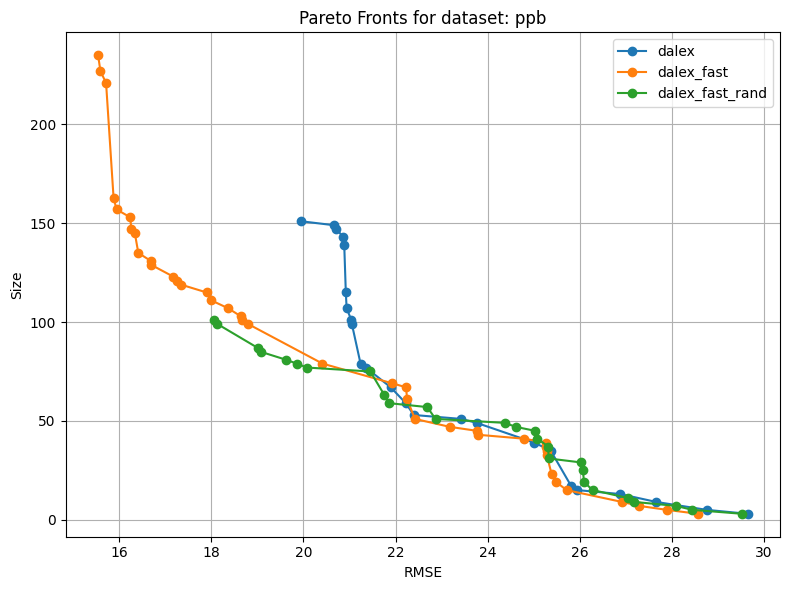

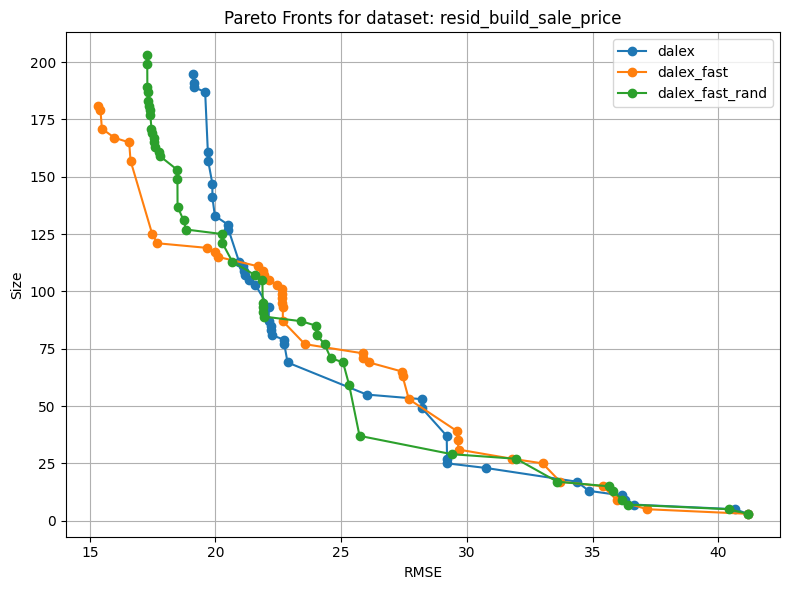

In [169]:
# Schritt 1: Doppelte Punkte entfernen und sortieren
cleaned_dict = {
    key: sorted(set(points))
    for key, points in dataset_data.items()
}

# Schritt 2: Gruppiere nach Dataset → selector: points
from collections import defaultdict

dataset_to_selectors = defaultdict(dict)
for (dataset, selector), points in cleaned_dict.items():
    dataset_to_selectors[dataset][selector] = points

# Schritt 3: Plotte je Dataset alle Selector-Pareto-Fronten
for dataset, selector_dict in sorted(dataset_to_selectors.items()):
    plt.figure(figsize=(8, 6))
    
    for selector, points in selector_dict.items():
        arr = np.array(points)
        plt.plot(arr[:, 0], arr[:, 1], marker='o', label=selector)
    
    plt.title(f'Pareto Fronts for dataset: {dataset}')
    plt.xlabel('RMSE')
    plt.ylabel('Size')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


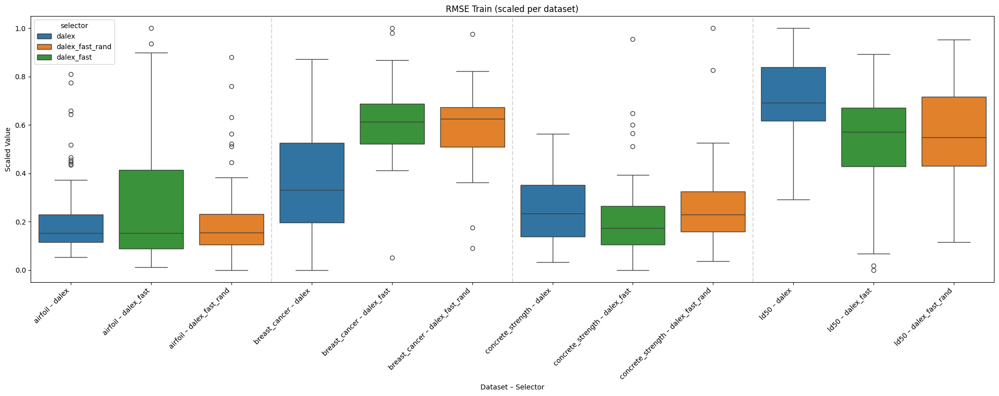

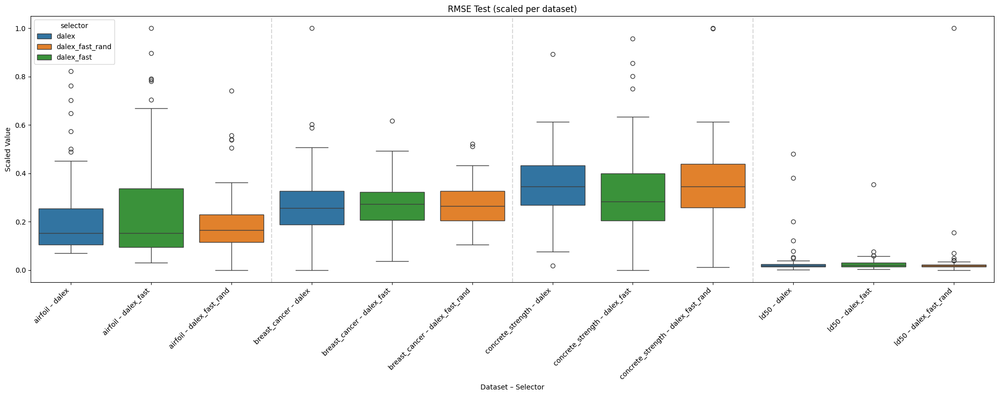

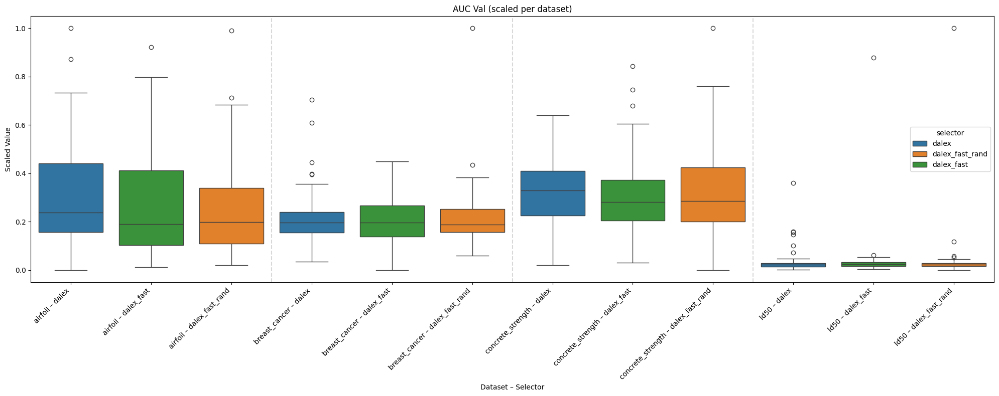

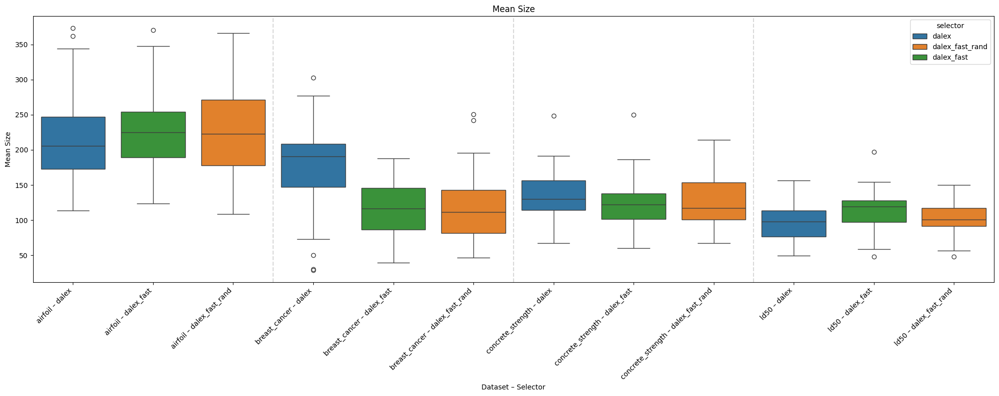

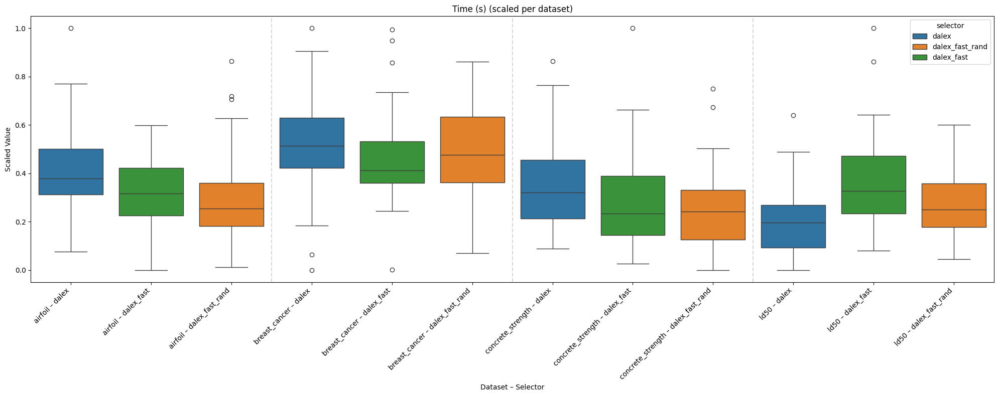

In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure string types for categorical variables
df['selector'] = df['selector'].astype(str)
df['dataset'] = df['dataset'].astype(str)

# Create a combined label for x-axis
df['dataset_selector'] = df['dataset'] + ' – ' + df['selector']

# Order for x-axis
datasets = sorted(df['dataset'].unique())
selectors = sorted(df['selector'].unique())
dataset_selector_order = [f"{d} – {s}" for d in datasets for s in selectors]

# Metrics and labels
metrics = {
    'train_rmse': 'RMSE Train',
    'test_rmse': 'RMSE Test',
    'auc_val': 'AUC Val',
    'mean_size': 'Mean Size',  # will remain unscaled
    'time_s': 'Time (s)'
}

# Perform per-dataset min-max scaling (except mean_size)
scaled_df = df.copy()
for metric in metrics:
    if metric != 'mean_size':
        scaled_values = []
        for dataset in datasets:
            sub = df[df['dataset'] == dataset]
            min_val = sub[metric].min()
            max_val = sub[metric].max()
            scaled = (sub[metric] - min_val) / (max_val - min_val) if max_val > min_val else 0.5
            scaled_values.extend(scaled)
        scaled_df[metric] = scaled_values

# Plot each metric
for metric, title in metrics.items():
    plt.figure(figsize=(20, 8))
    sns.boxplot(
        data=scaled_df,
        hue='selector',
        x='dataset_selector',
        y=metric,
        order=dataset_selector_order,

    )
    plt.title(f'{title} (scaled per dataset)' if metric != 'mean_size' else title)
    plt.xlabel('Dataset – Selector')
    plt.ylabel('Scaled Value' if metric != 'mean_size' else title)
    plt.xticks(rotation=45, ha='right')

    # Vertical separators between datasets
    for i in range(1, len(datasets)):
        plt.axvline(i * len(selectors) - 0.5, color='gray', linestyle='--', alpha=0.3)

    plt.tight_layout()
    plt.show()


In [ ]:
from collections import defaultdict
from itertools import chain
from scipy.optimize import linear_sum_assignment


def get_specialist_masks(tree_node, X_data, current_mask=None):

    """
    Function used to get the masks for each specialist to be used for specialist tunning

    Write the rest of the documentation 

    """
    def recursion(tree_node, X_data, current_mask=None):
        if current_mask is None:
            current_mask = np.ones(X_data.shape[0], dtype=bool)
        
        if isinstance(tree_node, tuple):  # Condition node
            condition = tree_node[0]
            left_child = tree_node[1]
            right_child = tree_node[2]
            
            # Evaluate condition
            cond_results = condition.predict(X_data) > 0
            true_mask = current_mask & cond_results
            false_mask = current_mask & ~cond_results
            
            # Process both branches
            left_masks = recursion(left_child, X_data, true_mask)
            right_masks = recursion(right_child, X_data, false_mask)
            
            # Merge results while preserving all masks
            merged = defaultdict(list)
            for sp, masks in chain(left_masks.items(), right_masks.items()):
                merged[sp].extend(masks)
                
            return merged
            
        else:  # Specialist node (leaf)
            return {tree_node: [current_mask]}
    
    result = recursion(tree_node, X_data)
    merged = defaultdict(list)

    for ind, mask in result.items(): 
        merged[ind] = np.sum(mask, axis=0).astype(bool)

    return merged    

def calculate_specialist_rmse(ensemble_tree, X_train, y_train):
    """
    Calculates RMSE for each specialist on samples where their decision paths activate
    
    Parameters:
    ensemble_tree: The trained ensemble tree structure
    X_train (array-like): Training features
    y_train (array-like): True target values
    specialists (dict): Dictionary of specialist objects
    
    Returns:
    dict: Specialist IDs mapped to their path-specific RMSE scores
    """
    # Get all activation masks
    masks = get_specialist_masks(ensemble_tree.collection, X_train)
    specialists = ensemble_tree.SPECIALISTS
    
    # Calculate RMSE for each specialist
    rmse_scores = {}
    
    for sp_id, mask_list in masks.items():
        if sp_id not in specialists:
            continue
            
        # Combine all paths for this specialist
        combined_mask = mask_list
        n_samples = np.sum(combined_mask)
        
        if n_samples == 0:
            rmse_scores[sp_id] = (0, np.nan)
            continue
            
        # Get predictions for active samples
        X_active = X_train[combined_mask]
        y_true = y_train[combined_mask]
        y_pred = specialists[sp_id].predict(X_active)
        
        # Calculate RMSE
        error = y_true - y_pred
        rmse_value = np.sqrt(np.mean(error**2))
        rmse_scores[sp_id] = (n_samples, rmse_value)
    
    return rmse_scores

def simplify_ensemble(tree, X_data, min_usage=0.1):
    """
    Prune any specialist leaf whose coverage on X_data is below min_usage.
    Repeat until all leaves have usage ≥ min_usage.
    """
    n = X_data.shape[0]
    
    def get_node(tree, path):
        node = tree
        for step in path:
            if not isinstance(node, tuple):
                return node
            node = node[step]
        return node
    
    def annotate(node, mask, path=()):
        """Return dict of {path: usage} for every node."""
        stats = {path: mask.mean()}
        if isinstance(node, tuple):
            cond, left, right = node
            # compute boolean mask where this cond is True/False
            m_true  = mask & (cond.predict(X_data) > 0)
            m_false = mask & ~m_true
            stats.update(annotate(left,  m_true,  path+(1,)))
            stats.update(annotate(right, m_false, path+(2,)))
        return stats

    def prune(node, target_path, path=()):
        """
        Replace the branch at target_path with its sibling.
        If target_path == path + (1,), replace left with right, etc.
        """
        if not isinstance(node, tuple):
            return node

        if path + (1,) == target_path:
            # prune left → return right subtree
            return node[2]
        if path + (2,) == target_path:
            # prune right → return left subtree
            return node[1]

        # else recurse into the matching child
        cond, left, right = node
        if target_path[:len(path)+1] == path+(1,):
            left  = prune(left,  target_path, path+(1,))
        elif target_path[:len(path)+1] == path+(2,):
            right = prune(right, target_path, path+(2,))
        return (cond, left, right)

    # repeat pruning until no leaf below threshold
    current = tree
    while True:
        stats = annotate(current, np.ones(n, bool))
        # pick all leaf‐paths with usage < min_usage
        bad = [(p,u) for p,u in stats.items()
               if not isinstance(get_node(current, p), tuple) and u<min_usage]
        if not bad:
            break
        # prune the least‐used leaf
        path,_ = min(bad, key=lambda pu: pu[1])
        current = prune(current, path)

    return current

def replace_subtree(tree, path, new_subtree):
    """
    Replaces a subtree in a nested tuple using a specified path.
    Args:
        tree: The nested tuple representing the tree.
        path: A list of indices (e.g. [1, 2, 1]) leading to the parent tuple
              that should be replaced.
        new_subtree: The new subtree/value to insert at that position.
    Returns:
        A new tree with the specified replacement.
    """
    if not path:
        return new_subtree
    # Convert to a list to update and then back to tuple.
    index = path[0]
    lst = list(tree)
    lst[index] = replace_subtree(lst[index], path[1:], new_subtree)
    return tuple(lst)

def get_leaf_candidates(tree, path=None):
    """
    Recursively traverse the tree (nested tuple) and find candidate leaves
    for simplification. Candidates are the children (at index 1 or 2) in a tuple node
    which are terminal (not a tuple) and, as strings, do not end with '0'.
    
    Args:
         tree: A nested tuple.
         path: A list indicating the path to the current tree.
    Returns:
         A list of candidates. Each candidate is a tuple (parent_path, child_index, candidate_value).
    """
    if path is None:
        path = []
    
    candidates = []
    
    if isinstance(tree, tuple):
        # Expect a tuple of the form (function, left, right)
        # We assume tree[0] is a function/operator.
        op = tree[0]
        left = tree[1]
        right = tree[2]
        
        # Check left child: candidate if not a tuple and its string does not end with '0'
        if not isinstance(left, tuple) and (not str(left).endswith("0")):
            candidates.append((path, 1, left))
        
        # Check right child similarly.
        if not isinstance(right, tuple) and (not str(right).endswith("0")):
            candidates.append((path, 2, right))
        
        # Continue recursion on children that are subtrees.
        if isinstance(left, tuple):
            candidates.extend(get_leaf_candidates(left, path + [1]))
        if isinstance(right, tuple):
            candidates.extend(get_leaf_candidates(right, path + [2]))
    return candidates

def recursive_simplification(tree, threshold, X, y, max_iterations=10, verbose=False):
    """
    Repeatedly applies simplification moves to a tree.
    
    Steps:
      1. Extract tree.repr_.
      2. Calculate candidate simplification positions (last indices).
      3. Generate all possible simplified trees.
      4. Evaluate each and choose the candidate that improves RMSE the best, if improvement > threshold.
      5. Repeat if any change is made.
    
    Args:
         tree: An object with an attribute 'repr_' holding the tree as a nested tuple.
         threshold: The minimum RMSE improvement required to accept a change.
         max_iterations: Maximum number of passes to prevent infinite loops.
    Returns:
         A tuple (final_tree_repr, final_rmse).
    """
    # Start from the tree representation.
    preds = tree.predict(X)
    current_rmse = rmse(y, preds)
    current_repr = tree.repr_
    iteration = 0
    improved = True

    while improved and iteration < max_iterations:
        iteration += 1
        candidates = get_leaf_candidates(current_repr)
        
        best_candidate_repr = None
        best_candidate_rmse = current_rmse
        best_improvement = -100000
        
        # Generate and evaluate a new tree for every candidate move.
        for candidate in candidates:
            parent_path, child_index, candidate_value = candidate
            # Replace the tuple at parent's position with the candidate leaf.
            new_repr = replace_subtree(current_repr, parent_path, candidate_value)
            new_tree = GP_Tree(new_repr)
            new_preds = new_tree.predict(X)
            new_rmse = rmse(y, new_preds)

            # Calculate RMSE improvement.
            improvement_amt = (current_rmse - new_rmse)/current_rmse
            
            if improvement_amt > best_improvement:
                best_improvement = improvement_amt
                best_candidate_repr = new_repr
                best_candidate_rmse = new_rmse
        
        # If the best move yields enough improvement, update the tree representation.
        if best_improvement > threshold:
            print(f"Iteration {iteration}: improved RMSE from {current_rmse:.4f} to {best_candidate_rmse:.4f}") if verbose else None
            current_repr = best_candidate_repr
            current_rmse = best_candidate_rmse
        else:
            improved = False

    return current_repr, current_rmse

def normalized_hamming_distance(mask1, mask2):
    """
    Compute the normalized Hamming distance between two boolean masks.
    The masks must be 1D numpy arrays of the same length.
    """
    return np.sum(mask1 != mask2) / mask1.size

def compute_composite_mask_distance(ground_truth_masks, predicted_masks, lambda_penalty=0.5):
    """
    Compute a composite distance between two sets of masks.
    
    ground_truth_masks and predicted_masks are lists (or arrays) of boolean masks.
    The distance is computed as the average normalized Hamming distance for the optimal 
    matching (using the Hungarian algorithm) plus a penalty for the difference in the number 
    of masks.
    
    Parameters:
      ground_truth_masks: list of 1D numpy boolean arrays (ground truth)
      predicted_masks: list of 1D numpy boolean arrays (predicted from the model)
      lambda_penalty: penalty weight for each extra/missing mask.
      
    Returns:
      composite_distance: the computed composite distance.
    """
    n_gt = len(ground_truth_masks)
    n_pred = len(predicted_masks)
    
    # Create cost matrix for the pairwise distances
    cost_matrix = np.zeros((n_gt, n_pred))
    for i, gt_mask in enumerate(ground_truth_masks):
        for j, pred_mask in enumerate(predicted_masks):
            cost_matrix[i, j] = normalized_hamming_distance(gt_mask, pred_mask)
    
    # Solve the assignment problem for the best matching
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    
    total_cost = cost_matrix[row_ind, col_ind].sum()
    avg_cost = total_cost / len(row_ind)
    
    # Add penalty for unmatched masks (if the numbers differ)
    unmatched = abs(n_gt - n_pred)
    composite_distance = avg_cost + lambda_penalty * unmatched
    
    return composite_distance

In [ ]:
class LogSpecialist(SLIM_GSGP_Callback):
    def __init__(self, X_train, y_train, masks):
        """
        Parameters
        ----------
        X_train : array-like, shape (n_samples, n_features)
        y_train : array-like, shape (n_samples,)
        masks   : list of boolean arrays, each of shape (n_samples,)
                  Each mask defines the data region for one specialist.
        """
        self.X_train = X_train
        self.y_train = y_train
        self.masks = masks

        self.log = []               # per-gen RMSE of best specialist on each mask
        self.count_specialists = [] # per-gen count of individuals per mask

    def on_generation_start(self, optimizer, generation):
        # Prepare per-mask minima and counts
        n_masks = len(self.masks)
        # min_errs = [np.inf] * n_masks
        # best_inds = [None] * n_masks
        min_errs, best_inds = [], []
        counts = [0] * n_masks

        for mask in self.masks: 
            errors_mask = optimizer.population.errors_case[:, mask]
            errors_ind = np.sqrt(np.mean(errors_mask**2, axis=1))
            best_ind = np.argmin(errors_ind)
            min_err = errors_ind[best_ind]
            min_errs.append(min_err)
            best_inds.append(optimizer.population.population[best_ind])

        self.log.append(min_errs)

    def plot_specialist_fitnesses(self):
        fig, ax = plt.subplots()
        data = np.array(self.log)  # shape (n_generations, n_masks)
        for i in range(data.shape[1]):
            ax.plot(data[:, i], label=f"Specialist {i+1} ({data[-1, i]:.2f})")
        ax.set_title('Specialist RMSE over Generations')
        ax.set_xlabel('Generation')
        ax.set_ylabel('RMSE')
        ax.legend()
        plt.show()


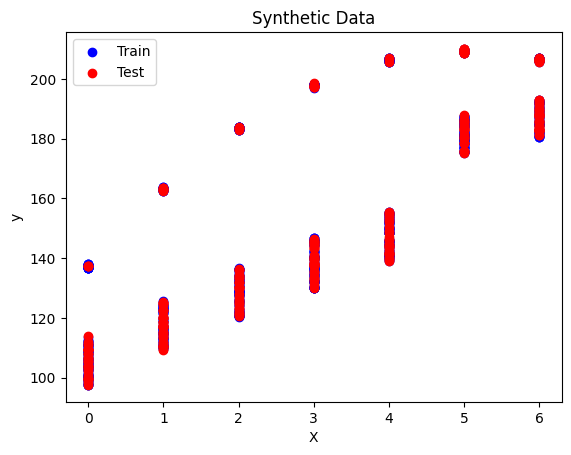

In [ ]:
X,y, mask, mask = load_synthetic6(n=1000)
train, test = train_test_split(X, y, p_test=0.3, seed=0, indices_only=True)
X_train, y_train = X[train], y[train]
X_test, y_test = X[test], y[test]
mask_train, mask_test = mask[:,train], mask[:,test]
plt.scatter(X_train[:,0], y_train, label='Train', color='blue')
plt.scatter(X_test[:,0], y_test, label='Test', color='red')
plt.xlabel('X')
plt.ylabel('y')
plt.title('Synthetic Data')
plt.legend()
plt.show()

In [ ]:
def collect_logs(X, y, mask, *, n_iter, pop_size, selector, runs=30, base_seed=5):
    results = []
    durations = []
    desc = f"{selector} n_iter={n_iter} pop={pop_size}"
    for offset in tqdm(range(runs), desc=desc):
        seed = base_seed + offset
        t0 = time.time()

        cb = LogSpecialist(X, y, mask)
        _, _ = gp(
            X_train=X,
            y_train=y,
            test_elite=False,
            callbacks=[cb],
            full_return=True,
            n_iter=n_iter,
            pop_size=pop_size,
            seed=seed,
            max_depth=7,
            init_depth=3,
            selector=selector,
            tournament_size=2,
            particularity_pressure=100,
            verbose=0,
            dataset_name=""
        )

        results.append(cb.log[-1])
        durations.append(time.time() - t0)

    return results, durations

# Experiment configurations
configs = [
    dict(n_iter=1000, pop_size=100, selector="dalex_size"),
    dict(n_iter= 400, pop_size=200, selector="dalex_size"),
    dict(n_iter= 100, pop_size=500, selector="dalex_size"),
    dict(n_iter=1000, pop_size=100, selector="dalex"),
    dict(n_iter= 400, pop_size=200, selector="dalex"),
    dict(n_iter= 100, pop_size=500, selector="dalex"),
]

# Run all and unpack
data_1, times_1 = collect_logs(X, y, mask, **configs[0])
data_2, times_2 = collect_logs(X, y, mask, **configs[1])
data_3, times_3 = collect_logs(X, y, mask, **configs[2])
data_4, times_4 = collect_logs(X, y, mask, **configs[3])
data_5, times_5 = collect_logs(X, y, mask, **configs[4])
data_6, times_6 = collect_logs(X, y, mask, **configs[5])

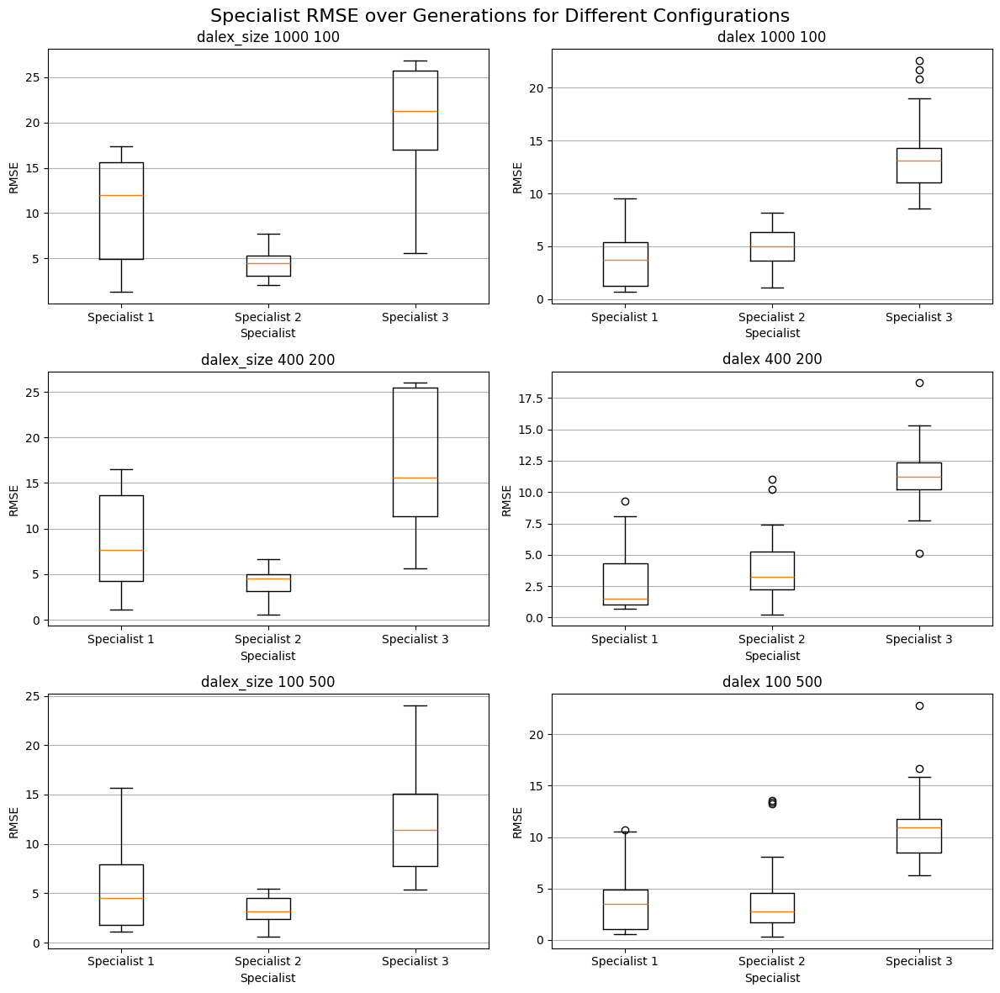

In [132]:
arrays = [np.array(data_1), np.array(data_2), np.array(data_3), 
          np.array(data_4), np.array(data_5), np.array(data_6)]

titles = ["dalex_size 1000 100", "dalex_size 400 200", "dalex_size 100 500",
          "dalex 1000 100", "dalex 400 200", "dalex 100 500"]

arrays = [arrays[0], arrays[3], arrays[1], arrays[4], arrays[2], arrays[5]]
titles = [titles[0], titles[3], titles[1], titles[4], titles[2], titles[5]]

fig, axes = plt.subplots(3, 2, figsize=(12, 12))
fig.suptitle('Specialist RMSE over Generations for Different Configurations', fontsize=16)
axes = axes.flatten()

for ax, arr, title in zip(axes, arrays, titles):
    ax.boxplot(arr, tick_labels=[f"Specialist {i+1}" for i in range(arr.shape[1])])
    ax.set_title(title)
    ax.set_ylabel('RMSE')
    ax.set_xlabel('Specialist')
    ax.grid(axis='y')

fig.tight_layout()
plt.show()

In [12]:
# Configuration
data_dir = 'selector_experiments'  # directory containing pickle files
dataset_selection = 'synthetic'

records = []
for fname in os.listdir(data_dir):
    if not fname.endswith('.pkl'):
        continue
    # parse metadata
    base = fname[:-4]
    parts = base.split('_')
    dataset = parts[0]
    if dataset != dataset_selection:
        continue
    n_iter   = int(parts[1])
    pop_size = int(parts[2])
    pp       = None if parts[3]=='None' else int(parts[3])
    selector = '_'.join(parts[4:])
    
    # load logs
    with open(os.path.join(data_dir, fname), 'rb') as f:
        logs = pickle.load(f)
    if isinstance(logs, dict):
        logs = [logs]
    
    # stack arrays: shape (runs, specialists)
    all_rmse = np.vstack([entry['result'] for entry in logs])
    all_size = np.vstack([entry['size']   for entry in logs])
    all_dur  = np.hstack([entry['duration'] for entry in logs])
    
    # per-run metrics
    run_rmse_norms = np.linalg.norm(all_rmse, axis=1)
    run_size_norms = np.linalg.norm(all_size, axis=1)
    
    # summary record
    rec = {
        'dataset':           dataset,
        'selector':          selector,
        'n_iter':            n_iter,
        'pop_size':          pop_size,
        'pp':                pp,
        'duration_mean':     np.mean(all_dur),
        'rmse_norm_med':  np.median(run_rmse_norms),
        'rmse_norm_mean':    np.mean(run_rmse_norms),
        'size_norm_med':  np.median(run_size_norms),
        'size_norm_mean':    np.mean(run_size_norms),
    }
    
    # per-specialist mean ± std
    spec_count = all_rmse.shape[1]
    for instrument, all_data in zip(['rmse', 'size'], [all_rmse, all_size]):
        for i in range(spec_count):
            rec[f'{instrument}_spec{i+1}_mean'] = f'{np.mean(all_data[:, i]):.2f} ± {np.std(all_data[:, i]):.2f}'
    
    records.append(rec)

# Build DataFrame
df_summary = pd.DataFrame(records)

# Display to user
display_dataframe_to_user("Detailed Specialist Metrics Summary", df_summary)

Detailed Specialist Metrics Summary


In [ ]:
from slim_gsgp_lib_np.utils.callbacks import LogSpecialist
seed = 10

In [7]:
l_spec = LogSpecialist(X_train, y_train, mask_train)

params = GPParameters(pop_size=500, n_iter=100, max_depth=7, init_depth=3, particularity_pressure=5,
                      selector='dalex', p_xo=0.8, down_sampling=1, dalex_size_prob=1, callbacks=[l_spec])

ensemble, multi_pop, spec_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                gp_version='gp', params_gp=params, selector='dalex',
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=2, p_xo=0.4, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=4, depth_condition=5,
                                test_elite=True, timeout=200, particularity_pressure=2)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |     126.964     |     125.475     |      0.175      |        6        |      3.538      |      24510      |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |      34.605     |      35.961     |      0.117      

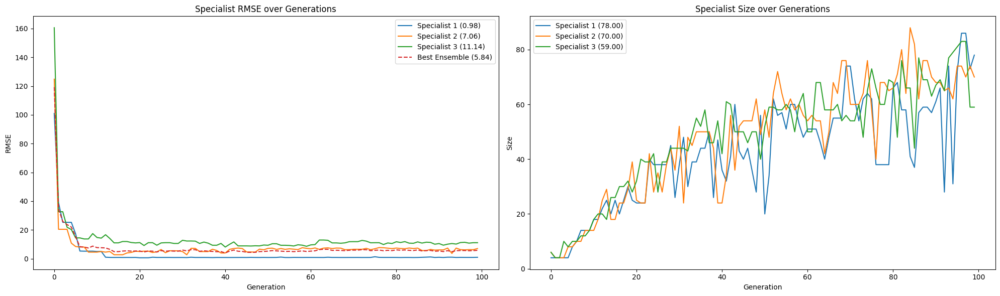

In [8]:
l_spec.plot_specialist_fitnesses()

In [6]:
l_spec = LogSpecialist(X_train, y_train, mask_train)

params = GPParameters(pop_size=1000, n_iter=40, max_depth=7, init_depth=3, particularity_pressure=30,
                      selector='dalex_fast_rand', p_xo=0.8, down_sampling=1, dalex_size_prob=0.5, callbacks=[l_spec])

res = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                gp_version='gp', params_gp=params, selector='dalex_fast_size', dalex_size_prob=0.5,
                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=20, p_xo=0.4, 
                prob_terminal=0.7, prob_specialist=0.7, max_depth=3, depth_condition=5,
                test_elite=True, timeout=200, particularity_pressure=5)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |     104.355     |     105.888     |      0.041      |        3        |      3.596      |       917       |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |      41.578     |      43.752     |      0.082      

In [1]:
import pickle 
import pandas as pd
with open('sc.pkl', 'rb') as f:
    sc = pickle.load(f)

with open('jb.pkl', 'rb') as f:
    jb = pickle.load(f)

with open('mp.pkl', 'rb') as f:   
    mp = pickle.load(f)

In [12]:
with open('jb_120.pickle', 'rb') as f:
    jb_120 = pickle.load(f)
with open('jb_160.pickle', 'rb') as f:
    jb_160 = pickle.load(f)
with open('mp_160.pickle', 'rb') as f:
    mp_160 = pickle.load(f)
with open('mp_188.pickle', 'rb') as f:
    mp_188 = pickle.load(f)
with open('sc.pickle', 'rb') as f:
    sc = pickle.load(f)

In [18]:
# Print the mean time_s for each job 
import numpy as np 
mean_time = np.mean([d["time_s"] for d in jb_120])
print(f"Joblib {100} jobs: {mean_time:.2f} seconds")

Joblib 100 jobs: 22.56 seconds


In [10]:
mean_jb_120 = pd.DataFrame(jb_120)['time_s'].mean()
mean_jb_160 = pd.DataFrame(jb_160)['time_s'].mean()
mean_mp_160 = pd.DataFrame(mp_160)['time_s'].mean()
mean_mp_188 = pd.DataFrame(mp_188)['time_s'].mean()
mean_sc = sc['time_s']

print(f"Mean time for jb_120: {mean_jb_120}")
print(f"Mean time for jb_160: {mean_jb_160}")
print(f"Mean time for mp_160: {mean_mp_160}")
print(f"Mean time for mp_188: {mean_mp_188}")
print(f"Mean time for sc: {mean_sc}")

Mean time for jb_120: 22.558300799131395
Mean time for jb_160: 28.704946736991406
Mean time for mp_160: 28.259466655552387
Mean time for mp_188: 34.91847794360303
Mean time for sc: 11.244280576705933


In [11]:
mean_mem_jb_120 = pd.DataFrame(jb_120)['mem_start_MB'].mean()
mean_mem_jb_160 = pd.DataFrame(jb_160)['mem_start_MB'].mean()
mean_mem_mp_160 = pd.DataFrame(mp_160)['mem_start_MB'].mean()
mean_mem_mp_188 = pd.DataFrame(mp_188)['mem_start_MB'].mean()
mean_mem_sc = sc['mem_start_MB']

print(f"Mean memory for jb_120: {mean_mem_jb_120} - {mean_jb_120}")
print(f"Mean memory for jb_160: {mean_mem_jb_160} - {mean_jb_160}")
print(f"Mean memory for mp_160: {mean_mem_mp_160} - {mean_mp_160}")
print(f"Mean memory for mp_188: {mean_mem_mp_188} - {mean_mp_188}")
print(f"Mean memory for sc: {mean_mem_sc}")

Mean memory for jb_120: 163.97919921875 - 22.558300799131395
Mean memory for jb_160: 157.0785888671875 - 28.704946736991406
Mean memory for mp_160: 95.3720703125 - 28.259466655552387
Mean memory for mp_188: 94.96810588430851 - 34.91847794360303
Mean memory for sc: 164.05078125


In [8]:
sc

{'label': 'single',
 'seed': 0,
 'time_s': 27.818243265151978,
 'mem_start_MB': 162.7578125,
 'mem_end_MB': 165.3828125}

In [10]:
pd.DataFrame(mp)['time_s'].mean()

np.float64(82.84312564134598)

In [9]:
pd.DataFrame(jb)['time_s'].mean()

np.float64(83.08258624279753)

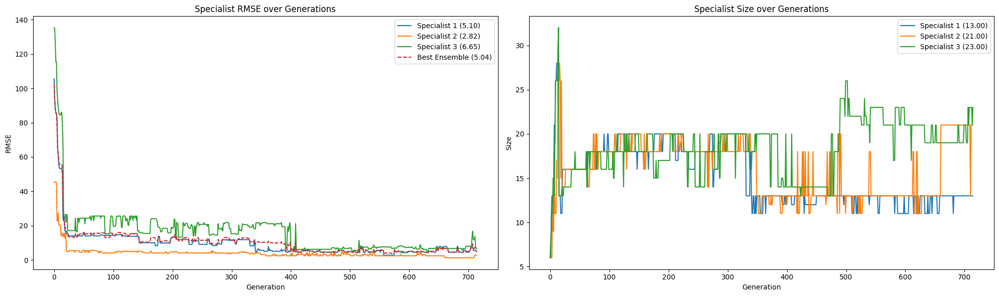

In [8]:
l_spec.plot_specialist_fitnesses()

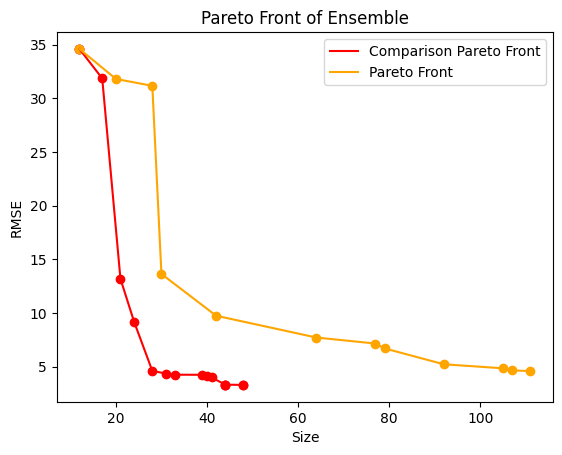

array([[ 12.        ,  34.60515949],
       [ 20.        ,  31.81037303],
       [ 28.        ,  31.16647084],
       [ 30.        ,  13.6470807 ],
       [ 42.        ,   9.75691353],
       [ 64.        ,   7.72638073],
       [ 77.        ,   7.162777  ],
       [ 79.        ,   6.71093111],
       [ 92.        ,   5.23390016],
       [105.        ,   4.8587816 ],
       [107.        ,   4.66555847],
       [111.        ,   4.59869002]])

In [28]:
l_spec.plot_pf_ensemble(comparison=pf)

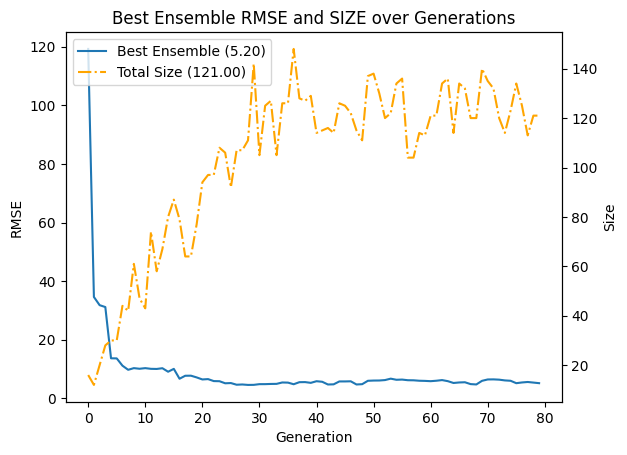

In [30]:
l_spec.plot_best_ensemble()

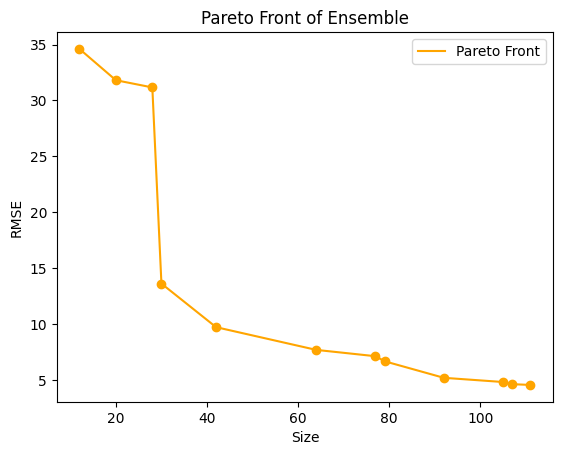

array([[ 12.        ,  34.60515949],
       [ 20.        ,  31.81037303],
       [ 28.        ,  31.16647084],
       [ 30.        ,  13.6470807 ],
       [ 42.        ,   9.75691353],
       [ 64.        ,   7.72638073],
       [ 77.        ,   7.162777  ],
       [ 79.        ,   6.71093111],
       [ 92.        ,   5.23390016],
       [105.        ,   4.8587816 ],
       [107.        ,   4.66555847],
       [111.        ,   4.59869002]])

In [31]:
l_spec.plot_pf_ensemble()

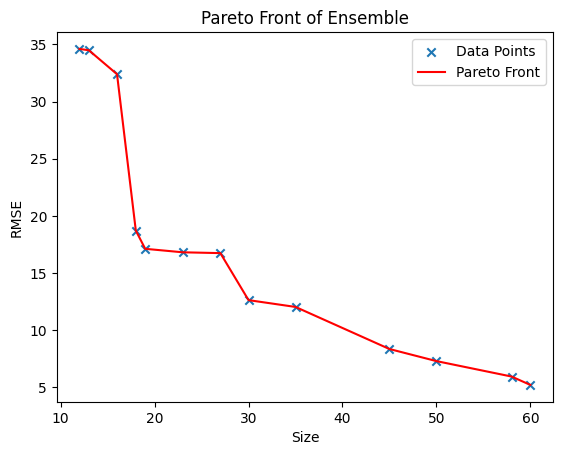

In [128]:
l_spec.plot_pf_ensemble()

In [38]:
import random 
import math 

def calculate_musigma_pp(pp: float,
                         n_cases: int = 500,
                         n_samples: int = 250):
    """
    Approximates the mean and std dev of the count of non-zero softmax weights
    under DALEX sampling for a given particularity_pressure pp.
    """
    counts = []
    for _ in range(n_samples):
        I = [random.gauss(0, pp) for _ in range(n_cases)]
        max_I = max(I)
        exp_I = [math.exp(i - max_I) for i in I]
        total = sum(exp_I)
        weights = [e / total for e in exp_I]
        count = sum(1 for w in weights if w >= 0.01)
        counts.append(count)
    mean_count = sum(counts) / n_samples
    var = sum((c - mean_count)**2 for c in counts) / (n_samples - 1)
    std_count = math.sqrt(var)
    return mean_count, std_count

X, mu, sigma = None, [], []
# What is going to change is the pp and the n_cases
pp_range = np.linspace(1, 60, 100)
n_cases = np.linspace(100, 2000, 100)
X = [[pp, n] for pp in pp_range for n in n_cases]

for pp, n in tqdm(X):
    mu_, sigma_ = calculate_musigma_pp(pp, n_cases=int(n), n_samples=50)
    mu.append(mu_)
    sigma.append(sigma_)

100%|██████████| 10000/10000 [07:11<00:00, 23.18it/s]


In [ ]:
sigma = np.array(sigma)


In [147]:
import random
import numpy as np
import time

# Dummy Populatio
class DummyPop:
    def __init__(self, n_individuals, n_cases):
        self.errors_case = np.random.rand(n_individuals, n_cases)
        self.population = list(range(n_individuals))

# Variante A: sampling jedes Mal
def ds_sample(mu=3, sigma=0.5):
    def select(pop):
        pp = random.gauss(mu, sigma)
        idx_count = int(abs(pp) % pop.errors_case.shape[1])
        idx = random.sample(range(pop.errors_case.shape[1]), idx_count)
        score = np.sum(pop.errors_case[:, idx], axis=1)
        return pop.population[np.argmin(score)]
    return select

# Variante B: pre-sampled + Zähler
def ds_counter(mu=3, sigma=0.5, cache_size=5000):
    pressures = [random.gauss(mu, sigma) for _ in range(cache_size)]
    counter = {'i': 0}
    def select(pop):
        i = counter['i']
        pp = pressures[i % cache_size]
        counter['i'] += 1
        idx_count = int(abs(pp) % pop.errors_case.shape[1])
        idx = random.sample(range(pop.errors_case.shape[1]), idx_count)
        score = np.sum(pop.errors_case[:, idx], axis=1)
        return pop.population[np.argmin(score)]
    return select

# Benchmark
pop = DummyPop(50, 500)
n_calls = 1_000_000

ds1 = ds_sample()
ds2 = ds_counter()

# Warm-up
for _ in range(100): ds1(pop)
for _ in range(100): ds2(pop)

start = time.perf_counter()
for _ in range(n_calls): ds1(pop)
t1 = time.perf_counter() - start

start = time.perf_counter()
for _ in range(n_calls): ds2(pop)
t2 = time.perf_counter() - start

print(f"Sample each call: {t1:.3f}s")
print(f"Pre-sampled + counter: {t2:.3f}s")

Sample each call: 10.722s
Pre-sampled + counter: 10.342s


In [129]:
l_spec = LogSpecialist(X_train, y_train, mask_train)

params = GPParameters(pop_size=500, n_iter=80, max_depth=7, init_depth=3, particularity_pressure=2.5,
                      selector='dalex_fast', p_xo=0.8, down_sampling=1, callbacks=[l_spec])

res = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                gp_version='gp', params_gp=params, selector='dalex_fast_size', dalex_size_prob=0.5,
                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=20, p_xo=0.4, 
                prob_terminal=0.7, prob_specialist=0.7, max_depth=3, depth_condition=5,
                test_elite=True, timeout=200, particularity_pressure=5)


+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |     126.964     |     125.475     |      0.031      |        6        |      3.538      |      24510      |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|


TypeError: can't multiply sequence by non-int of type 'float'

In [80]:
sim = simplify_ensemble(ensemble.collection, X_train, 0.1)
sim = MultiTree(sim)
print(rmse(sim.predict(X_test), y_test))

8.113897991098199


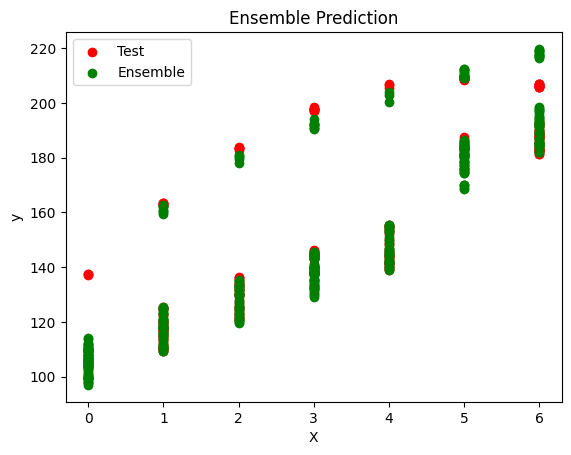

In [64]:
plt.scatter(X_test[:,0], y_test, label='Test', color='red')
plt.scatter(X_test[:,0], sim.predict(X_test), label='Ensemble', color='green')
plt.xlabel('X')
plt.ylabel('y')
plt.title('Ensemble Prediction')
plt.legend()
plt.show()

### Functions 

### Tests

In [ ]:
X, y = datasets[0]()
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2)
seed = 10

t0 = time.time()
elite, gp_pop = gp(X_train=X_train, y_train=y_train, full_return=True, test_elite=False, dataset_name='test',
                       selector='tournament', n_iter=2000, pop_size=100,
                       max_depth=8, init_depth=3, p_xo=0.8, down_sampling=0.8, seed=seed, verbose=0,
                       )

print('TOURNAMENT - RMSE TEST:', rmse(elite.predict(X_test), y_test), 'COMPLEXITY:', elite.total_nodes, 'TIME:', time.time()-t0)

t0 = time.time()
elite, gp_pop = gp(X_train=X_train, y_train=y_train, full_return=True, test_elite=False, dataset_name='test',
                       selector='dalex', n_iter=2000, pop_size=100,
                       max_depth=8, init_depth=3, p_xo=0.8, down_sampling=0.8, seed=seed, verbose=0,
                       )

print('DALEX - RMSE TEST:', rmse(elite.predict(X_test), y_test), 'COMPLEXITY:', elite.total_nodes, 'TIME:', time.time()-t0)

t0 = time.time()
elite, gp_pop = gp(X_train=X_train, y_train=y_train, full_return=True, test_elite=False, dataset_name='test',
                       selector='dalex_size', n_iter=2000, pop_size=100,
                       max_depth=8, init_depth=3, p_xo=0.8, down_sampling=0.8, seed=seed, verbose=0,
                       )

print('DALEX_SIZE - RMSE TEST:', rmse(elite.predict(X_test), y_test), 'COMPLEXITY:', elite.total_nodes, 'TIME:', time.time()-t0)

In [10]:
t0 = time.time()
elite, gp_pop = gp(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, full_return=True, test_elite=True, dataset_name='test',
                       selector='dalex', n_iter=1000, pop_size=200, particularity_pressure=100,
                       max_depth=8, init_depth=3, p_xo=0.8, down_sampling=1, seed=seed, verbose=1,
                       )

print('DALEX_SIZE_2 - RMSE TEST:', rmse(elite.predict(X_test), y_test), 'COMPLEXITY:', elite.total_nodes, 'TIME:', time.time()-t0)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |     110.198     |     161.612     |      0.005      |        3        |      3.875      |    1823796141   |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |     110.198     |     161.612     |      0.016      

In [24]:
seed = 10

X, y = datasets[10]()
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.25)

params = GPParameters(pop_size=200, n_iter=2000, max_depth=7, init_depth=3,
                      selector='dalex', p_xo=0.8, down_sampling=1)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                gp_version='gp', params_gp=params,
                                full_return=True, seed=seed, verbose=1, pop_size=200, n_iter=2000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=5, depth_condition=6, 
                                test_elite=True, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      7.808      |      7.489      |      0.009      |        7        |      4.370      |      181327     |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |      7.808      |      7.489      |      0.021      

In [10]:
seed = 10

X, y = datasets[0]()
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2)

params = GPParameters(pop_size=100, n_iter=1000, max_depth=7, init_depth=3,
                      selector='dalex', p_xo=0.8, down_sampling=1)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train, y_train=y_train, dataset_name='test',
                                gp_version='gp', params_gp=params, population=spec_pop,
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=5000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=5, depth_condition=6, 
                                test_elite=False, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |   total_nodes   |  average_depth  |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      29.242     |       None      |      0.024      |        1        |        73       |      2.080      |      65210      |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|


In [67]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train, min_usage=0.1)
simplified_ensemble = MultiTree(simplified_tree)

# Evaluate performance
y_pred = simplified_ensemble.predict(X_train)
print(f"Original RMSE: {rmse(y_train, ensemble_tree.predict(X_train)):.4f}")
print(f"Simplified RMSE: {rmse(y_train, y_pred):.4f}")

# Evaluate performance
y_pred = simplified_ensemble.predict(X_test)
print(f"Original RMSE: {rmse(y_test, ensemble_tree.predict(X_test)):.4f}")
print(f"Simplified RMSE: {rmse(y_test, y_pred):.4f}")

rmse_results = calculate_specialist_rmse(
    ensemble_tree=simplified_ensemble,
    X_train=X_train,
    y_train=y_train,
)
masks = get_specialist_masks(simplified_ensemble.collection, X_train)

print(rmse_results)

Original RMSE: 31.3603
Simplified RMSE: 33.5214
Original RMSE: 75.1649
Simplified RMSE: 64.4837
{'S_0': (np.int64(193), np.float64(35.654303616456744)), 'S_88': (np.int64(105), np.float64(29.19727987685094))}


In [72]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train, min_usage=0.1)
simplified_ensemble = MultiTree(simplified_tree)

# Evaluate performance
y_pred = simplified_ensemble.predict(X_train)
print(f"Original RMSE: {rmse(y_train, ensemble_tree.predict(X_train)):.4f}")
print(f"Simplified RMSE: {rmse(y_train, y_pred):.4f}")

# Evaluate performance
y_pred = simplified_ensemble.predict(X_test)
print(f"Original RMSE: {rmse(y_test, ensemble_tree.predict(X_test)):.4f}")
print(f"Simplified RMSE: {rmse(y_test, y_pred):.4f}")

rmse_results = calculate_specialist_rmse(
    ensemble_tree=simplified_ensemble,
    X_train=X_train,
    y_train=y_train,
)
masks = get_specialist_masks(simplified_ensemble.collection, X_train)

print(rmse_results)

Original RMSE: 31.3603
Simplified RMSE: 33.5214
Original RMSE: 75.1649
Simplified RMSE: 64.4837
{'S_0': (np.int64(193), np.float64(35.654303616456744)), 'S_88': (np.int64(105), np.float64(29.19727987685094))}


In [73]:
rmse_threshold = -0.025

final_repr, final_rmse = recursive_simplification(simplified_ensemble.SPECIALISTS['S_0'], rmse_threshold, X_train[masks['S_0']], y_train[masks['S_0']], max_iterations=50, verbose=True)
    
print("\nFinal simplified tree representation:")
print(final_repr)
print("Final RMSE:", final_rmse)

# Create a new tree object with the final representation
final_tree = GP_Tree(final_repr)

Iteration 1: improved RMSE from 35.6543 to 35.6466
Iteration 2: improved RMSE from 35.6466 to 35.6543
Iteration 3: improved RMSE from 35.6543 to 35.6663
Iteration 4: improved RMSE from 35.6663 to 35.6818
Iteration 5: improved RMSE from 35.6818 to 35.8010

Final simplified tree representation:
('add', ('multiply', 'constant__0.09', ('divide', ('divide', 'x8', ('add', 'x18', 'x8')), ('divide', 'constant__0.68', ('add', 'x18', 'x8')))), ('add', 'x27', ('add', ('divide', ('multiply', 'x32', ('subtract', 'constant_0.35', 'x37')), ('add', 'x18', 'x8')), 'x8')))
Final RMSE: 35.80099056021699


In [82]:
# rerun GP 
params = GPParameters(pop_size=100, n_iter=2000, max_depth=8, init_depth=3, selector='dalex', p_xo=0.6, down_sampling=0.5)
# params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3, selector='tournament', p_xo=0.8)

sp1_new, population = gp(X_train=X_train[masks['S_0']], y_train=y_train[masks['S_0']], dataset_name='test', verbose=1,
                                test_elite=False, full_return=True, seed=seed, **params.__dict__, elite_tree=sp1_new,
                                )

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      32.619     |       None      |      0.004      |        51       |      4.780      |     77783276    |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |      32.603     |       None      |      0.035      

In [43]:
copy_simplified = MultiTree(simplified_ensemble.collection) 
copy_simplified.SPECIALISTS['S_52'] = sp1_new 

print(rmse(copy_simplified.predict(X_train), y_train))
print(rmse(simplified_ensemble.predict(X_train), y_train))

calculate_specialist_rmse(
    ensemble_tree=copy_simplified,
    X_train=X_train,
    y_train=y_train,
)

23.966702445801243
23.966702445801243


{'S_52': (np.int64(107), np.float64(19.275327745567242)),
 'S_21': (np.int64(191), np.float64(26.23069705612855))}

### Synthetic datasets

Ways to make a synthetic piecewise dataset harder: 
1. Harder conditions: harder functions for conditions 
2. Harder functions: more complex functions for the pieces 
3. Clear-cut discontinuous pieces: pieces that are not continuous between themselves (probably are uncommon in real life)
4. More pieces: more pieces in the function 
5. More dimensions: more dimensions in the function -> more features 
6. Noise in the data 

Class 1 has 318 samples, and class 2 has 182 samples
Class 1 has 167 samples, and class 2 has 333 samples
Class distribution:  98 142 135 125
Class distribution:  114 127 118 141
Class distribution:  214 286
Class distribution:  368 132
Class distribution:  143 357
Class distribution:  69 147 147 137
Class distribution:  147 95 258


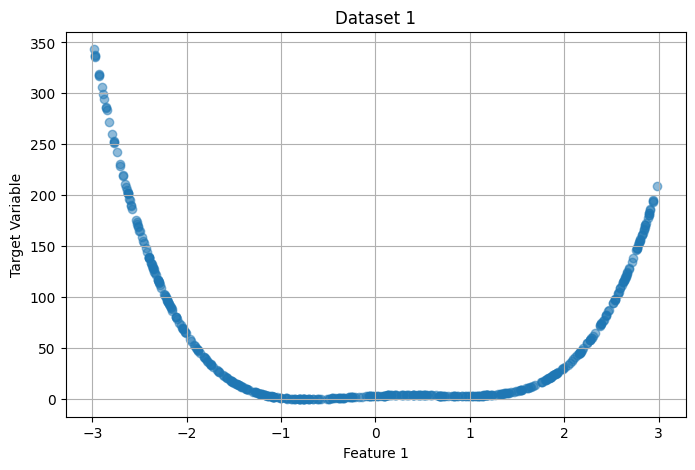

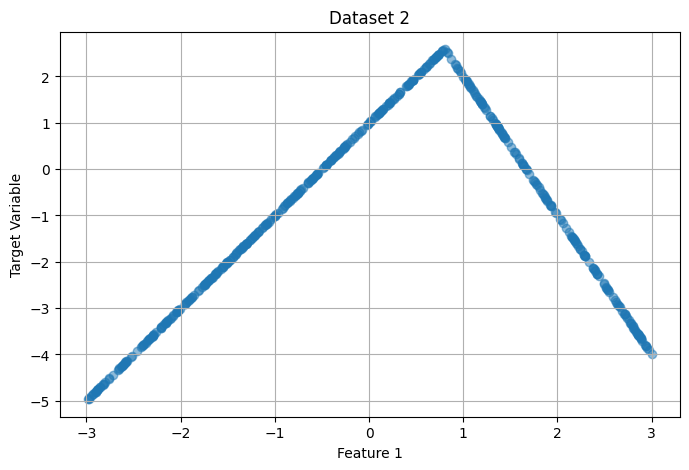

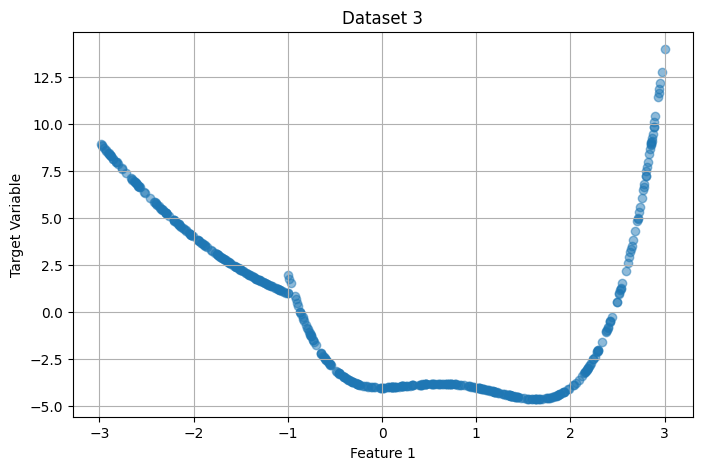

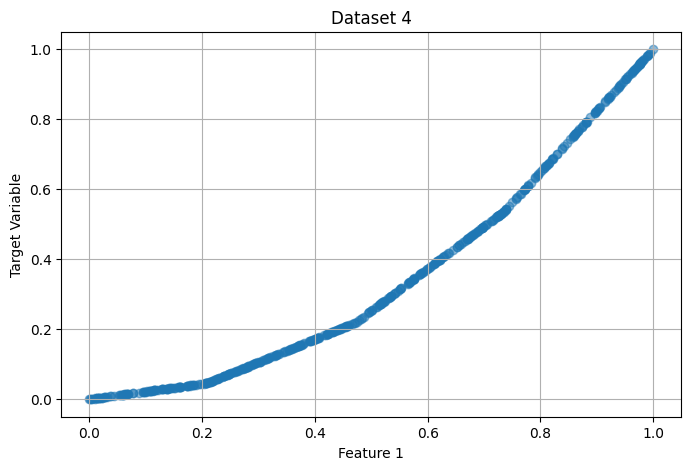

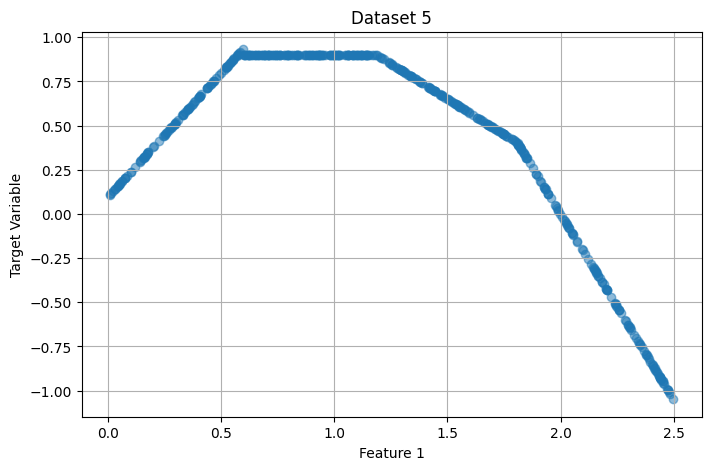

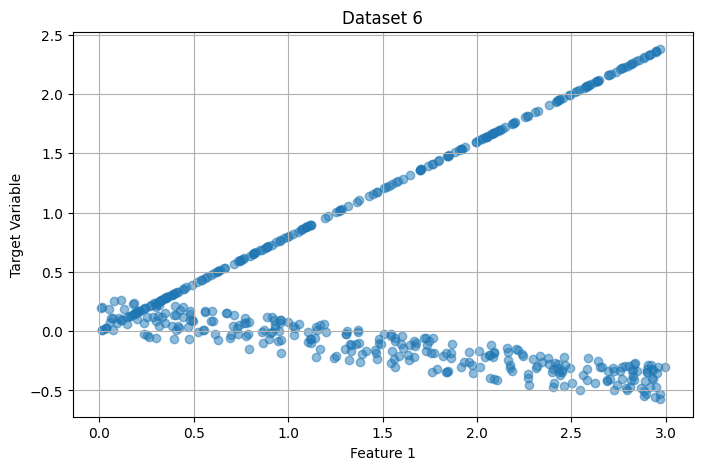

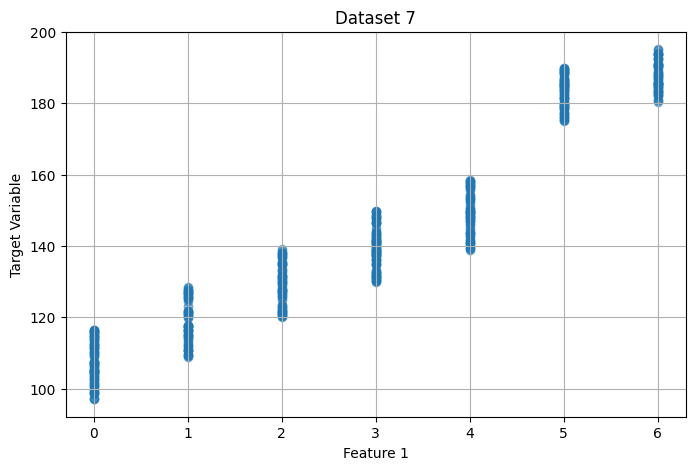

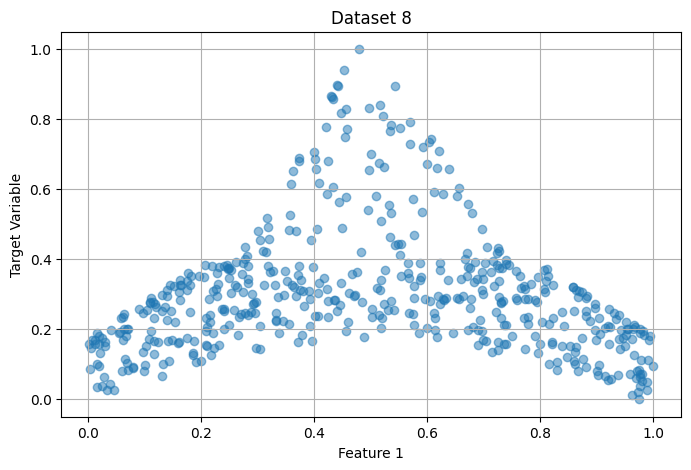

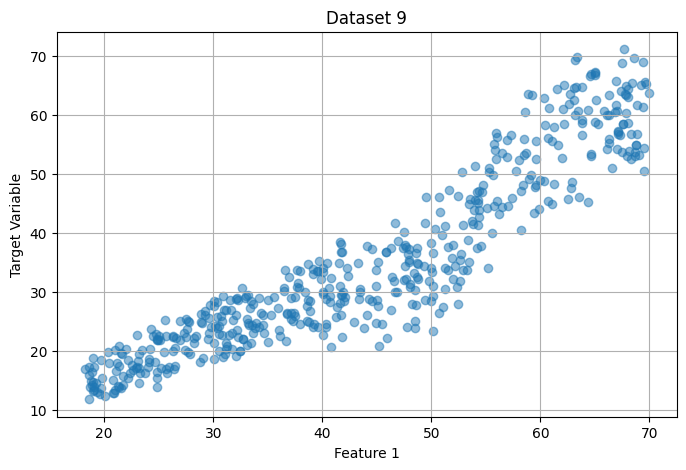

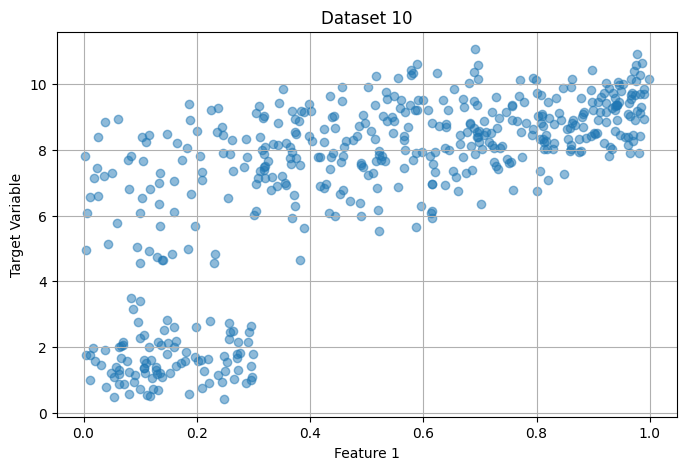

In [7]:
# Plot the datasets 
x1, y1, mask1 = dataset1(n=500, seed=0, noise=0)
x2, y2, mask2 = dataset2(n=500, seed=0, noise=0)
x3, y3, mask3 = dataset3(n=500, seed=0, noise=0)
x4, y4, mask4 = dataset4(n=500, seed=0, noise=0)
x5, y5, mask5 = dataset5(n=500, seed=0, noise=0)
x6, y6, mask6 = dataset6(n=500, seed=0, noise=0)
x7, y7, mask7 = dataset7(n=500, seed=0, noise=0)
x8, y8, mask8 = dataset8(n=500, seed=0, noise=0)
x9, y9, mask9 = dataset9(n=500, seed=0, noise=0)
x10, y10, mask10 = dataset10(n=500, seed=0, noise=0)   

def plot_dataset(x, y, title):
    """
    Function to plot the dataset
    """
    plt.figure(figsize=(8, 5))
    plt.scatter(x[:, 0], y, alpha=0.5)
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Target Variable')
    plt.grid()
    plt.show()
plot_dataset(x1, y1, 'Dataset 1')
plot_dataset(x2, y2, 'Dataset 2')
plot_dataset(x3, y3, 'Dataset 3')
plot_dataset(x4, y4, 'Dataset 4')
plot_dataset(x5, y5, 'Dataset 5')
plot_dataset(x6, y6, 'Dataset 6')
plot_dataset(x7, y7, 'Dataset 7')
plot_dataset(x8, y8, 'Dataset 8')
plot_dataset(x9, y9, 'Dataset 9')
plot_dataset(x10, y10, 'Dataset 10')    

#### Dataset 1

In [5]:
seed = 0

train_indices, test_indices = train_test_split(x1, y1, p_test=0.2, indices_only=True)
X_train_1 = x1[train_indices]
y_train_1 = y1[train_indices]

mask1_train = []
for item in mask1: 
    mask1_train.append(item[train_indices])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                      selector='dalex', p_xo=0.6, down_sampling=0.5)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_1, y_train=y_train_1, dataset_name='synthetic_1',
                                gp_version='gp', params_gp=params, # population=spec_pop, 
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=5, depth_condition=6, 
                                test_elite=False, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|   synthetic_1   |        0        |      94.063     |       None      |      0.004      |        3        |      4.200      |        3        |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|   synthetic_1   |        1        |      90.133     |       None      |      0.019      

In [6]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_1, min_usage=0.1)
simplified_ensemble = MultiTree(simplified_tree)
y_pred = simplified_ensemble.predict(X_train_1)
masks = get_specialist_masks(simplified_ensemble.collection, X_train_1)

# Simplify the specialists 
simplification_threshold = -0.025
elite = spec_pop[np.argmin(spec_pop.fit)]
elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_1, y_train_1, max_iterations=50, verbose=True)
elite_simplified = GP_Tree(elite_simplified)

print(f"Original RMSE: {rmse(y_train_1, ensemble_tree.predict(X_train_1)):.4f}")
print(f"Simplified RMSE: {rmse(y_train_1, y_pred):.4f}")
print(f"Elite RMSE: {rmse(y_train_1, elite.predict(X_train_1)):.4f}")
print(f"Elite Simplified RMSE: {rmse(y_train_1, elite_simplified.predict(X_train_1)):.4f}")

# Replace the elite in the ensemble with the simplified version
for sp_id, mask in masks.items():
    specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_1[mask], y_train_1[mask], max_iterations=50, verbose=False)
    specialist_simplified = GP_Tree(specialist_simplified)
    simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

simplified_ensemble = MultiTree(simplified_ensemble.collection) 

# Evaluate performance
rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_1), y_train_1) / spec_pop.fit[np.argmin(spec_pop.fit)] 
complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
total_improvement = rmse_improvement_ratio * complexity_ratio

print(f"RMSE Improvement Ratio: {rmse_improvement_ratio:.4f}")
print(f"Complexity Ratio: {complexity_ratio:.4f}")
print(f"Total Improvement: {total_improvement:.4f}")

if total_improvement < 0.8: 
    # Accept the ensemble 
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_1)
    pred_masks_list = list(masks.values())

else: 
    # The elite wins 
    masks = np.repeat(True, X_train_1.shape[0])
    pred_masks_list = [masks]

composite_distance = compute_composite_mask_distance(mask1_train, pred_masks_list, lambda_penalty=1)
print(f"Composite Distance: {composite_distance:.4f}")

Original RMSE: 1.1391
Simplified RMSE: 1.1391
Elite RMSE: 1.6627
Elite Simplified RMSE: 1.6627
RMSE Improvement Ratio: 0.6981
Complexity Ratio: 1.4267
Total Improvement: 0.9960
Composite Distance: 0.0000


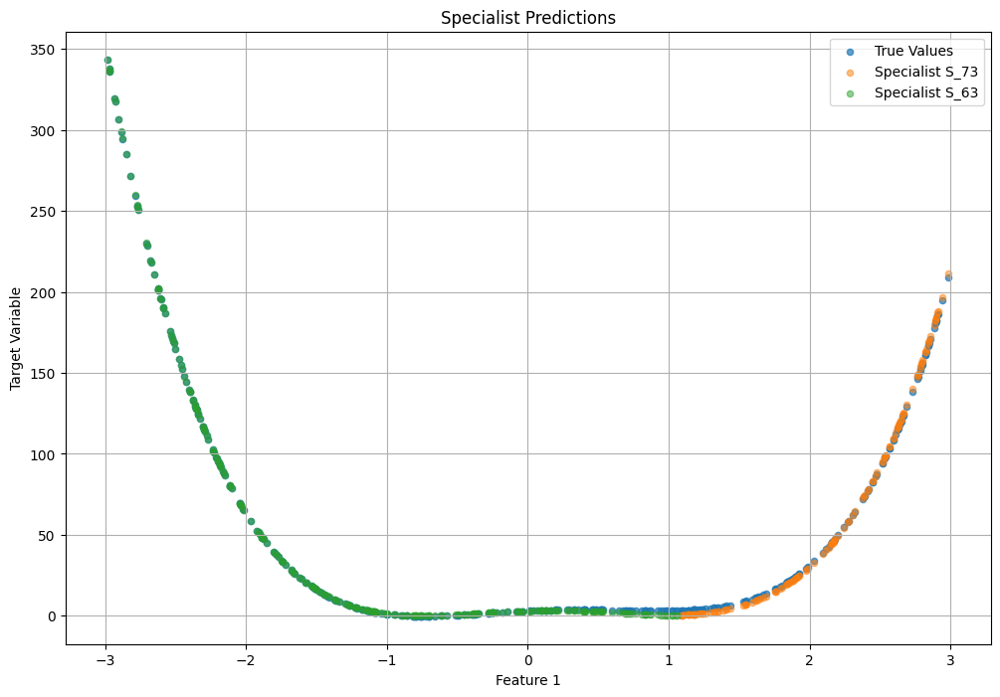

In [7]:
# Scatterplot the predictions
plt.figure(figsize=(12, 8))
plt.scatter(X_train_1[:, 0], y_train_1, alpha=0.7, label='True Values', s=20)
masks = get_specialist_masks(simplified_ensemble.collection, X_train_1)

for sp_id, mask in masks.items():
    plt.scatter(X_train_1[mask][:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_1[mask]), alpha=0.5, label=f'Specialist {sp_id}', s=20)
    # plt.scatter(X_train_1[:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_1), alpha=0.5, label=f'Specialist {sp_id}')
plt.title('Specialist Predictions')
plt.xlabel('Feature 1')
plt.ylabel('Target Variable')
plt.legend()
plt.grid()
plt.show()

Sampling 
_____________________

In [ ]:
train_indices, test_indices = train_test_split(x1, y1, p_test=0.2, indices_only=True)
X_train_1 = x1[train_indices]
y_train_1 = y1[train_indices]

mask1_train = []
for item in mask1: 
    mask1_train.append(item[train_indices])

dataset_subsets = []
for mask_chunk in mask1_train:
    dataset_subsets.append(X_train_1[mask_chunk])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

# -----------------------------------------------------------------------------------------------------------------------------------------------------
data = {
    'ensemble_selected': [],
    'composite_distance': [],
    'n_chunks': [],
    'best_specialists': [],
    'best_possible_combination': [],
    'rmse_improvement_ratio': [],
    'complexity_ratio': [],
    'total_improvement': [],
    'seed': [],
    'rmse': []
}

for seed in tqdm(range(30)): 
    ensemble_selected = False

    # Train the ensemble
    ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_1, y_train=y_train_1, dataset_name='synthetic_1',
                                    gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=100,
                                    n_iter=1000, p_mut=0.7, prob_terminal=0.7, prob_specialist=0.7, max_depth=5, 
                                    depth_condition=6, test_elite=False, timeout=200, verbose=0)   
    
    # Check the best performing individual on each of the dataset subsets
    best_specialists_rmse = [np.inf] * len(dataset_subsets)
    best_specialists = [None] * len(dataset_subsets)
    for i, mask_chunk in enumerate(mask1_train):
        for individual in spec_pop:
            preds = individual.predict(X_train_1[mask_chunk])
            rmse_value = rmse(y_train_1[mask_chunk], preds)
            if rmse_value < best_specialists_rmse[i]:
                best_specialists_rmse[i] = rmse_value
                best_specialists[i] = individual        

    preds, y_true = [], []
    for i, mask_chunk in enumerate(mask1_train):
        preds.extend(best_specialists[i].predict(X_train_1[mask_chunk]))
        y_true.extend(y_train_1[mask_chunk])
    preds = np.array(preds)
    y_true = np.array(y_true)
    best_possible_combination = rmse(y_true, preds)
    
    # Simplify with default 10% threshold
    simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_1, min_usage=0.1)
    simplified_ensemble = MultiTree(simplified_tree)
    y_pred = simplified_ensemble.predict(X_train_1)
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_1)

    # Simplify the specialists 
    simplification_threshold = -0.025
    elite = spec_pop[np.argmin(spec_pop.fit)]
    elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_1, y_train_1, max_iterations=50, verbose=False)
    elite_simplified = GP_Tree(elite_simplified)

    # Replace the elite in the ensemble with the simplified version
    for sp_id, mask in masks.items():
        specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_1[mask], y_train_1[mask], max_iterations=50, verbose=False)
        specialist_simplified = GP_Tree(specialist_simplified)
        simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

    simplified_ensemble = MultiTree(simplified_ensemble.collection) 

    # Evaluate performance
    rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_1), y_train_1) / spec_pop.fit[np.argmin(spec_pop.fit)] 
    complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
    total_improvement = rmse_improvement_ratio * complexity_ratio

    if total_improvement < 0.5: 
        ensemble_selected = True
        # Accept the ensemble 
        masks = get_specialist_masks(simplified_ensemble.collection, X_train_1)
        pred_masks_list = list(masks.values())

    else: 
        # The elite wins 
        masks = np.repeat(True, X_train_1.shape[0])
        pred_masks_list = [masks]

    composite_distance = compute_composite_mask_distance(mask1_train, pred_masks_list, lambda_penalty=1)

    data['ensemble_selected'].append(ensemble_selected)
    data['composite_distance'].append(composite_distance)
    data['n_chunks'].append(len(pred_masks_list))
    data['best_specialists'].append(best_specialists_rmse)
    data['best_possible_combination'].append(best_possible_combination)
    data['rmse_improvement_ratio'].append(rmse_improvement_ratio)
    data['complexity_ratio'].append(complexity_ratio)
    data['total_improvement'].append(total_improvement)
    data['seed'].append(seed)
    data['rmse'].append(rmse(simplified_ensemble.predict(X_train_1), y_train_1))

    # Clear the jupyter output
    clear_output(wait=True)
    display(pd.DataFrame(data))


df1 = pd.DataFrame(data)
df1.set_index('seed', inplace=True)
df1.to_csv('multi_slim_experiments/synthetic_1.csv')

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,False,0.0,1,[1.1391237870995097],1.139124,0.698148,1.426667,0.996024,0,1.160841
1,False,0.0,1,[1.4805386807826055],1.480539,0.313881,2.802817,0.879751,1,1.324003
2,False,0.0,1,[0.9891837054896663],0.989184,0.494056,2.689320,1.328675,2,0.975674
3,False,0.0,1,[0.20128584513675313],0.201286,0.285489,2.263158,0.646107,3,0.201286
4,False,0.0,1,[1.1230467501127688],1.123047,0.615615,3.512821,2.162545,4,1.113212
5,False,0.0,1,[0.4873525363315615],0.487353,0.442592,2.042254,0.903885,5,0.487353
6,False,0.0,1,[2.805159120897682],2.805159,0.908258,1.810811,1.644684,6,2.791680
7,False,0.0,1,[4.016980721138106],4.016981,0.730955,3.101695,2.267199,7,3.746710
8,False,0.0,1,[1.1100654746619394],1.110065,0.533228,3.378378,1.801447,8,1.110065
9,False,0.0,1,[0.16766905566079998],0.167669,0.350015,2.674074,0.935965,9,0.167669


100%|██████████| 30/30 [42:42<00:00, 85.41s/it]


#### Dataset 2

In [ ]:
seed = 0

train_indices, test_indices = train_test_split(x2, y2, p_test=0.2, indices_only=True)
X_train_2 = x2[train_indices]
y_train_2 = y2[train_indices]

mask2_train = []
for item in mask2: 
    mask2_train.append(item[train_indices])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                      selector='dalex', p_xo=0.6, down_sampling=0.5)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_2, y_train=y_train_2, dataset_name='synthetic_2',
                                gp_version='gp', params_gp=params, # population=spec_pop, 
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=5, depth_condition=6, 
                                test_elite=False, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|   synthetic_2   |        0        |      2.141      |       None      |      0.002      |        3        |      4.220      |        11       |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|   synthetic_2   |        1        |      2.125      |       None      |      0.023      

In [30]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_2, min_usage=0.1)
simplified_ensemble = MultiTree(simplified_tree)
y_pred = simplified_ensemble.predict(X_train_2)
masks = get_specialist_masks(simplified_ensemble.collection, X_train_2)

# Simplify the specialists 
simplification_threshold = -0.025
elite = spec_pop[np.argmin(spec_pop.fit)]
elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_2, y_train_2, max_iterations=50, verbose=True)
elite_simplified = GP_Tree(elite_simplified)

print(f"Original RMSE: {rmse(y_train_2, ensemble_tree.predict(X_train_2)):.4f}")
print(f"Simplified RMSE: {rmse(y_train_2, y_pred):.4f}")
print(f"Elite RMSE: {rmse(y_train_2, elite.predict(X_train_2)):.4f}")
print(f"Elite Simplified RMSE: {rmse(y_train_2, elite_simplified.predict(X_train_2)):.4f}")

# Replace the elite in the ensemble with the simplified version
for sp_id, mask in masks.items():
    specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_2[mask], y_train_2[mask], max_iterations=50, verbose=False)
    specialist_simplified = GP_Tree(specialist_simplified)
    simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

simplified_ensemble = MultiTree(simplified_ensemble.collection) 

# Evaluate performance
rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_2), y_train_2) / spec_pop.fit[np.argmin(spec_pop.fit)] 
complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
total_improvement = rmse_improvement_ratio * complexity_ratio

print(f"RMSE Improvement Ratio: {rmse_improvement_ratio:.4f}")
print(f"Complexity Ratio: {complexity_ratio:.4f}")
print(f"Total Improvement: {total_improvement:.4f}")

if total_improvement < 0.8: 
    # Accept the ensemble 
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_2)
    pred_masks_list = list(masks.values())

else: 
    # The elite wins 
    masks = np.repeat(True, X_train_2.shape[0])
    pred_masks_list = [masks]

composite_distance = compute_composite_mask_distance(mask2_train, pred_masks_list, lambda_penalty=1)
print(f"Composite Distance: {composite_distance:.4f}")

Original RMSE: 0.1619
Simplified RMSE: 0.2395
Elite RMSE: 0.6458
Elite Simplified RMSE: 0.6458
RMSE Improvement Ratio: 0.3708
Complexity Ratio: 1.8302
Total Improvement: 0.6787
Composite Distance: 0.0650


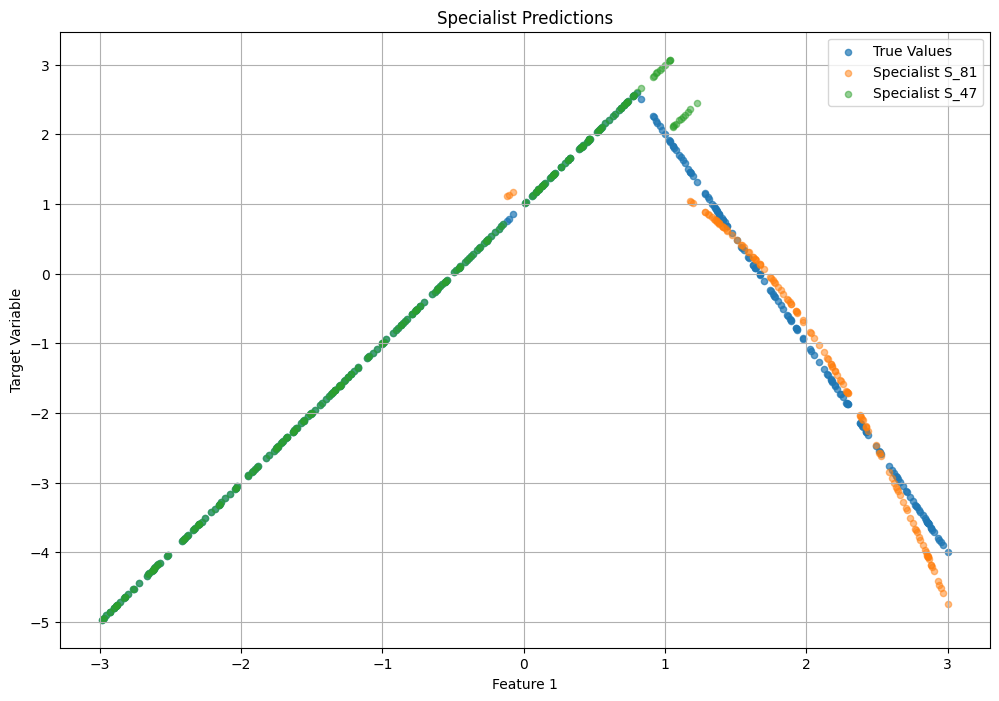

In [23]:
# Scatterplot the predictions
plt.figure(figsize=(12, 8))
plt.scatter(X_train_2[:, 0], y_train_2, alpha=0.7, label='True Values', s=20)

for sp_id, mask in masks.items():
    plt.scatter(X_train_2[mask][:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_2[mask]), alpha=0.5, label=f'Specialist {sp_id}', s=20)
    # plt.scatter(X_train_2[:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_2), alpha=0.5, label=f'Specialist {sp_id}')
plt.title('Specialist Predictions')
plt.xlabel('Feature 1')
plt.ylabel('Target Variable')
plt.legend()
plt.grid()
plt.show()

Sampling 
_____________________

In [ ]:
train_indices, test_indices = train_test_split(x2, y2, p_test=0.2, indices_only=True)
X_train_2 = x2[train_indices]
y_train_2 = y2[train_indices]

mask2_train = []
for item in mask2: 
    mask2_train.append(item[train_indices])

dataset_subsets = []
for mask_chunk in mask2_train:
    dataset_subsets.append(X_train_2[mask_chunk])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

# -----------------------------------------------------------------------------------------------------------------------------------------------------
data = {
    'ensemble_selected': [],
    'composite_distance': [],
    'n_chunks': [],
    'best_specialists': [],
    'best_possible_combination': [],
    'rmse_improvement_ratio': [],
    'complexity_ratio': [],
    'total_improvement': [],
    'seed': [],
    'rmse': []
}

for seed in tqdm(range(30)): 
    ensemble_selected = False

    # Train the ensemble
    ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_2, y_train=y_train_2, dataset_name='synthetic_1',
                                    gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=1000,
                                    n_iter=10, p_mut=0.7, prob_terminal=0.7, prob_specialist=0.7, max_depth=5, 
                                    depth_condition=6, test_elite=False, timeout=200, verbose=0)   
    
    # Check the best performing individual on each of the dataset subsets
    best_specialists_rmse = [np.inf] * len(dataset_subsets)
    best_specialists = [None] * len(dataset_subsets)
    for i, mask_chunk in enumerate(mask2_train):
        for individual in spec_pop:
            preds = individual.predict(X_train_2[mask_chunk])
            rmse_value = rmse(y_train_2[mask_chunk], preds)
            if rmse_value < best_specialists_rmse[i]:
                best_specialists_rmse[i] = rmse_value
                best_specialists[i] = individual
    preds, y_true = [], []
    for i, mask_chunk in enumerate(mask2_train):
        preds.extend(best_specialists[i].predict(X_train_2[mask_chunk]))
        y_true.extend(y_train_2[mask_chunk])
    preds = np.array(preds)
    y_true = np.array(y_true)
    best_possible_combination = rmse(y_true, preds)
    
    # Simplify with default 10% threshold
    simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_2, min_usage=0.1)
    simplified_ensemble = MultiTree(simplified_tree)
    y_pred = simplified_ensemble.predict(X_train_2)
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_2)

    # Simplify the specialists 
    simplification_threshold = -0.025
    elite = spec_pop[np.argmin(spec_pop.fit)]
    elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_2, y_train_2, max_iterations=50, verbose=False)
    elite_simplified = GP_Tree(elite_simplified)

    # Replace the elite in the ensemble with the simplified version
    for sp_id, mask in masks.items():
        specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_2[mask], y_train_2[mask], max_iterations=50, verbose=False)
        specialist_simplified = GP_Tree(specialist_simplified)
        simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

    simplified_ensemble = MultiTree(simplified_ensemble.collection) 

    # Evaluate performance
    rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_2), y_train_2) / spec_pop.fit[np.argmin(spec_pop.fit)] 
    complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
    total_improvement = rmse_improvement_ratio * complexity_ratio

    if total_improvement < 1: 
        ensemble_selected = True
        # Accept the ensemble 
        masks = get_specialist_masks(simplified_ensemble.collection, X_train_2)
        pred_masks_list = list(masks.values())

    else: 
        # The elite wins 
        masks = np.repeat(True, X_train_2.shape[0])
        pred_masks_list = [masks]

    composite_distance = compute_composite_mask_distance(mask2_train, pred_masks_list, lambda_penalty=1)

    data['ensemble_selected'].append(ensemble_selected)
    data['n_chunks'].append(len(pred_masks_list))
    data['best_specialists'].append(best_specialists_rmse)
    data['best_possible_combination'].append(best_possible_combination)
    data['composite_distance'].append(composite_distance)
    data['rmse_improvement_ratio'].append(rmse_improvement_ratio)
    data['complexity_ratio'].append(complexity_ratio)
    data['total_improvement'].append(total_improvement)
    data['seed'].append(seed)
    data['rmse'].append(rmse(simplified_ensemble.predict(X_train_2), y_train_2))

    # Clear the jupyter output
    clear_output(wait=True)
    display(pd.DataFrame(data))

df2 = pd.DataFrame(data)
df2.set_index('seed', inplace=True)
df2.to_csv('multi_slim_experiments/synthetic_2.csv')

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,True,0.0200,2,"[0.0, 0.30648012289295956]",0.187680,0.313246,1.339623,0.419631,0,0.202309
1,True,0.0200,2,"[0.0003030303030302044, 0.28446789396494926]",0.174200,0.379675,1.849315,0.702138,1,0.174336
2,False,1.3750,1,"[1.8324566506845485e-16, 0.3582822033577256]",0.219402,0.742123,2.087379,1.549092,2,0.287336
3,False,1.3750,1,"[0.0, 0.14102303684210066]",0.086359,0.470357,4.733333,2.226357,3,0.134444
4,False,1.3750,1,"[3.780667636661188e-15, 0.3687470829599741]",0.225811,0.825948,2.560976,2.115232,4,0.273777
5,True,0.0250,2,"[0.0, 0.2993324656161027]",0.183303,0.675840,1.292135,0.873276,5,0.257482
6,False,1.3750,1,"[0.0, 0.34483280374515024]",0.211166,0.510027,2.157895,1.100584,6,0.203463
7,False,1.3750,1,"[0.0, 0.27731447743440174]",0.169820,0.537157,2.351351,1.263045,7,0.197050
8,False,1.3750,1,"[0.0, 0.3767918256326559]",0.230737,1.428021,1.493827,2.133216,8,0.383542
9,True,0.0200,2,"[0.0, 0.324261080179485]",0.198569,0.432756,1.329670,0.575423,9,0.202520


100%|██████████| 30/30 [33:04<00:00, 66.16s/it]


####  Dataset 3

In [8]:
seed = 0

train_indices, test_indices = train_test_split(x3, y3, p_test=0.2, indices_only=True)
X_train_3 = x3[train_indices]
y_train_3 = y3[train_indices]

mask3_train = []
for item in mask3: 
    mask3_train.append(item[train_indices])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                      selector='dalex', p_xo=0.6, down_sampling=0.5)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_3, y_train=y_train_3, dataset_name='synthetic_3',
                                gp_version='gp', params_gp=params, population=spec_pop, 
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=5, depth_condition=6, 
                                test_elite=False, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |   total_nodes   |  average_depth  |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|   synthetic_3   |        0        |      1.253      |       None      |      0.033      |        1        |        93       |      2.140      |        8        |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|


In [9]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_3, min_usage=0.1)
simplified_ensemble = MultiTree(simplified_tree)
y_pred = simplified_ensemble.predict(X_train_3)
masks = get_specialist_masks(simplified_ensemble.collection, X_train_3)

# Simplify the specialists 
simplification_threshold = -0.025
elite = spec_pop[np.argmin(spec_pop.fit)]
elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_3, y_train_3, max_iterations=50, verbose=False)
elite_simplified = GP_Tree(elite_simplified)

print(f"Original RMSE: {rmse(y_train_3, ensemble_tree.predict(X_train_3)):.4f}")
print(f"Simplified RMSE: {rmse(y_train_3, y_pred):.4f}")
print(f"Elite RMSE: {rmse(y_train_3, elite.predict(X_train_3)):.4f}")
print(f"Elite Simplified RMSE: {rmse(y_train_3, elite_simplified.predict(X_train_3)):.4f}")

# Replace the elite in the ensemble with the simplified version
for sp_id, mask in masks.items():
    specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_3[mask], y_train_3[mask], max_iterations=50, verbose=False)
    specialist_simplified = GP_Tree(specialist_simplified)
    simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

simplified_ensemble = MultiTree(simplified_ensemble.collection) 

# Evaluate performance
rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_3), y_train_3) / spec_pop.fit[np.argmin(spec_pop.fit)] 
complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
total_improvement = rmse_improvement_ratio * complexity_ratio

print(f"RMSE Improvement Ratio: {rmse_improvement_ratio:.4f}")
print(f"Complexity Ratio: {complexity_ratio:.4f}")
print(f"Total Improvement: {total_improvement:.4f}")

masks = get_specialist_masks(simplified_ensemble.collection, X_train_3)

if total_improvement < 0.8: 
    # Accept the ensemble 
    pred_masks_list = list(masks.values())

else: 
    # The elite wins 
    masks = np.repeat(True, X_train_3.shape[0])
    pred_masks_list = [masks]

composite_distance = compute_composite_mask_distance(mask3_train, pred_masks_list, lambda_penalty=1)
print(f"Composite Distance: {composite_distance:.4f}")

Original RMSE: 1.0382
Simplified RMSE: 1.0633
Elite RMSE: 1.2529
Elite Simplified RMSE: 1.2737
RMSE Improvement Ratio: 0.8427
Complexity Ratio: 1.5376
Total Improvement: 1.2958
Composite Distance: 1.3225


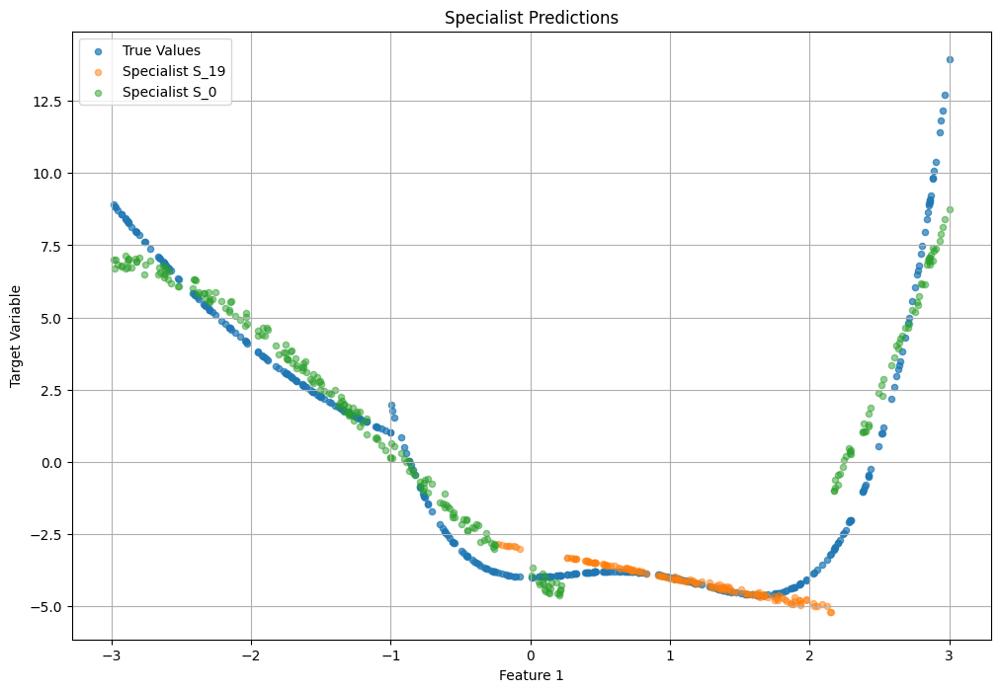

In [11]:
# Scatterplot the predictions
plt.figure(figsize=(12, 8))
plt.scatter(X_train_3[:, 0], y_train_3, alpha=0.7, label='True Values', s=20)

masks = get_specialist_masks(simplified_ensemble.collection, X_train_3)

for sp_id, mask in masks.items():
    plt.scatter(X_train_3[mask][:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_3[mask]), alpha=0.5, label=f'Specialist {sp_id}', s=20)
    # plt.scatter(X_train_3[:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_3), alpha=0.5, label=f'Specialist {sp_id}')
plt.title('Specialist Predictions')
plt.xlabel('Feature 1')
plt.ylabel('Target Variable')
plt.legend()
plt.grid()
plt.show()

Sampling 
_____________________

In [ ]:
train_indices, test_indices = train_test_split(x3, y3, p_test=0.2, indices_only=True)
X_train_3 = x3[train_indices]
y_train_3 = y3[train_indices]

mask3_train = []
for item in mask3: 
    mask3_train.append(item[train_indices])

dataset_subsets = []
for mask_chunk in mask3_train:
    dataset_subsets.append(X_train_3[mask_chunk])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

# -----------------------------------------------------------------------------------------------------------------------------------------------------
data = {
    'ensemble_selected': [],
    'composite_distance': [],
    'n_chunks': [],
    'best_specialists': [],
    'best_possible_combination': [],
    'rmse_improvement_ratio': [],
    'complexity_ratio': [],
    'total_improvement': [],
    'seed': [],
    'rmse': []
}

for seed in tqdm(range(30)): 
    ensemble_selected = False

    # Train the ensemble
    ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_3, y_train=y_train_3, dataset_name='synthetic_1',
                                    gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=1000,
                                    n_iter=10, p_mut=0.7, prob_terminal=0.7, prob_specialist=0.7, max_depth=5, 
                                    depth_condition=6, test_elite=False, timeout=200, verbose=0)   
    
    # Check the best performing individual on each of the dataset subsets
    best_specialists_rmse = [np.inf] * len(dataset_subsets)
    best_specialists = [None] * len(dataset_subsets)
    for i, mask_chunk in enumerate(mask3_train):
        for individual in spec_pop:
            preds = individual.predict(X_train_3[mask_chunk])
            rmse_value = rmse(y_train_3[mask_chunk], preds)
            if rmse_value < best_specialists_rmse[i]:
                best_specialists_rmse[i] = rmse_value
                best_specialists[i] = individual
    preds, y_true = [], []
    for i, mask_chunk in enumerate(mask3_train):
        preds.extend(best_specialists[i].predict(X_train_3[mask_chunk]))
        y_true.extend(y_train_3[mask_chunk])
    preds = np.array(preds)
    y_true = np.array(y_true)
    best_possible_combination = rmse(y_true, preds)
    
    # Simplify with default 10% threshold
    simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_3, min_usage=0.1)
    simplified_ensemble = MultiTree(simplified_tree)
    y_pred = simplified_ensemble.predict(X_train_3)
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_3)

    # Simplify the specialists 
    simplification_threshold = -0.025
    elite = spec_pop[np.argmin(spec_pop.fit)]
    elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_3, y_train_3, max_iterations=50, verbose=False)
    elite_simplified = GP_Tree(elite_simplified)

    # Replace the elite in the ensemble with the simplified version
    for sp_id, mask in masks.items():
        specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_3[mask], y_train_3[mask], max_iterations=50, verbose=False)
        specialist_simplified = GP_Tree(specialist_simplified)
        simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

    simplified_ensemble = MultiTree(simplified_ensemble.collection) 

    # Evaluate performance
    rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_3), y_train_3) / spec_pop.fit[np.argmin(spec_pop.fit)] 
    complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
    total_improvement = rmse_improvement_ratio * complexity_ratio

    if total_improvement < 1: 
        ensemble_selected = True
        # Accept the ensemble 
        masks = get_specialist_masks(simplified_ensemble.collection, X_train_3)
        pred_masks_list = list(masks.values())

    else: 
        # The elite wins 
        masks = np.repeat(True, X_train_3.shape[0])
        pred_masks_list = [masks]

    composite_distance = compute_composite_mask_distance(mask3_train, pred_masks_list, lambda_penalty=1)

    data['ensemble_selected'].append(ensemble_selected)
    data['n_chunks'].append(len(pred_masks_list))
    data['best_specialists'].append(best_specialists_rmse)
    data['best_possible_combination'].append(best_possible_combination)    
    data['composite_distance'].append(composite_distance)
    data['rmse_improvement_ratio'].append(rmse_improvement_ratio)
    data['complexity_ratio'].append(complexity_ratio)
    data['total_improvement'].append(total_improvement)
    data['seed'].append(seed)
    data['rmse'].append(rmse(simplified_ensemble.predict(X_train_3), y_train_3))

    # Clear the jupyter output
    clear_output(wait=True)
    display(pd.DataFrame(data))

df3 = pd.DataFrame(data)
df3.set_index('seed', inplace=True)

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,True,0.27750,2,"[0.00659762353459266, 2.3173110410364536e-15]",3.746730e-03,0.064641,1.575342,0.101831,0,0.107633
1,False,1.37500,1,"[0.0, 1.6580818235808092]",1.364774e+00,0.953409,1.881356,1.793702,1,1.387025
2,True,0.15750,2,"[0.0, 0.6842770868296676]",5.632311e-01,0.506084,1.666667,0.843473,2,0.561324
3,True,0.14750,2,"[0.0, 2.3176250610990152e-15]",1.907646e-15,0.530955,1.308943,0.694989,3,0.557954
4,True,0.15750,2,"[0.0, 0.636966208434138]",5.242894e-01,0.269626,2.226667,0.600366,4,0.456284
5,False,1.37500,1,"[0.14601219646937938, 1.6497638827341374]",1.360456e+00,0.597422,3.078431,1.839124,5,1.225953
6,False,1.37500,1,"[0.0, 1.8565019359579282]",1.528094e+00,0.800463,5.000000,4.002315,6,1.647665
7,False,1.37500,1,"[1.4629833510615784e-16, 1.5452158923806412]",1.271873e+00,0.792377,3.425532,2.714311,7,1.249745
8,True,0.13000,2,"[0.0, 0.7947406490621759]",6.541541e-01,0.404452,1.427184,0.577228,8,0.583979
9,False,1.37500,1,"[0.0, 2.0375697438655758]",1.677132e+00,0.884890,1.823529,1.613622,9,1.680041


100%|██████████| 30/30 [33:16<00:00, 66.54s/it]


#### Dataset 4

In [139]:
# Check correlations between x[:,0], x[:,1] and y
corr = np.corrcoef(x4[:, 0], y4)
print(f"Correlation between x[:,0] and y: {corr[0, 1]:.4f}")
corr = np.corrcoef(x4[:, 1], y4)
print(f"Correlation between x[:,1] and y: {corr[0, 1]:.4f}")

x4[:,1] = x4[:,0]

Correlation between x[:,0] and y: 0.9681
Correlation between x[:,1] and y: 0.9681


In [14]:
seed = 0

train_indices, test_indices = train_test_split(x4, y4, p_test=0.2, indices_only=True)
X_train_4 = x4[train_indices]
y_train_4 = y4[train_indices]

mask4_train = []
for item in mask4: 
    mask4_train.append(item[train_indices])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=7, init_depth=3,
                      selector='dalex', p_xo=0.6, down_sampling=1)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_4, y_train=y_train_4, dataset_name='synthetic_4',
                                gp_version='gp', params_gp=params, # population=spec_pop, 
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=6, depth_condition=6, 
                                test_elite=False, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |    div (var)    |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|   synthetic_4   |        0        |      0.182      |       None      |      0.005      |        5        |      4.220      |       244       |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|   synthetic_4   |        1        |      0.010      |       None      |      0.009      

In [ ]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_4, min_usage=0.1)
simplified_ensemble = MultiTree(simplified_tree)
y_pred = simplified_ensemble.predict(X_train_4)
masks = get_specialist_masks(simplified_ensemble.collection, X_train_4)

# Simplify the specialists 
simplification_threshold = -0.025
elite = spec_pop[np.argmin(spec_pop.fit)]
elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_4, y_train_4, max_iterations=50, verbose=False)
elite_simplified = GP_Tree(elite_simplified)

print(f"Original RMSE: {rmse(y_train_4, ensemble_tree.predict(X_train_4)):.4f}")
print(f"Simplified RMSE: {rmse(y_train_4, y_pred):.4f}")
print(f"Elite RMSE: {rmse(y_train_4, elite.predict(X_train_4)):.4f}")
print(f"Elite Simplified RMSE: {rmse(y_train_4, elite_simplified.predict(X_train_4)):.4f}")

# Replace the elite in the ensemble with the simplified version
for sp_id, mask in masks.items():
    specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_4[mask], y_train_4[mask], max_iterations=50, verbose=False)
    specialist_simplified = GP_Tree(specialist_simplified)
    simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

simplified_ensemble = MultiTree(simplified_ensemble.collection) 

# Evaluate performance
rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_4), y_train_4) / spec_pop.fit[np.argmin(spec_pop.fit)] 
complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
total_improvement = rmse_improvement_ratio * complexity_ratio

print(f"RMSE Improvement Ratio: {rmse_improvement_ratio:.4f}")
print(f"Complexity Ratio: {complexity_ratio:.4f}")
print(f"Total Improvement: {total_improvement:.4f}")

if total_improvement < 0.8: 
    # Accept the ensemble 
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_4)
    pred_masks_list = list(masks.values())

else: 
    # The elite wins 
    masks = np.repeat(True, X_train_4.shape[0])
    pred_masks_list = [masks]

composite_distance = compute_composite_mask_distance(mask4_train, pred_masks_list, lambda_penalty=1)
print(f"Composite Distance: {composite_distance:.4f}")

Original RMSE: 0.0049
Simplified RMSE: 0.0050
Elite RMSE: 0.0050
Elite Simplified RMSE: 0.0050
RMSE Improvement Ratio: 1.0000
Complexity Ratio: 1.0000
Total Improvement: 1.0000
Composite Distance: 3.7275


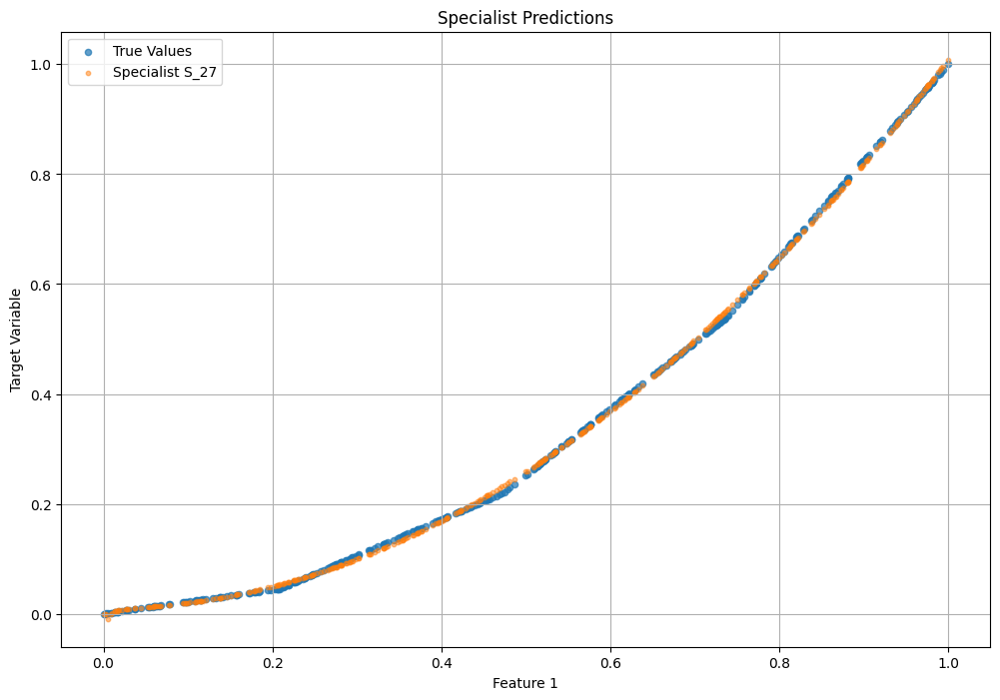

In [21]:
# Scatterplot the predictions
plt.figure(figsize=(12, 8))
plt.scatter(X_train_4[:, 0], y_train_4, alpha=0.7, label='True Values', s=20)

masks = get_specialist_masks(simplified_ensemble.collection, X_train_4)

for sp_id, mask in masks.items():
    plt.scatter(X_train_4[mask][:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_4[mask]), alpha=0.5, label=f'Specialist {sp_id}', s=10)
    # plt.scatter(X_train_4[:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_4), alpha=0.5, label=f'Specialist {sp_id}')
plt.title('Specialist Predictions')
plt.xlabel('Feature 1')
plt.ylabel('Target Variable')
plt.legend()
plt.grid()
plt.show()

sampling 
_____________________

In [ ]:
train_indices, test_indices = train_test_split(x4, y4, p_test=0.2, indices_only=True)
X_train_4 = x4[train_indices]
y_train_4 = y4[train_indices]

mask4_train = []
for item in mask4: 
    mask4_train.append(item[train_indices])

dataset_subsets = []
for mask_chunk in mask4_train:
    dataset_subsets.append(X_train_4[mask_chunk])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

# -----------------------------------------------------------------------------------------------------------------------------------------------------
data = {
    'ensemble_selected': [],
    'composite_distance': [],
    'n_chunks': [],
    'best_specialists': [],
    'best_possible_combination': [],
    'rmse_improvement_ratio': [],
    'complexity_ratio': [],
    'total_improvement': [],
    'seed': [],
    'rmse': []
}

for seed in tqdm(range(30)): 
    ensemble_selected = False

    # Train the ensemble
    ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_4, y_train=y_train_4, dataset_name='synthetic_1',
                                    gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=1000,
                                    n_iter=10, p_mut=0.7, prob_terminal=0.7, prob_specialist=0.7, max_depth=5, 
                                    depth_condition=6, test_elite=False, timeout=200, verbose=0)   
    
    # Check the best performing individual on each of the dataset subsets
    best_specialists_rmse = [np.inf] * len(dataset_subsets)
    best_specialists = [None] * len(dataset_subsets)
    for i, mask_chunk in enumerate(mask4_train):
        for individual in spec_pop:
            preds = individual.predict(X_train_4[mask_chunk])
            rmse_value = rmse(y_train_4[mask_chunk], preds)
            if rmse_value < best_specialists_rmse[i]:
                best_specialists_rmse[i] = rmse_value
                best_specialists[i] = individual
    preds, y_true = [], []
    for i, mask_chunk in enumerate(mask4_train):
        preds.extend(best_specialists[i].predict(X_train_4[mask_chunk]))
        y_true.extend(y_train_4[mask_chunk])
    preds = np.array(preds)
    y_true = np.array(y_true)
    best_possible_combination = rmse(y_true, preds)
    
    # Simplify with default 10% threshold
    simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_4, min_usage=0.1)
    simplified_ensemble = MultiTree(simplified_tree)
    y_pred = simplified_ensemble.predict(X_train_4)
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_4)

    # Simplify the specialists 
    simplification_threshold = -0.025
    elite = spec_pop[np.argmin(spec_pop.fit)]
    elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_4, y_train_4, max_iterations=50, verbose=False)
    elite_simplified = GP_Tree(elite_simplified)

    # Replace the elite in the ensemble with the simplified version
    for sp_id, mask in masks.items():
        specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_4[mask], y_train_4[mask], max_iterations=50, verbose=False)
        specialist_simplified = GP_Tree(specialist_simplified)
        simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

    simplified_ensemble = MultiTree(simplified_ensemble.collection) 

    # Evaluate performance
    rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_4), y_train_4) / spec_pop.fit[np.argmin(spec_pop.fit)] 
    complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
    total_improvement = rmse_improvement_ratio * complexity_ratio

    if total_improvement < 2.5 and rmse_improvement_ratio < 1:  # CHANGED FROM 1 to 2.5 because there will always be more complexity in the ensemble since there are 4 pieces
        ensemble_selected = True
        # Accept the ensemble 
        masks = get_specialist_masks(simplified_ensemble.collection, X_train_4)
        pred_masks_list = list(masks.values())

    else: 
        # The elite wins 
        masks = np.repeat(True, X_train_4.shape[0])
        pred_masks_list = [masks]

    composite_distance = compute_composite_mask_distance(mask4_train, pred_masks_list, lambda_penalty=1)

    data['ensemble_selected'].append(ensemble_selected)
    data['n_chunks'].append(len(pred_masks_list))
    data['best_specialists'].append(best_specialists_rmse)
    data['best_possible_combination'].append(best_possible_combination)    
    data['composite_distance'].append(composite_distance)
    data['rmse_improvement_ratio'].append(rmse_improvement_ratio)
    data['complexity_ratio'].append(complexity_ratio)
    data['total_improvement'].append(total_improvement)
    data['seed'].append(seed)
    data['rmse'].append(rmse(simplified_ensemble.predict(X_train_4), y_train_4))

    # Clear the jupyter output
    clear_output(wait=True)
    display(pd.DataFrame(data))

df4 = pd.DataFrame(data)
df4.set_index('seed', inplace=True)

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,True,2.27125,2,"[0.002142597049257348, 0.00491529248068857, 0....",0.004705,0.971069,2.016949,1.958596,0,0.004870
1,False,3.72750,1,"[0.0028512749160126125, 0.005089221921778749, ...",0.004745,1.000000,1.000000,1.000000,1,0.004943
2,True,2.26875,2,"[0.002522223912829754, 0.004634758283517657, 0...",0.004664,0.970889,1.666667,1.618148,2,0.005074
3,False,3.72750,1,"[0.002753915354250824, 0.005181744018657079, 0...",0.004785,1.000000,1.000000,1.000000,3,0.005014
4,True,2.25250,2,"[0.003119082143126345, 0.004845872514770268, 0...",0.004731,0.978629,1.127660,1.103560,4,0.004959
5,True,3.72750,1,"[0.002960967528605976, 0.004726028667355486, 0...",0.004675,0.981673,0.864407,0.848565,5,0.004958
6,False,3.72750,1,"[0.0028611101434939654, 0.0036905885921350522,...",0.004350,0.912040,6.058824,5.525889,6,0.004610
7,False,3.72750,1,"[0.003416480614602181, 0.0053107818938040304, ...",0.004898,1.000000,1.000000,1.000000,7,0.005161
8,False,3.72750,1,"[0.0032533818380714574, 0.005227274947988657, ...",0.004837,1.008855,0.968254,0.976828,8,0.005155
9,True,2.23625,2,"[0.00290400465764184, 0.00499100791400855, 0.0...",0.004768,0.985928,1.640000,1.616923,9,0.004882


100%|██████████| 30/30 [30:01<00:00, 60.06s/it]


#### Dataset 5

In [87]:
seed = 0

train_indices, test_indices = train_test_split(x5, y5, p_test=0.2, indices_only=True)
X_train_5 = x5[train_indices]
y_train_5 = y5[train_indices]

mask5_train = []
for item in mask5: 
    mask5_train.append(item[train_indices])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=3, init_depth=3,  # md=7, md_ms = 6
                      selector='dalex', p_xo=0.6, down_sampling=1)

ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_5, y_train=y_train_5, dataset_name='synthetic_5',
                                gp_version='gp', params_gp=params, # population=spec_pop,
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=7, depth_condition=6, 
                                test_elite=False, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|   synthetic_5   |        0        |      0.562      |       None      |      0.013      |        3        |      4.220      |        12       |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|   synthetic_5   |        1        |      0.562      |       None      |      0.115      

Original RMSE: 0.0295
Simplified RMSE: 0.0614
Elite RMSE: 0.0738
Elite Simplified RMSE: 0.0738
RMSE Improvement Ratio: 0.8313
Complexity Ratio: 14.4286
Total Improvement: 11.9946
Composite Distance: 3.7275


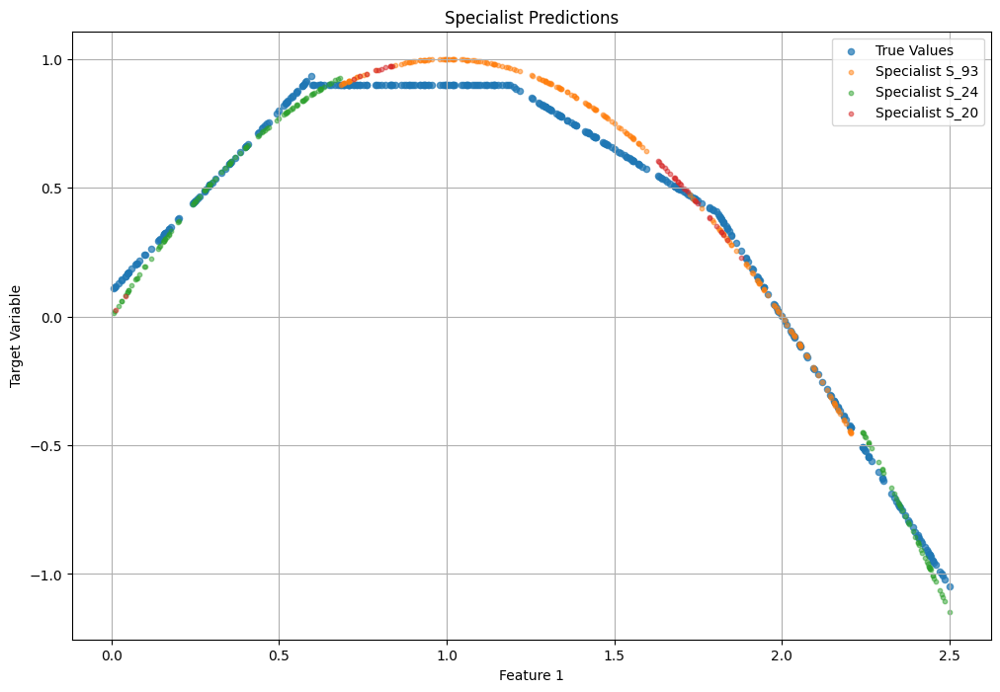

In [90]:
# Simplify with default 10% threshold
simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_5, min_usage=0.05)
simplified_ensemble = MultiTree(simplified_tree)
y_pred = simplified_ensemble.predict(X_train_5)
masks = get_specialist_masks(simplified_ensemble.collection, X_train_5)

# Simplify the specialists 
simplification_threshold = -0.025
elite = spec_pop[np.argmin(spec_pop.fit)]
elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_5, y_train_5, max_iterations=50, verbose=False)
elite_simplified = GP_Tree(elite_simplified)

print(f"Original RMSE: {rmse(y_train_5, ensemble_tree.predict(X_train_5)):.4f}")
print(f"Simplified RMSE: {rmse(y_train_5, y_pred):.4f}")
print(f"Elite RMSE: {rmse(y_train_5, elite.predict(X_train_5)):.4f}")
print(f"Elite Simplified RMSE: {rmse(y_train_5, elite_simplified.predict(X_train_5)):.4f}")

# Replace the elite in the ensemble with the simplified version
for sp_id, mask in masks.items():
    specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_5[mask], y_train_5[mask], max_iterations=50, verbose=False)
    specialist_simplified = GP_Tree(specialist_simplified)
    simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

simplified_ensemble = MultiTree(simplified_ensemble.collection) 

# Evaluate performance
rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_5), y_train_5) / spec_pop.fit[np.argmin(spec_pop.fit)] 
complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
total_improvement = rmse_improvement_ratio * complexity_ratio

print(f"RMSE Improvement Ratio: {rmse_improvement_ratio:.4f}")
print(f"Complexity Ratio: {complexity_ratio:.4f}")
print(f"Total Improvement: {total_improvement:.4f}")

if total_improvement < 4 and rmse_improvement_ratio < 1: 
    # Accept the ensemble 
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_5)
    pred_masks_list = list(masks.values())

else: 
    # The elite wins 
    masks = np.repeat(True, X_train_5.shape[0])
    pred_masks_list = [masks]

composite_distance = compute_composite_mask_distance(mask4_train, pred_masks_list, lambda_penalty=1)
print(f"Composite Distance: {composite_distance:.4f}")

# Scatterplot the predictions
plt.figure(figsize=(12, 8))
plt.scatter(X_train_5[:, 0], y_train_5, alpha=0.7, label='True Values', s=20)

masks = get_specialist_masks(simplified_ensemble.collection, X_train_5)

for sp_id, mask in masks.items():
    plt.scatter(X_train_5[mask][:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_5[mask]), alpha=0.5, label=f'Specialist {sp_id}', s=10)
    # plt.scatter(X_train_5[:,0], simplified_ensemble.SPECIALISTS[sp_id].predict(X_train_5), alpha=0.5, label=f'Specialist {sp_id}')
plt.title('Specialist Predictions')
plt.xlabel('Feature 1')
plt.ylabel('Target Variable')
plt.legend()
plt.grid()
plt.show()

In [ ]:
train_indices, test_indices = train_test_split(x5, y5, p_test=0.2, indices_only=True)
X_train_5 = x5[train_indices]
y_train_5 = y5[train_indices]

mask5_train = []
for item in mask5: 
    mask5_train.append(item[train_indices])

dataset_subsets = []
for mask_chunk in mask5_train:
    dataset_subsets.append(X_train_5[mask_chunk])

params = GPParameters(pop_size=100, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

# -----------------------------------------------------------------------------------------------------------------------------------------------------
data = {
    'ensemble_selected': [],
    'composite_distance': [],
    'n_chunks': [],
    'best_specialists': [],
    'best_possible_combination': [],
    'rmse_improvement_ratio': [],
    'complexity_ratio': [],
    'total_improvement': [],
    'seed': [],
    'rmse': []
}

for seed in tqdm(range(30)): 
    ensemble_selected = False

    # Train the ensemble
    ensemble_tree, population, spec_pop = multi_slim(X_train=X_train_5, y_train=y_train_5, dataset_name='synthetic_1',
                                    gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=1000,
                                    n_iter=10, p_mut=0.7, prob_terminal=0.7, prob_specialist=0.7, max_depth=5, 
                                    depth_condition=6, test_elite=False, timeout=200, verbose=0)   
    
    # Check the best performing individual on each of the dataset subsets
    best_specialists_rmse = [np.inf] * len(dataset_subsets)
    best_specialists = [None] * len(dataset_subsets)
    for i, mask_chunk in enumerate(mask5_train):
        for individual in spec_pop:
            preds = individual.predict(X_train_5[mask_chunk])
            rmse_value = rmse(y_train_5[mask_chunk], preds)
            if rmse_value < best_specialists_rmse[i]:
                best_specialists_rmse[i] = rmse_value
                best_specialists[i] = individual
    preds, y_true = [], []
    for i, mask_chunk in enumerate(mask5_train):
        preds.extend(best_specialists[i].predict(X_train_5[mask_chunk]))
        y_true.extend(y_train_5[mask_chunk])
    preds = np.array(preds)
    y_true = np.array(y_true)
    best_possible_combination = rmse(y_true, preds)
    
    # Simplify with default 10% threshold
    simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train_5, min_usage=0.1)
    simplified_ensemble = MultiTree(simplified_tree)
    y_pred = simplified_ensemble.predict(X_train_5)
    masks = get_specialist_masks(simplified_ensemble.collection, X_train_5)

    # Simplify the specialists 
    simplification_threshold = -0.025
    elite = spec_pop[np.argmin(spec_pop.fit)]
    elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train_5, y_train_5, max_iterations=50, verbose=False)
    elite_simplified = GP_Tree(elite_simplified)

    # Replace the elite in the ensemble with the simplified version
    for sp_id, mask in masks.items():
        specialist_simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train_5[mask], y_train_5[mask], max_iterations=50, verbose=False)
        specialist_simplified = GP_Tree(specialist_simplified)
        simplified_ensemble.SPECIALISTS[sp_id] = specialist_simplified 

    simplified_ensemble = MultiTree(simplified_ensemble.collection) 

    # Evaluate performance
    rmse_improvement_ratio = rmse(simplified_ensemble.predict(X_train_5), y_train_5) / spec_pop.fit[np.argmin(spec_pop.fit)] 
    complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
    total_improvement = rmse_improvement_ratio * complexity_ratio

    if total_improvement < 2 and rmse_improvement_ratio < 1:  # CHANGED FROM 1 to 2.5 because there will always be more complexity in the ensemble since there are 4 pieces
        ensemble_selected = True
        # Accept the ensemble 
        masks = get_specialist_masks(simplified_ensemble.collection, X_train_5)
        pred_masks_list = list(masks.values())

    else: 
        # The elite wins 
        masks = np.repeat(True, X_train_5.shape[0])
        pred_masks_list = [masks]

    composite_distance = compute_composite_mask_distance(mask5_train, pred_masks_list, lambda_penalty=1)

    data['ensemble_selected'].append(ensemble_selected)
    data['n_chunks'].append(len(pred_masks_list))
    data['best_specialists'].append(best_specialists_rmse)
    data['best_possible_combination'].append(best_possible_combination)    
    data['composite_distance'].append(composite_distance)
    data['rmse_improvement_ratio'].append(rmse_improvement_ratio)
    data['complexity_ratio'].append(complexity_ratio)
    data['total_improvement'].append(total_improvement)
    data['seed'].append(seed)
    data['rmse'].append(rmse(simplified_ensemble.predict(X_train_5), y_train_5))

    # Clear the jupyter output
    clear_output(wait=True)
    display(pd.DataFrame(data))

df5 = pd.DataFrame(data)
df5.set_index('seed', inplace=True)

df5.to_csv('multi_slim_experiments/synthetic_5.csv')

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,False,3.70000,1,"[0.04002323935812401, 0.0005944954128441758, 0...",0.029314,1.000000,1.000000,1.000000,0,0.038256
1,False,3.70000,1,"[0.03563838843604192, 0.005171529753471923, 0....",0.027931,1.000000,1.000000,1.000000,1,0.044198
2,True,2.23875,2,"[0.031225009949837332, 0.004008509020051153, 0...",0.029197,0.808786,2.282051,1.845690,2,0.031480
3,False,3.70000,1,"[0.027455073705848484, 0.01951826018388942, 0....",0.029359,0.857816,5.195122,4.456459,3,0.032472
4,True,2.29125,2,"[0.0424322382946097, 7.285714285765186e-06, 0....",0.040032,0.688896,1.679245,1.156825,4,0.045140
5,True,3.70000,1,"[0.023283879041618435, 0.03272683797977111, 0....",0.030004,0.990643,0.929825,0.921124,5,0.037129
6,False,3.70000,1,"[0.03150655731892822, 0.00015081228107724766, ...",0.028552,0.937816,2.419355,2.268911,6,0.036404
7,True,2.23875,2,"[0.039577216697408324, 0.00019562004026596642,...",0.030411,0.889373,1.755556,1.561343,7,0.034429
8,True,2.23875,2,"[0.017432965027059856, 0.0, 0.0254877478098142...",0.024476,0.928183,1.101695,1.022574,8,0.034428
9,False,3.70000,1,"[0.01632878473910717, 0.01364552626135657, 0.0...",0.023992,0.929637,2.244444,2.086519,9,0.035971


100%|██████████| 30/30 [30:19<00:00, 60.64s/it]


#### All datasets at the same time 

In [8]:
def evaluate_ensemble(params, mask, x, y, dataset_name):
    data = {
        'ensemble_selected': [],
        'composite_distance': [],
        'n_chunks': [],
        'best_specialists': [],
        'best_possible_combination': [],
        'rmse_improvement_ratio': [],
        'complexity_ratio': [],
        'total_improvement': [],
        'seed': [],
        'rmse': []
    }

    for seed in tqdm(range(30)):        
        train_indices, _ = train_test_split(x, y, p_test=0.2, indices_only=True, seed=seed)
        X_train = x[train_indices]
        y_train = y[train_indices]
        mask_train = [m[train_indices] for m in mask]
        dataset_subsets = [X_train[m_chunk] for m_chunk in mask_train]

        ensemble_selected = False

        ensemble_tree, population, spec_pop = multi_slim(
            X_train=X_train, y_train=y_train, dataset_name=dataset_name,
            gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=100,
            n_iter=2000, p_mut=0.7, prob_terminal=0.6, prob_specialist=0.6, max_depth=5,              # FROM .7 to .6 prob_terminal and prob_specialist
            depth_condition=6, test_elite=False, timeout=200, verbose=0
        )

        best_specialists_rmse = [np.inf] * len(dataset_subsets)
        best_specialists = [None] * len(dataset_subsets)
        for i, m_chunk in enumerate(mask_train):
            for individual in spec_pop:
                preds = individual.predict(X_train[m_chunk])
                score = rmse(y_train[m_chunk], preds)
                if score < best_specialists_rmse[i]:
                    best_specialists_rmse[i] = score
                    best_specialists[i] = individual

        preds, y_true = [], []
        for i, m_chunk in enumerate(mask_train):
            preds.extend(best_specialists[i].predict(X_train[m_chunk]))
            y_true.extend(y_train[m_chunk])
        preds, y_true = np.array(preds), np.array(y_true)
        best_possible_combination = rmse(y_true, preds)

        simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train, min_usage=0.1)
    
        try: 
            simplified_ensemble = MultiTree(simplified_tree)

        except:
            print("Error in MultiTree creation")
            print(ensemble_tree.collection)
            print(simplified_tree)
            print(simplified_tree.collection)
            
        masks = get_specialist_masks(simplified_ensemble.collection, X_train)

        simplification_threshold = -0.025
        elite = spec_pop[np.argmin(spec_pop.fit)]
        elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train, y_train, max_iterations=50, verbose=False)
        elite_simplified = GP_Tree(elite_simplified)

        for sp_id, m in masks.items():
            simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train[m], y_train[m], max_iterations=50, verbose=False)
            simplified_ensemble.SPECIALISTS[sp_id] = GP_Tree(simplified)

        simplified_ensemble = MultiTree(simplified_ensemble.collection)
        rmse_ratio = rmse(simplified_ensemble.predict(X_train), y_train) / spec_pop.fit[np.argmin(spec_pop.fit)]
        complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
        total_improvement = rmse_ratio * complexity_ratio

        if total_improvement < 5 and rmse_ratio < 0.9:
            ensemble_selected = True
            pred_masks_list = list(masks.values())
        else:
            pred_masks_list = [np.repeat(True, X_train.shape[0])]

        comp_dist = compute_composite_mask_distance(mask_train, pred_masks_list, lambda_penalty=1)
        data['ensemble_selected'].append(ensemble_selected)
        data['n_chunks'].append(len(pred_masks_list))
        data['best_specialists'].append(best_specialists_rmse)
        data['best_possible_combination'].append(best_possible_combination)
        data['composite_distance'].append(comp_dist)
        data['rmse_improvement_ratio'].append(rmse_ratio)
        data['complexity_ratio'].append(complexity_ratio)
        data['total_improvement'].append(total_improvement)
        data['seed'].append(seed)
        data['rmse'].append(rmse(simplified_ensemble.predict(X_train), y_train))

        clear_output(wait=True)
        print(ensemble_tree.collection)
        print(simplified_ensemble.collection)   
        display(pd.DataFrame(data))

    df = pd.DataFrame(data)
    df.set_index('seed', inplace=True)
    return df

# Evaluate the ensemble for each dataset
params = GPParameters(pop_size=200, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

In [9]:
def evaluate_ensemble(params, mask, x, y, dataset_name):
    data = {
        'ensemble_selected': [],
        'composite_distance': [],
        'n_chunks': [],
        'best_specialists': [],
        'best_possible_combination': [],
        'rmse_improvement_ratio': [],
        'complexity_ratio': [],
        'total_improvement': [],
        'seed': [],
        'rmse': []
    }

    for seed in tqdm(range(30)):        
        train_indices, _ = train_test_split(x, y, p_test=0.2, indices_only=True, seed=seed)
        X_train = x[train_indices]
        y_train = y[train_indices]
        mask_train = [m[train_indices] for m in mask]
        dataset_subsets = [X_train[m_chunk] for m_chunk in mask_train]

        ensemble_selected = False

        ensemble_tree, population, spec_pop = multi_slim(
            X_train=X_train, y_train=y_train, dataset_name=dataset_name,
            gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=100,
            n_iter=2000, p_mut=0.7, prob_terminal=0.6, prob_specialist=0.6, max_depth=5,              # FROM .7 to .6 prob_terminal and prob_specialist
            depth_condition=6, test_elite=False, timeout=200, verbose=0
        )

        best_specialists_rmse = [np.inf] * len(dataset_subsets)
        best_specialists = [None] * len(dataset_subsets)
        for i, m_chunk in enumerate(mask_train):
            for individual in spec_pop:
                preds = individual.predict(X_train[m_chunk])
                score = rmse(y_train[m_chunk], preds)
                if score < best_specialists_rmse[i]:
                    best_specialists_rmse[i] = score
                    best_specialists[i] = individual

        preds, y_true = [], []
        for i, m_chunk in enumerate(mask_train):
            preds.extend(best_specialists[i].predict(X_train[m_chunk]))
            y_true.extend(y_train[m_chunk])
        preds, y_true = np.array(preds), np.array(y_true)
        best_possible_combination = rmse(y_true, preds)

        simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train, min_usage=0.1)
    
        try: 
            simplified_ensemble = MultiTree(simplified_tree)

        except:
            print("Error in MultiTree creation")
            print(ensemble_tree.collection)
            print(simplified_tree)
            print(simplified_tree.collection)
            
        masks = get_specialist_masks(simplified_ensemble.collection, X_train)

        simplification_threshold = -0.025
        elite = spec_pop[np.argmin(spec_pop.fit)]
        elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train, y_train, max_iterations=50, verbose=False)
        elite_simplified = GP_Tree(elite_simplified)

        for sp_id, m in masks.items():
            simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train[m], y_train[m], max_iterations=50, verbose=False)
            simplified_ensemble.SPECIALISTS[sp_id] = GP_Tree(simplified)

        simplified_ensemble = MultiTree(simplified_ensemble.collection)
        rmse_ratio = rmse(simplified_ensemble.predict(X_train), y_train) / spec_pop.fit[np.argmin(spec_pop.fit)]
        complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
        total_improvement = rmse_ratio * complexity_ratio

        if total_improvement < 5 and rmse_ratio < 0.9:
            ensemble_selected = True
            pred_masks_list = list(masks.values())
        else:
            pred_masks_list = [np.repeat(True, X_train.shape[0])]

        comp_dist = compute_composite_mask_distance(mask_train, pred_masks_list, lambda_penalty=1)
        data['ensemble_selected'].append(ensemble_selected)
        data['n_chunks'].append(len(pred_masks_list))
        data['best_specialists'].append(best_specialists_rmse)
        data['best_possible_combination'].append(best_possible_combination)
        data['composite_distance'].append(comp_dist)
        data['rmse_improvement_ratio'].append(rmse_ratio)
        data['complexity_ratio'].append(complexity_ratio)
        data['total_improvement'].append(total_improvement)
        data['seed'].append(seed)
        data['rmse'].append(rmse(simplified_ensemble.predict(X_train), y_train))

        clear_output(wait=True)
        print(ensemble_tree.collection)
        print(simplified_ensemble.collection)   
        display(pd.DataFrame(data))

    df = pd.DataFrame(data)
    df.set_index('seed', inplace=True)
    return df

# Evaluate the ensemble for each dataset
params = GPParameters(pop_size=200, n_iter=1000, max_depth=8, init_depth=3,  
                        selector='dalex', p_xo=0.6, down_sampling=0.5)

df1 = evaluate_ensemble(params, mask1, x1, y1, 'synthetic_1')
df1.to_csv('multi_slim_experiments/synthetic_1_a.csv')

df2 = evaluate_ensemble(params, mask2, x2, y2, 'synthetic_2')
df2.to_csv('multi_slim_experiments/synthetic_2_a.csv')

df3 = evaluate_ensemble(params, mask3, x3, y3, 'synthetic_3')
df3.to_csv('multi_slim_experiments/synthetic_3_a.csv')

df4 = evaluate_ensemble(params, mask4, x4, y4, 'synthetic_4')
df4.to_csv('multi_slim_experiments/synthetic_4_a.csv')

df5 = evaluate_ensemble(params, mask5, x5, y5, 'synthetic_5')
df5.to_csv('multi_slim_experiments/synthetic_5_a.csv')

df6 = evaluate_ensemble(params, mask6, x6, y6, 'synthetic_6')
df6.to_csv('multi_slim_experiments/synthetic_6_a.csv')

df7 = evaluate_ensemble(params, mask7, x7, y7, 'synthetic_7')
df7.to_csv('multi_slim_experiments/synthetic_7_a.csv')

df8 = evaluate_ensemble(params, mask8, x8, y8, 'synthetic_8')
df8.to_csv('multi_slim_experiments/synthetic_8_a.csv')

df9 = evaluate_ensemble(params, mask9, x9, y9, 'synthetic_9')
df9.to_csv('multi_slim_experiments/synthetic_9_a.csv')

df10 = evaluate_ensemble(params, mask10, x10, y10, 'synthetic_10')
df10.to_csv('multi_slim_experiments/synthetic_10_a.csv')

(<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EC35010>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EB8DDD0>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EB9F090>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EC44810>, 'S_193', 'S_46'), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213F284850>, 'S_2', 'S_187')), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213F230AD0>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213F27AC90>, 'S_62', 'S_192'), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EB8F310>, 'S_54', 'S_97'))), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condit

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,True,1.092500,4,"[8.644343139629526e-16, 0.021593641913015733, ...",0.046755,0.537733,3.526316,1.896217,0,0.924160
1,True,3.147500,6,"[0.07259434971215445, 0.010574720748445723, 0....",0.045168,0.483161,4.323077,2.088740,1,0.890905
2,True,3.186667,6,"[8.000000000178234e-06, 0.27488294893427456, 0...",0.117447,0.435989,3.898551,1.699724,2,0.787491
3,False,2.480000,1,"[0.0048928697570527965, 0.015128839697800196, ...",0.034824,0.901563,3.666667,3.305731,3,1.536643
4,True,2.180000,5,"[0.23746793047155174, 0.46228777836376395, 0.0...",0.240624,0.706287,5.905660,4.171091,4,1.151510
5,True,2.188333,5,"[0.03394470019487862, 0.318409035008723, 0.001...",0.137304,0.729952,4.428571,3.232645,5,1.226911
6,False,2.487500,1,"[4.186000000001463e-05, 0.16372306653815152, 0...",0.072306,0.997513,4.853659,4.841589,6,1.684024
7,True,2.141667,5,"[0.00034787686363097213, 0.0004017653510063511...",0.508928,0.803359,4.877551,3.918427,7,1.388008
8,True,2.160000,5,"[0.29884006409703034, 1.305174677186544e-05, 0...",0.175631,0.452484,6.702128,3.032608,8,0.748037
9,True,1.130000,4,"[0.022347621965141066, 0.10437683102262783, 0....",0.153015,0.740737,2.696203,1.997176,9,1.191399


100%|██████████| 30/30 [41:57<00:00, 83.92s/it]

In [10]:
def evaluate_ensemble(params, mask, x, y, dataset_name):
    data = {
        'ensemble_selected': [],
        'composite_distance': [],
        'n_chunks': [],
        'best_specialists': [],
        'best_possible_combination': [],
        'rmse_improvement_ratio': [],
        'complexity_ratio': [],
        'total_improvement': [],
        'seed': [],
        'rmse': []
    }

    for seed in tqdm(range(30)):        
        train_indices, _ = train_test_split(x, y, p_test=0.2, indices_only=True, seed=seed)
        X_train = x[train_indices]
        y_train = y[train_indices]
        mask_train = [m[train_indices] for m in mask]
        dataset_subsets = [X_train[m_chunk] for m_chunk in mask_train]

        ensemble_selected = False

        ensemble_tree, population, spec_pop = multi_slim(
            X_train=X_train, y_train=y_train, dataset_name=dataset_name,
            gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=200,
            n_iter=2000, p_mut=0.7, prob_terminal=0.6, prob_specialist=0.6, max_depth=5,              # FROM .7 to .6 prob_terminal and prob_specialist
            depth_condition=6, test_elite=False, timeout=200, verbose=0
        )

        best_specialists_rmse = [np.inf] * len(dataset_subsets)
        best_specialists = [None] * len(dataset_subsets)
        for i, m_chunk in enumerate(mask_train):
            for individual in spec_pop:
                preds = individual.predict(X_train[m_chunk])
                score = rmse(y_train[m_chunk], preds)
                if score < best_specialists_rmse[i]:
                    best_specialists_rmse[i] = score
                    best_specialists[i] = individual

        preds, y_true = [], []
        for i, m_chunk in enumerate(mask_train):
            preds.extend(best_specialists[i].predict(X_train[m_chunk]))
            y_true.extend(y_train[m_chunk])
        preds, y_true = np.array(preds), np.array(y_true)
        best_possible_combination = rmse(y_true, preds)

        simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train, min_usage=0.1)
    
        try: 
            simplified_ensemble = MultiTree(simplified_tree)

        except:
            print("Error in MultiTree creation")
            print(ensemble_tree.collection)
            print(simplified_tree)
            print(simplified_tree.collection)
            
        masks = get_specialist_masks(simplified_ensemble.collection, X_train)

        simplification_threshold = -0.025
        elite = spec_pop[np.argmin(spec_pop.fit)]
        elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train, y_train, max_iterations=50, verbose=False)
        elite_simplified = GP_Tree(elite_simplified)

        for sp_id, m in masks.items():
            simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train[m], y_train[m], max_iterations=50, verbose=False)
            simplified_ensemble.SPECIALISTS[sp_id] = GP_Tree(simplified)

        simplified_ensemble = MultiTree(simplified_ensemble.collection)
        rmse_ratio = rmse(simplified_ensemble.predict(X_train), y_train) / spec_pop.fit[np.argmin(spec_pop.fit)]
        complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
        total_improvement = rmse_ratio * complexity_ratio

        if total_improvement < 5 and rmse_ratio < 0.8:
            ensemble_selected = True
            pred_masks_list = list(masks.values())
        else:
            pred_masks_list = [np.repeat(True, X_train.shape[0])]

        comp_dist = compute_composite_mask_distance(mask_train, pred_masks_list, lambda_penalty=1)
        data['ensemble_selected'].append(ensemble_selected)
        data['n_chunks'].append(len(pred_masks_list))
        data['best_specialists'].append(best_specialists_rmse)
        data['best_possible_combination'].append(best_possible_combination)
        data['composite_distance'].append(comp_dist)
        data['rmse_improvement_ratio'].append(rmse_ratio)
        data['complexity_ratio'].append(complexity_ratio)
        data['total_improvement'].append(total_improvement)
        data['seed'].append(seed)
        data['rmse'].append(rmse(simplified_ensemble.predict(X_train), y_train))

        clear_output(wait=True)
        print(ensemble_tree.collection)
        print(simplified_ensemble.collection)   
        display(pd.DataFrame(data))

    df = pd.DataFrame(data)
    df.set_index('seed', inplace=True)
    return df

# Evaluate the ensemble for each dataset
params = GPParameters(pop_size=200, n_iter=1000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.8, down_sampling=1)


df1 = evaluate_ensemble(params, mask1, x1, y1, 'synthetic_1')
df1.to_csv('multi_slim_experiments/synthetic_1_b.csv')

df2 = evaluate_ensemble(params, mask2, x2, y2, 'synthetic_2')
df2.to_csv('multi_slim_experiments/synthetic_2_b.csv')

df3 = evaluate_ensemble(params, mask3, x3, y3, 'synthetic_3')
df3.to_csv('multi_slim_experiments/synthetic_3_b.csv')

df4 = evaluate_ensemble(params, mask4, x4, y4, 'synthetic_4')
df4.to_csv('multi_slim_experiments/synthetic_4_b.csv')

df5 = evaluate_ensemble(params, mask5, x5, y5, 'synthetic_5')
df5.to_csv('multi_slim_experiments/synthetic_5_b.csv')

df6 = evaluate_ensemble(params, mask6, x6, y6, 'synthetic_6')
df6.to_csv('multi_slim_experiments/synthetic_6_b.csv')

df7 = evaluate_ensemble(params, mask7, x7, y7, 'synthetic_7')
df7.to_csv('multi_slim_experiments/synthetic_7_b.csv')

df8 = evaluate_ensemble(params, mask8, x8, y8, 'synthetic_8')
df8.to_csv('multi_slim_experiments/synthetic_8_b.csv')

df9 = evaluate_ensemble(params, mask9, x9, y9, 'synthetic_9')
df9.to_csv('multi_slim_experiments/synthetic_9_b.csv')

df10 = evaluate_ensemble(params, mask10, x10, y10, 'synthetic_10')
df10.to_csv('multi_slim_experiments/synthetic_10_b.csv')

(<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213F27CA50>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EBE0E10>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213F2216D0>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EC67B50>, 'S_75', 'S_1'), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EDA1690>, 'S_179', 'S_38')), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EDA2650>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EDA9C10>, 'S_38', 'S_1'), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213EDA9E90>, 'S_156', 'S_132'))), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.conditi

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,False,2.480000,1,"[0.5651951606826694, 0.0007172015359760663, 0....",0.305829,0.811212,4.358491,3.535659,0,1.345708
1,True,2.117500,5,"[0.16905382037405414, 0.19397363624170302, 0.0...",0.124220,0.328433,2.955056,0.970539,1,0.611703
2,True,1.126667,4,"[0.0031308186667331987, 0.1246614642517944, 0....",0.072294,0.289134,2.851852,0.824567,2,0.541757
3,True,1.106667,4,"[0.0787754081090546, 0.07423173867050124, 0.00...",0.053370,0.750162,3.509091,2.632387,3,1.286348
4,True,0.085000,3,"[0.858404234194298, 0.2197672339266208, 0.1081...",0.486001,0.524614,1.960000,1.028243,4,0.885214
5,True,3.157500,6,"[0.803521433893654, 0.19148215017640466, 0.003...",0.449452,0.294489,4.626667,1.362504,5,0.500183
6,True,1.114167,4,"[0.15138760113471408, 0.11785367067327465, 0.0...",0.097122,0.311506,2.714286,0.845516,6,0.532223
7,True,1.125000,4,"[0.15670182545209194, 0.2423151768135856, 0.10...",0.155481,0.469703,3.467532,1.628712,7,0.829623
8,False,2.475000,1,"[0.06435481667279791, 0.5328508071854171, 0.00...",0.228832,1.293329,1.658228,2.144635,8,2.135542
9,True,1.132500,4,"[0.3046724380434204, 0.44722273907307925, 0.09...",0.263807,0.512092,3.800000,1.945950,9,0.864924


100%|██████████| 30/30 [47:58<00:00, 95.96s/it]

In [11]:
def evaluate_ensemble(params, mask, x, y, dataset_name):
    data = {
        'ensemble_selected': [],
        'composite_distance': [],
        'n_chunks': [],
        'best_specialists': [],
        'best_possible_combination': [],
        'rmse_improvement_ratio': [],
        'complexity_ratio': [],
        'total_improvement': [],
        'seed': [],
        'rmse': []
    }

    for seed in tqdm(range(30)):        
        train_indices, _ = train_test_split(x, y, p_test=0.2, indices_only=True, seed=seed)
        X_train = x[train_indices]
        y_train = y[train_indices]
        mask_train = [m[train_indices] for m in mask]
        dataset_subsets = [X_train[m_chunk] for m_chunk in mask_train]

        ensemble_selected = False

        ensemble_tree, population, spec_pop = multi_slim(
            X_train=X_train, y_train=y_train, dataset_name=dataset_name,
            gp_version='gp', params_gp=params, full_return=True, seed=seed, pop_size=200,
            n_iter=2500, p_mut=0.7, prob_terminal=0.6, prob_specialist=0.6, max_depth=5,              # FROM .7 to .6 prob_terminal and prob_specialist
            depth_condition=6, test_elite=False, timeout=200, verbose=0
        )

        best_specialists_rmse = [np.inf] * len(dataset_subsets)
        best_specialists = [None] * len(dataset_subsets)
        for i, m_chunk in enumerate(mask_train):
            for individual in spec_pop:
                preds = individual.predict(X_train[m_chunk])
                score = rmse(y_train[m_chunk], preds)
                if score < best_specialists_rmse[i]:
                    best_specialists_rmse[i] = score
                    best_specialists[i] = individual

        preds, y_true = [], []
        for i, m_chunk in enumerate(mask_train):
            preds.extend(best_specialists[i].predict(X_train[m_chunk]))
            y_true.extend(y_train[m_chunk])
        preds, y_true = np.array(preds), np.array(y_true)
        best_possible_combination = rmse(y_true, preds)

        simplified_tree = simplify_ensemble(ensemble_tree.collection, X_train, min_usage=0.1)
    
        try: 
            simplified_ensemble = MultiTree(simplified_tree)

        except:
            print("Error in MultiTree creation")
            print(ensemble_tree.collection)
            print(simplified_tree)
            print(simplified_tree.collection)
            
        masks = get_specialist_masks(simplified_ensemble.collection, X_train)

        simplification_threshold = -0.025
        elite = spec_pop[np.argmin(spec_pop.fit)]
        elite_simplified, _ = recursive_simplification(elite, simplification_threshold, X_train, y_train, max_iterations=50, verbose=False)
        elite_simplified = GP_Tree(elite_simplified)

        for sp_id, m in masks.items():
            simplified, _ = recursive_simplification(simplified_ensemble.SPECIALISTS[sp_id], simplification_threshold, X_train[m], y_train[m], max_iterations=50, verbose=False)
            simplified_ensemble.SPECIALISTS[sp_id] = GP_Tree(simplified)

        simplified_ensemble = MultiTree(simplified_ensemble.collection)
        rmse_ratio = rmse(simplified_ensemble.predict(X_train), y_train) / spec_pop.fit[np.argmin(spec_pop.fit)]
        complexity_ratio = simplified_ensemble.total_nodes / spec_pop[np.argmin(spec_pop.fit)].nodes_count
        total_improvement = rmse_ratio * complexity_ratio

        if total_improvement < 5 and rmse_ratio < 0.8:
            ensemble_selected = True
            pred_masks_list = list(masks.values())
        else:
            pred_masks_list = [np.repeat(True, X_train.shape[0])]

        comp_dist = compute_composite_mask_distance(mask_train, pred_masks_list, lambda_penalty=1)
        data['ensemble_selected'].append(ensemble_selected)
        data['n_chunks'].append(len(pred_masks_list))
        data['best_specialists'].append(best_specialists_rmse)
        data['best_possible_combination'].append(best_possible_combination)
        data['composite_distance'].append(comp_dist)
        data['rmse_improvement_ratio'].append(rmse_ratio)
        data['complexity_ratio'].append(complexity_ratio)
        data['total_improvement'].append(total_improvement)
        data['seed'].append(seed)
        data['rmse'].append(rmse(simplified_ensemble.predict(X_train), y_train))

        clear_output(wait=True)
        print(ensemble_tree.collection)
        print(simplified_ensemble.collection)   
        display(pd.DataFrame(data))

    df = pd.DataFrame(data)
    df.set_index('seed', inplace=True)
    return df

# Evaluate the ensemble for each dataset
params = GPParameters(pop_size=500, n_iter=2000, max_depth=8, init_depth=3,
                        selector='dalex', p_xo=0.8, down_sampling=1)


df1 = evaluate_ensemble(params, mask1, x1, y1, 'synthetic_1')
df1.to_csv('multi_slim_experiments/synthetic_1_c.csv')

df2 = evaluate_ensemble(params, mask2, x2, y2, 'synthetic_2')
df2.to_csv('multi_slim_experiments/synthetic_2_c.csv')

df3 = evaluate_ensemble(params, mask3, x3, y3, 'synthetic_3')
df3.to_csv('multi_slim_experiments/synthetic_3_c.csv')

df4 = evaluate_ensemble(params, mask4, x4, y4, 'synthetic_4')
df4.to_csv('multi_slim_experiments/synthetic_4_c.csv')

df5 = evaluate_ensemble(params, mask5, x5, y5, 'synthetic_5')
df5.to_csv('multi_slim_experiments/synthetic_5_c.csv')

df6 = evaluate_ensemble(params, mask6, x6, y6, 'synthetic_6')
df6.to_csv('multi_slim_experiments/synthetic_6_c.csv')

df7 = evaluate_ensemble(params, mask7, x7, y7, 'synthetic_7')
df7.to_csv('multi_slim_experiments/synthetic_7_c.csv')

df8 = evaluate_ensemble(params, mask8, x8, y8, 'synthetic_8')
df8.to_csv('multi_slim_experiments/synthetic_8_c.csv')

df9 = evaluate_ensemble(params, mask9, x9, y9, 'synthetic_9')
df9.to_csv('multi_slim_experiments/synthetic_9_c.csv')

df10 = evaluate_ensemble(params, mask10, x10, y10, 'synthetic_10')
df10.to_csv('multi_slim_experiments/synthetic_10_c.csv')

(<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213C819E50>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213C7D64D0>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213F216F50>, 'S_104', (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213ED44610>, 'S_119', 'S_330')), 'S_139'), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213C812910>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213C83B590>, (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213C838D10>, 'S_295', 'S_414'), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.condition.Condition object at 0x000002213ED4FB90>, 'S_18', 'S_275')), (<slim_gsgp_lib_np.algorithms.MULTI_SLIM.representations.co

,ensemble_selected,composite_distance,n_chunks,best_specialists,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,seed,rmse
0,True,1.32125,3,"[0.0, 0.17137493050316221]",0.169653,0.431636,3.000000,1.294908,0,0.073228
1,False,1.02000,1,"[0.0, 0.33500722153649365]",0.331640,1.110767,1.474227,1.637522,1,0.368419
2,False,1.02000,1,"[0.0, 0.31511739210746326]",0.311950,0.890368,5.266667,4.689273,2,0.278726
3,False,1.01500,1,"[1.9609578658717233e-08, 0.4429131233540969]",0.439579,1.271043,1.266667,1.609988,3,0.558939
4,True,4.48000,6,"[0.0, 0.45162443421988707]",0.447085,0.603746,2.686747,1.622113,4,0.270978
5,False,1.01750,1,"[1.5692638441631012e-05, 0.4754394677516552]",0.471261,0.794679,9.758621,7.754970,5,0.375664
6,False,1.01500,1,"[0.0, 0.4477566410956637]",0.444386,1.256642,1.463768,1.839433,6,0.562280
7,False,1.02250,1,"[4.827435474430407e-07, 0.4480964283406258]",0.443027,1.109117,1.307692,1.450384,7,0.493809
8,False,1.02000,1,"[4.3677875175184205e-09, 0.40550577176988806]",0.401430,0.864406,3.000000,2.593218,8,0.364364
9,True,1.35500,3,"[0.0, 0.02563153968851874]",0.025471,0.343493,3.063492,1.052289,9,0.008749


 33%|███▎      | 10/30 [1:07:03<2:14:07, 402.38s/it]


KeyboardInterrupt: 

In [4]:
df1_1000 = pd.read_csv('multi_slim_experiments/synthetic_1.csv')
df2_1000 = pd.read_csv('multi_slim_experiments/synthetic_2.csv')
df3_1000 = pd.read_csv('multi_slim_experiments/synthetic_3.csv')
df4_1000 = pd.read_csv('multi_slim_experiments/synthetic_4.csv')
df5_1000 = pd.read_csv('multi_slim_experiments/synthetic_5.csv')

df1_100 = pd.read_csv('multi_slim_experiments/synthetic_1_100.csv')
df2_100 = pd.read_csv('multi_slim_experiments/synthetic_2_100.csv')
df3_100 = pd.read_csv('multi_slim_experiments/synthetic_3_100.csv')
df4_100 = pd.read_csv('multi_slim_experiments/synthetic_4_100.csv')
df5_100 = pd.read_csv('multi_slim_experiments/synthetic_5_100.csv')

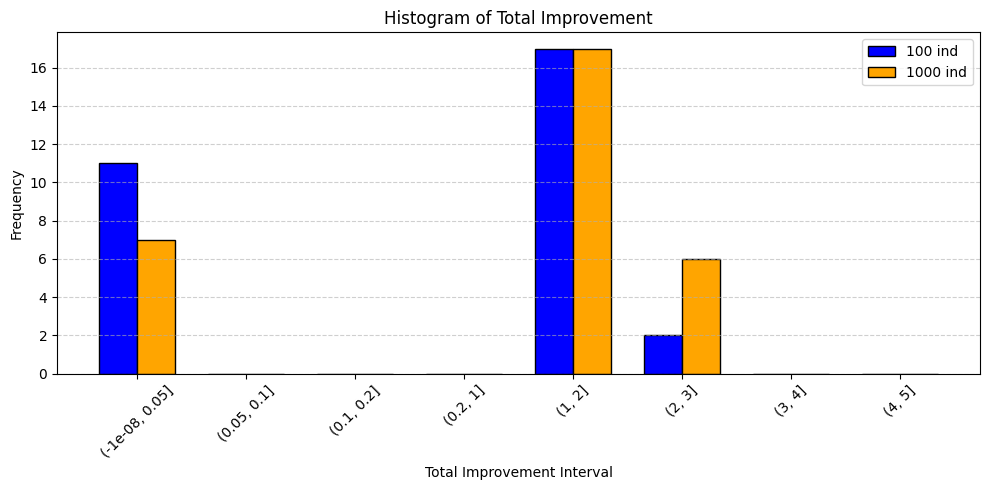

In [37]:
def compare_dist(df1, df2): 
    # Define your bins
    bins = [-0.00000001, 0.05, 0.1, 0.2, 1, 2, 3, 4, 5]
    labels = [f"({bins[i]}, {bins[i+1]}]" for i in range(len(bins)-1)]

    # Get the values from both datasets
    vals_100 = df1['composite_distance'].values
    vals_1000 = df2['composite_distance'].values

    # Manually count the number of values in each bin
    counts_100 = []
    counts_1000 = []

    for i in range(len(bins)-1):
        lower = bins[i]
        upper = bins[i+1]
        count_100 = np.sum((vals_100 > lower) & (vals_100 <= upper))
        count_1000 = np.sum((vals_1000 > lower) & (vals_1000 <= upper))
        counts_100.append(count_100)
        counts_1000.append(count_1000)

    # Plot side-by-side bars
    x = np.arange(len(labels))
    width = 0.35

    plt.figure(figsize=(10, 5))
    plt.bar(x - width/2, counts_100, width, label='100 ind', color='blue', edgecolor='black')
    plt.bar(x + width/2, counts_1000, width, label='1000 ind', color='orange', edgecolor='black')

    # Formatting
    plt.xlabel('Total Improvement Interval')
    plt.ylabel('Frequency')
    plt.title('Histogram of Total Improvement')
    plt.xticks(x, labels, rotation=45)
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

compare_dist(df1_1000, df1_100)

df1 to df3 have been extracted with pop size of multi slim of 1000 ! 

In [119]:
# Change composite distance to float 
df2['composite_distance'] = df2['composite_distance'].astype(float)
df2.drop(columns=['best_specialists']).corr()

,ensemble_selected,composite_distance,n_chunks,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,rmse
ensemble_selected,1.000000,-0.950777,0.945871,-0.248474,-0.597724,-0.550462,-0.760651,-0.315412
composite_distance,-0.950777,1.000000,-0.800687,0.174825,0.536476,0.541545,0.715716,0.272819
n_chunks,0.945871,-0.800687,1.000000,-0.296460,-0.598782,-0.503669,-0.726303,-0.328762
best_possible_combination,-0.248474,0.174825,-0.296460,1.000000,0.710441,-0.112592,0.298890,0.671916
rmse_improvement_ratio,-0.597724,0.536476,-0.598782,0.710441,1.000000,-0.112903,0.330114,0.857770
complexity_ratio,-0.550462,0.541545,-0.503669,-0.112592,-0.112903,1.000000,0.790483,-0.206134
total_improvement,-0.760651,0.715716,-0.726303,0.298890,0.330114,0.790483,1.000000,0.073097
rmse,-0.315412,0.272819,-0.328762,0.671916,0.857770,-0.206134,0.073097,1.000000


In [122]:
# Change composite distance to float 
df3['composite_distance'] = df3['composite_distance'].astype(float)
df3.drop(columns=['best_specialists']).corr()

,ensemble_selected,composite_distance,n_chunks,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,rmse
ensemble_selected,1.000000,-0.994047,1.000000,-0.239465,-0.508010,-0.532330,-0.546169,-0.429902
composite_distance,-0.994047,1.000000,-0.994047,0.273716,0.458197,0.537027,0.544644,0.391759
n_chunks,1.000000,-0.994047,1.000000,-0.239465,-0.508010,-0.532330,-0.546169,-0.429902
best_possible_combination,-0.239465,0.273716,-0.239465,1.000000,0.329484,0.432914,0.460832,0.662135
rmse_improvement_ratio,-0.508010,0.458197,-0.508010,0.329484,1.000000,0.369221,0.481867,0.849328
complexity_ratio,-0.532330,0.537027,-0.532330,0.432914,0.369221,1.000000,0.990441,0.464251
total_improvement,-0.546169,0.544644,-0.546169,0.460832,0.481867,0.990441,1.000000,0.549767
rmse,-0.429902,0.391759,-0.429902,0.662135,0.849328,0.464251,0.549767,1.000000


In [ ]:
# Change composite distance to float 
df4['composite_distance'] = df4['composite_distance'].astype(float)
df4.drop(columns=['best_specialists']).corr()

,ensemble_selected,composite_distance,n_chunks,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,rmse
ensemble_selected,1.000000,-0.999550,1.000000,-0.186188,-0.070992,-0.117619,-0.166121,-0.062084
composite_distance,-0.999550,1.000000,-0.999550,0.187696,0.071600,0.123140,0.171731,0.062975
n_chunks,1.000000,-0.999550,1.000000,-0.186188,-0.070992,-0.117619,-0.166121,-0.062084
best_possible_combination,-0.186188,0.187696,-0.186188,1.000000,-0.215542,-0.219342,-0.305679,-0.192970
rmse_improvement_ratio,-0.070992,0.071600,-0.070992,-0.215542,1.000000,-0.162714,0.478343,0.999132
complexity_ratio,-0.117619,0.123140,-0.117619,-0.219342,-0.162714,1.000000,0.784728,-0.163244
total_improvement,-0.166121,0.171731,-0.166121,-0.305679,0.478343,0.784728,1.000000,0.476967
rmse,-0.062084,0.062975,-0.062084,-0.192970,0.999132,-0.163244,0.476967,1.000000


In [121]:
# Change composite distance to float 
df5['composite_distance'] = df5['composite_distance'].astype(float)
df5.drop(columns=['best_specialists']).corr()

,ensemble_selected,composite_distance,n_chunks,best_possible_combination,rmse_improvement_ratio,complexity_ratio,total_improvement,rmse
ensemble_selected,1.000000,-0.999322,1.000000,0.498073,-0.476545,-0.131624,-0.206425,0.348866
composite_distance,-0.999322,1.000000,-0.999322,-0.492440,0.474298,0.135144,0.210087,-0.349001
n_chunks,1.000000,-0.999322,1.000000,0.498073,-0.476545,-0.131624,-0.206425,0.348866
best_possible_combination,0.498073,-0.492440,0.498073,1.000000,-0.234788,-0.093871,-0.208703,0.956065
rmse_improvement_ratio,-0.476545,0.474298,-0.476545,-0.234788,1.000000,-0.388390,-0.228874,-0.022975
complexity_ratio,-0.131624,0.135144,-0.131624,-0.093871,-0.388390,1.000000,0.977450,-0.150576
total_improvement,-0.206425,0.210087,-0.206425,-0.208703,-0.228874,0.977450,1.000000,-0.244299
rmse,0.348866,-0.349001,0.348866,0.956065,-0.022975,-0.150576,-0.244299,1.000000


### Other synthetic datasets exploration 

In [ ]:
# X, y = datasets[1]()
# X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2)
# X_train = MinMaxScaler().fit_transform(X_train)
# X_test = MinMaxScaler().fit_transform(X_test)
# y_train = MinMaxScaler().fit_transform(y_train.reshape(-1, 1)).ravel()
# y_test = MinMaxScaler().fit_transform(y_test.reshape(-1, 1)).ravel()

# seed = 2

# slim_params = SlimParameters(pop_size=100, n_iter=500, max_depth=14, init_depth=6, p_inflate=0.3, p_struct=0.2, eps_fraction=1e-6, 
#                              prob_const=0.2, n_elites=1, selector='lexicase', decay_rate=0.2, p_xo=0, p_struct_xo=0, 
#                              prob_terminal=0.7, mode='exp')

# ensemble_tree, population = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
#                                 slim_parameters=slim_params, slim_version='SLIM*ABS',
#                                 full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=500, p_mut=0.8, test_elite=True, timeout=200,
# )

TRAIN: 200 50
TEST: 113 27


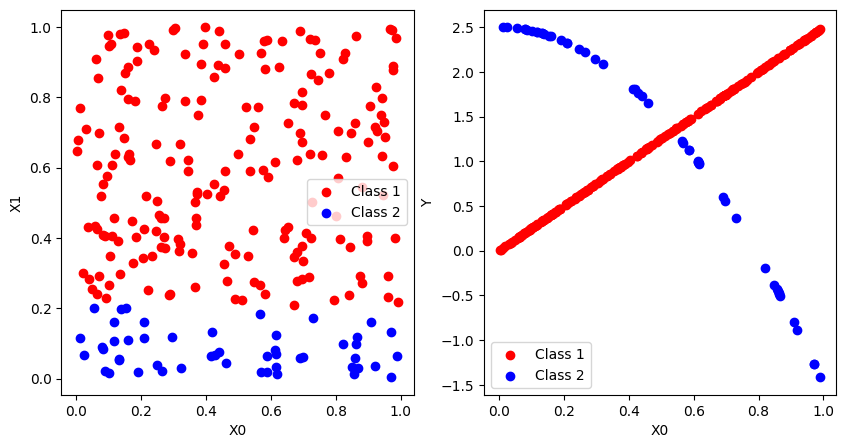

In [31]:
# Create a modal dataset
np.random.seed(0)
X_train = np.random.rand(250, 3)
X_test = np.random.rand(140, 3)
count1, count2 = 0, 0

threshold = 0.2

def f(x):
    global count1, count2
    if x[1] > threshold:
        count1 += 1
        value = 2.5 * x
        return value[0]
    else:
        count2 += 1
        value = -4 * (x ** 2) + 2.5
        # value = -2.5 * x
        return value[0]
    
y_train = np.array([f(x) for x in X_train])
print('TRAIN:', count1, count2)
count1, count2 = 0, 0

y_test = np.array([f(x) for x in X_test])
print('TEST:', count1, count2)

X_train_1 = np.where(X_train[:, 1] > threshold)[0]  
X_train_2 = np.where(X_train[:, 1] <= threshold)[0]
y_train_1 = y_train[X_train_1]
y_train_2 = y_train[X_train_2]
X_train_1 = X_train[X_train_1]
X_train_2 = X_train[X_train_2]

# Scatterplot 
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].scatter(X_train_1[:, 0], X_train_1[:, 1], c='r', label='Class 1')
axs[0].scatter(X_train_2[:, 0], X_train_2[:, 1], c='b', label='Class 2')
axs[0].set_xlabel('X0')
axs[0].set_ylabel('X1')
axs[0].legend()

axs[1].scatter(X_train_1[:, 0], y_train_1, c='r', label='Class 1')
axs[1].scatter(X_train_2[:, 0], y_train_2, c='b', label='Class 2')
axs[1].set_xlabel('X0')
axs[1].set_ylabel('Y')
axs[1].legend()
plt.show()

TRAIN: 240 10
TEST: 137 3


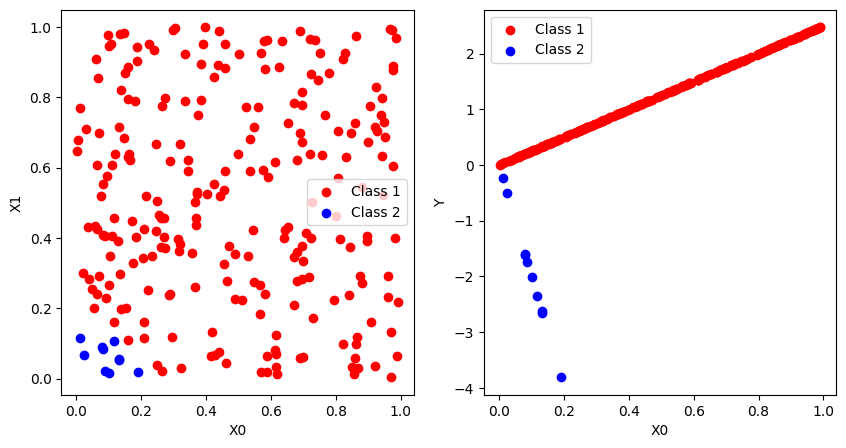

In [104]:
# Create a modal dataset
np.random.seed(0)
X_train = np.random.rand(250, 3)
X_test = np.random.rand(140, 3)
count1, count2 = 0, 0

threshold = 0.25

def f(x):
    global count1, count2
    if x[0] + x[1] > threshold:
        count1 += 1
        value = 2.5 * x
        return value[0]
    else:
        count2 += 1
        # value = -4 * (x ** 2) + 2.5
        value = -20 * x
        return value[0]
    
y_train = np.array([f(x) for x in X_train])
print('TRAIN:', count1, count2)
count1, count2 = 0, 0

y_test = np.array([f(x) for x in X_test])
print('TEST:', count1, count2)

X_train_1 = np.where(X_train[:, 0] + X_train[:, 1] > threshold)[0]
X_train_2 = np.where(X_train[:, 0] + X_train[:, 1] <= threshold)[0]
y_train_1 = y_train[X_train_1]
y_train_2 = y_train[X_train_2]
X_train_1 = X_train[X_train_1]
X_train_2 = X_train[X_train_2]

# Scatterplot 
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].scatter(X_train_1[:, 0], X_train_1[:, 1], c='r', label='Class 1')
axs[0].scatter(X_train_2[:, 0], X_train_2[:, 1], c='b', label='Class 2')
axs[0].set_xlabel('X0')
axs[0].set_ylabel('X1')
axs[0].legend()

axs[1].scatter(X_train_1[:, 0], y_train_1, c='r', label='Class 1')
axs[1].scatter(X_train_2[:, 0], y_train_2, c='b', label='Class 2')
axs[1].set_xlabel('X0')
axs[1].set_ylabel('Y')
axs[1].legend()
plt.show()

In [ ]:
class LogSpecialist(SLIM_GSGP_Callback):
    def __init__(self):
        self.log = []
        self.count_specialists = []

    def on_generation_start(self, optimizer, generation):            
        min_1, min_2 = 1e10, 1e10
        best_1, best_2 = None, None
        count_1, count_2 = 0, 0
        for ind in optimizer.population:
            if hasattr(optimizer, 'slim_version'): 
                ind.version = optimizer.slim_version
            preds_1 = ind.predict(X_train_1)
            preds_2 = ind.predict(X_train_2)
            error_1 = rmse(preds_1, y_train_1)
            error_2 = rmse(preds_2, y_train_2)
            if error_1 < error_2: 
                count_1 += 1
            else:
                count_2 += 1

            if error_1 < min_1:
                min_1 = error_1
                best_1 = ind
            if error_2 < min_2:
                min_2 = error_2
                best_2 = ind
            
        y_1 = best_1.predict(X_train_1)
        y_2 = best_2.predict(X_train_2)

        self.count_specialists.append([count_1, count_2])
        self.log.append([rmse(y_1, y_train_1), rmse(y_2, y_train_2)])

    # def on_train_end(self, slim_gsgp):
    #     self.plot_specialist_fitnesses()

    def plot_specialist_fitnesses(self):
        fig, ax = plt.subplots()
        ax.plot(self.log)
        ax.set_xlabel('Generation')
        ax.set_ylabel('RMSE')
        ax.legend(['Specialist 1', 'Specialist 2'])
        plt.show()

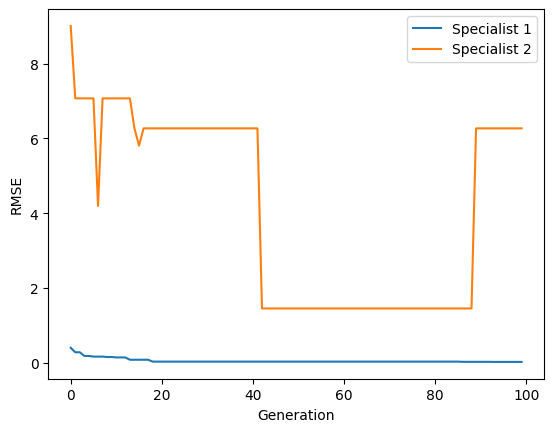

,g1,g2,min_g1,min_g2,min_g1_point,min_g2_point,mean_count_1
0,1.104658e-16,1.846037e+00,1.104658e-16,1.846037e+00,43,95,92.15
1,1.104658e-16,8.560233e+00,1.104658e-16,5.340468e+00,16,14,96.90
2,3.777586e-03,8.308591e+00,3.777586e-03,2.385845e+00,98,29,91.46
3,8.957614e-03,1.169296e+00,8.957614e-03,1.113175e+00,30,98,94.65
4,3.466996e-02,2.971751e-01,3.466996e-02,2.502267e-02,62,90,94.44
5,1.636799e-02,4.971066e+00,1.636799e-02,2.215075e+00,94,84,87.71
6,2.355139e-17,8.574341e+00,2.355139e-17,3.692967e+00,36,25,94.11
7,9.003124e-03,8.475017e+00,9.003124e-03,6.444522e+00,69,19,93.19
8,3.228027e-03,2.417190e-15,3.228027e-03,2.417190e-15,39,98,85.26
9,4.159926e-03,2.193224e+00,4.159926e-03,5.554792e-01,93,26,89.39


100%|██████████| 20/20 [06:17<00:00, 18.87s/it]


In [106]:
data = None

for seed in tqdm(range(20)):
    temp_data = {}
    log_specialist = LogSpecialist()    
    
    params = GPParameters(pop_size=100, n_iter=100, max_depth=6, init_depth=3, selector='e_lexicase', p_xo=0.8, n_cases=10, 
                        callbacks=[log_specialist], particularity_pressure=20)

    ensemble_tree, population = gp(X_train=X_train, y_train=y_train, dataset_name='test', verbose=0,
                                test_elite=False, full_return=True, seed=seed, **params.__dict__)

    g1, g2 = log_specialist.log[-1]
    log = np.array(log_specialist.log)
    min_g1 = np.min(log[:, 0])
    min_g2 = np.min(log[:, 1])
    min_g1_point = np.where(log[:, 0] == min_g1)[0][0]
    min_g2_point = np.where(log[:, 1] == min_g2)[0][0]
    mean_count_1 = np.mean([i[0] for i in log_specialist.count_specialists])

    temp_data[seed] = [g1, g2, min_g1, min_g2, min_g1_point, min_g2_point, mean_count_1]
    temp_data = pd.DataFrame.from_dict(temp_data, orient='index', columns=['g1', 'g2', 'min_g1', 'min_g2', 'min_g1_point', 'min_g2_point', 'mean_count_1'])
    data = pd.concat([data, temp_data]) if data is not None else temp_data

    # Clear jupyter output
    clear_output()
    log_specialist.plot_specialist_fitnesses() 
    display(data)

In [17]:
seed = 0
log_specialist = LogSpecialist()    

params = GPParameters(pop_size=100, n_iter=200, max_depth=6, init_depth=3, selector='e_lexicase', p_xo=0, n_cases=250, 
                    callbacks=[log_specialist], particularity_pressure=20)

ensemble_tree, population = gp(X_train=X_train, y_train=y_train, dataset_name='test', verbose=1,
                            test_elite=False, full_return=True, seed=seed, **params.__dict__)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |      lex_r      |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      1.015      |       None      |      0.012      |        3        |      4.200      |        5        |     N/A (0)     |     N/A (0)     |      0.000      |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|


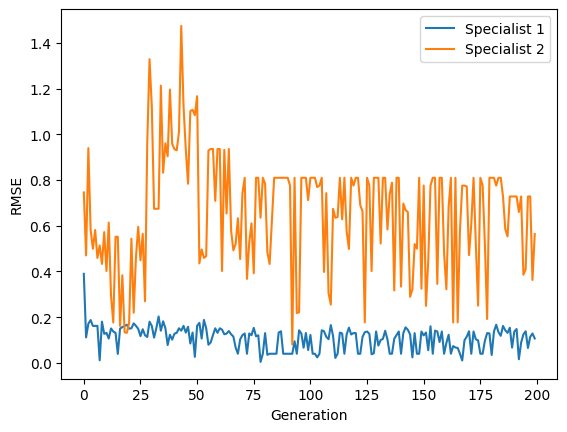

In [18]:
log_specialist.plot_specialist_fitnesses()

In [63]:
seed = 10

log_specialist = LogSpecialist()    

# params = SlimParameters(pop_size=100, n_iter=100, max_depth=10, init_depth=4, p_inflate=0.3, p_struct=0.3, n_cases=5,
#                              prob_const=0.2, n_elites=1, selector='dalex', decay_rate=0.2, p_xo=0, p_struct_xo=0, 
#                              prob_terminal=0.7, mode='exp', elitism=True, callbacks=[log_specialist])

# params = GPParameters(pop_size=100, n_iter=200, max_depth=6, init_depth=3, selector='manual_e_lexicase', p_xo=0.8, n_cases=20, 
#                       callbacks=[log_specialist], epsilon=1e-3)

params = GPParameters(pop_size=100, n_iter=200, max_depth=5, init_depth=3, selector='dalex', p_xo=0.6, n_cases=10, 
                      callbacks=[log_specialist])
                      

ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                params_gp=params, gp_version='gp', # population=slim_pop,
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=500, p_mut=0.8, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=2, depth_condition=5, 
                                test_elite=True, timeout=200, n_elites=1)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.853      |      0.852      |      0.011      |        3        |      4.320      |        2        |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |      0.806      |      0.829      |      0.024      

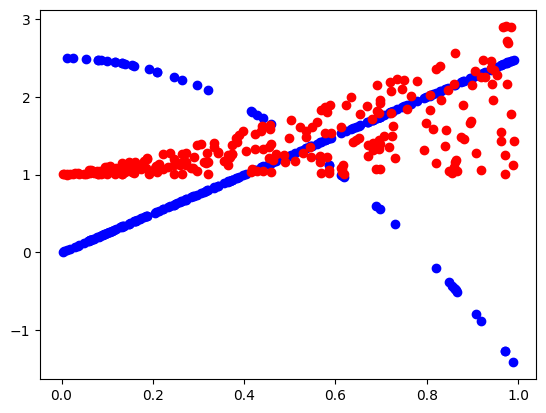

In [68]:
preds_1 = slim_pop[0].predict(X_train)
plt.scatter(X_train[:, 0], y_train, c='b')
plt.scatter(X_train[:, 0], preds_1, c='r')
plt.show()

RMSE Specialist 1: 0.005565117897071625
RMSE Specialist 2: 1.3097966586336212


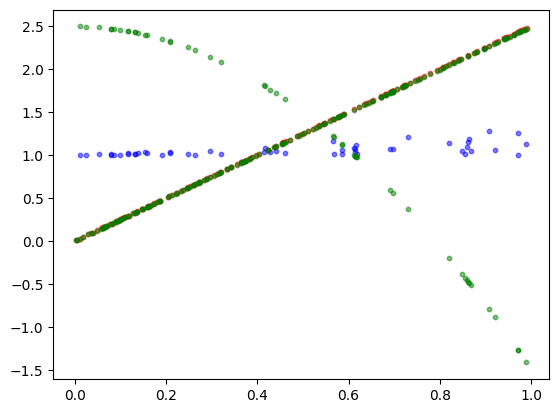

In [110]:
filter_true = np.where(ensemble_tree.collection[0].predict(X_train) > 0)[0]
filter_false = np.where(ensemble_tree.collection[0].predict(X_train) <= 0)[0]

# Use the filter for the scatterplot
specialists = ensemble_tree.SPECIALISTS 
sp1 = specialists[ensemble_tree.collection[1]]
sp2 = specialists[ensemble_tree.collection[2]]

X_train_true = X_train[filter_true]
X_train_false = X_train[filter_false]

y_train_true = sp1.predict(X_train_true)
y_train_false = sp2.predict(X_train_false)

# Print the RMSE of the specialists
print('RMSE Specialist 1:', rmse(y_train_true, y_train[filter_true]))
print('RMSE Specialist 2:', rmse(y_train_false, y_train[filter_false]))

plt.scatter(X_train_true[:, 0], y_train_true, c='r', s=10, alpha=0.5)
plt.scatter(X_train_false[:, 0], y_train_false, c='b', s=10, alpha=0.5)
plt.scatter(X_train[:, 0], y_train, c='g', s=10, alpha=0.5)
plt.show()

In [ ]:
y_train_false = y_train[filter_false]

# rerun GP 
params = GPParameters(pop_size=100, n_iter=1000, max_depth=6, init_depth=3, selector='tournament', p_xo=0.8)

sp2_new, population = gp(X_train=X_train_false, y_train=y_train_false, dataset_name='test', verbose=1,
                                test_elite=False, full_return=True, seed=seed, **params.__dict__)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |    avg_nodes    |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      1.111      |       None      |      0.008      |        7        |      4.320      |        3        |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
|       test      |        1        |      1.111      |       None      |      0.009      

RMSE Specialist 1: 0.005565117897071625
RMSE Specialist 2 new: 0.07489431589379918


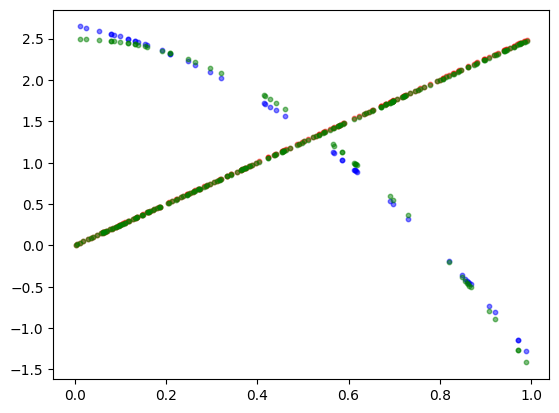

In [118]:
y_train_true = sp1.predict(X_train_true)
y_train_false = sp2_new.predict(X_train_false)

# Print the RMSE of the specialists
print('RMSE Specialist 1:', rmse(y_train_true, y_train[filter_true]))
print('RMSE Specialist 2 new:', rmse(y_train_false, y_train[filter_false]))

plt.scatter(X_train_true[:, 0], y_train_true, c='r', s=10, alpha=0.5)
plt.scatter(X_train_false[:, 0], y_train_false, c='b', s=10, alpha=0.5)
plt.scatter(X_train[:, 0], y_train, c='g', s=10, alpha=0.5)
plt.show()

In [662]:
seed = 10

log_specialist = LogSpecialist()    

# params = SlimParameters(pop_size=100, n_iter=1000, max_depth=10, init_depth=4, p_inflate=0.2, p_struct=0.4, n_cases=10,
#                              prob_const=0.2, n_elites=1, selector='e_lexicase', decay_rate=0.2, p_xo=0, p_struct_xo=0, 
#                              prob_terminal=0.7, mode='exp', elitism=True, callbacks=[log_specialist])

params = GPParameters(pop_size=100, n_iter=500, max_depth=9, init_depth=3, selector='e_lexicase', p_xo=0.8, n_cases=5, callbacks=[log_specialist])
                      

ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                params_gp=params, gp_version='gp',
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=250, p_mut=0.7, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=2, depth_condition=7, 
                                test_elite=True, timeout=200, n_elites=1)

log_specialist.plot_specialist_fitnesses()  

NameError: name 'LogSpecialist' is not defined

In [36]:
min_1, min_2 = 1e10, 1e10
best_1, best_2 = None, None
best_ind_1, best_ind_2 = None, None

for i, ind in enumerate(slim_pop):
    preds_1 = ind.predict(X_train_1)
    preds_2 = ind.predict(X_train_2)
    error_1 = rmse(preds_1, y_train_1)
    error_2 = rmse(preds_2, y_train_2)
    if error_1 < min_1:
        min_1 = error_1
        best_1 = ind 
        best_ind_1 = i
    if error_2 < min_2:
        min_2 = error_2
        best_2 = ind
        best_ind_2 = i

y_1 = best_1.predict(X_train_1)
y_2 = best_2.predict(X_train_2)

print(f'TRAIN 1 {best_ind_1}:', rmse(y_1, y_train_1))
print(f'TRAIN 2: {best_ind_2}', rmse(y_2, y_train_2))

TRAIN 1 23: 0.23912573931729764
TRAIN 2: 14 0.6251042181821997


In [21]:
params = GPParameters(pop_size=100, n_iter=500, max_depth=8, init_depth=4, eps_fraction=1e-6,
                      selector='lexicase', p_xo=0)

rmses = []

for seed in range(50):
    ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, dataset_name='test',
                                gp_version='gp', params_gp=params, population=gp_population,
                                full_return=True, seed=seed, verbose=0, pop_size=100, n_iter=1000, p_mut=0.6, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=3, depth_condition=3, 
                                test_elite=False, timeout=200)
    
    preds = ensemble_tree.predict(X_test)
    error = rmse(preds, y_test)
    rmses.append(error)

In [ ]:
seed = 10

params = GPParameters(pop_size=100, n_iter=500, max_depth=8, init_depth=4, eps_fraction=1e-6,
                      selector='lexicase', p_xo=0)

ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, dataset_name='test',
                                gp_version='gp', params_gp=params, population=gp_population,
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.6, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=3, depth_condition=3, 
                                test_elite=False, timeout=200)

In [11]:
ensemble_tree.print_tree_representation()

if (
  add(
    add(
      x1
      constant__0.21
    )
    add(
      x0
      constant__0.78
    )
  )
) > 0 then
  S_60
else
  S_94
endif



In [ ]:
seed = 10

ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                slim_version='SLIM*ABS', population=gp_population,
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=2000, p_mut=0.6, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=2, depth_condition=3, 
                                test_elite=True, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |   total_nodes   |  average_depth  |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.630      |      0.691      |      0.001      |        1        |        43       |      1.310      |        1        |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|


In [8]:
ensemble_tree.print_tree_representation()

if (
  subtract(
    divide(
      x0
      x0
    )
    add(
      x1
      x0
    )
  )
) > 0 then
  S_67
else
  S_65
endif



### In-depth look into lexicase selection splitting

TRAIN: 81 69
TEST: 7 3


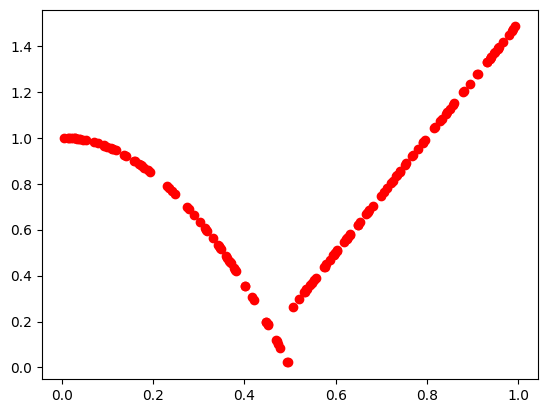

In [147]:
# Create a modal dataset
# Set random seed
np.random.seed(11)

X_train = np.random.rand(150, 3)

# Order X_train by the first column 
X_train = X_train[np.argsort(X_train[:, 0])]

X_test = np.random.rand(10, 3)
count1, count2 = 0, 0

def f(x):
    global count1, count2
    if x[0] > 0.5: 
        count1 += 1
        value = 2.5 * x - 1
        return value[0]
    else:
        count2 += 1
        value = -4 * (x ** 2) + 1
        # value = -4 * x + 2
        return value[0]
    
y_train = np.array([f(x) for x in X_train])
print('TRAIN:', count1, count2)
count1, count2 = 0, 0

y_test = np.array([f(x) for x in X_test])
print('TEST:', count1, count2)

X_train_1 = np.where(X_train[:, 0] > 0.5 )[0]
X_train_2 = np.where(X_train[:, 0] <= 0.5)[0]
y_train_1 = y_train[X_train_1]
y_train_2 = y_train[X_train_2]
X_train_1 = X_train[X_train_1]
X_train_2 = X_train[X_train_2]

# Plot the scatter plot
plt.scatter(X_train[:, 0], y_train, c='r')
plt.show()

In [148]:
class LogSpecialist(SLIM_GSGP_Callback):
    def __init__(self):
        self.log = []
        self.positions = []
        self.population_log = []
        self.best_log = []

    def on_generation_start(self, optimizer, generation): 
        self.population_log.append(optimizer.population)      
        # Get the order of the population fitness 
        fitness_positions = np.argsort(optimizer.population.fit)
        min_1, min_2 = 1e10, 1e10
        best_1, best_2 = None, None
        fit_pos_1, fit_pos_2 = None, None
        for i, ind in enumerate(optimizer.population.population):
            if hasattr(optimizer, 'slim_version'): 
                ind.version = optimizer.slim_version
            preds_1 = ind.predict(X_train_1)
            preds_2 = ind.predict(X_train_2)
            error_1 = rmse(preds_1, y_train_1)
            error_2 = rmse(preds_2, y_train_2)
            if error_1 < min_1:
                min_1 = error_1
                best_1 = ind
                fit_pos_1 = fitness_positions[i]
            if error_2 < min_2:
                min_2 = error_2
                best_2 = ind
                fit_pos_2 = fitness_positions[i]
            
        y_1 = best_1.predict(X_train_1)
        y_2 = best_2.predict(X_train_2)

        self.log.append([rmse(y_1, y_train_1), rmse(y_2, y_train_2)])
        self.positions.append([fit_pos_1, fit_pos_2])
        self.best_log.append([best_1, best_2])

    def on_train_end(self, slim_gsgp):
        self.plot_specialist_fitnesses()

    def plot_specialist_fitnesses(self):
        fig, ax = plt.subplots()
        ax.plot(self.log)
        ax.set_xlabel('Generation')
        ax.set_ylabel('RMSE')
        ax.legend(['Specialist 1', 'Specialist 2'])
        plt.show()

In [155]:
seed = 0
n_cases = 5
pop_size = 400

log_specialist = LogSpecialist()    

# params = SlimParameters(pop_size=100, n_iter=100, max_depth=10, init_depth=4, p_inflate=0.3, p_struct=0.3, n_cases=5,
#                              prob_const=0.2, n_elites=1, selector='dalex', decay_rate=0.2, p_xo=0, p_struct_xo=0, 
#                              prob_terminal=0.7, mode='exp', elitism=True, callbacks=[log_specialist])

params = GPParameters(pop_size=pop_size, n_iter=50, max_depth=8, init_depth=3, selector='dalex', 
                      p_xo=0.8, n_cases=n_cases, callbacks=[log_specialist])
                      

ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                params_gp=params, gp_version='gp', population=slim_pop,
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=1000, p_mut=0.6, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=2, depth_condition=7, 
                                test_elite=True, timeout=200, n_elites=1)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |   total_nodes   |  average_depth  |       div       |       mut       |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.226      |      0.132      |      0.010      |        1        |        85       |      1.330      |       187       |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|


In [158]:
ensemble_tree.print_tree_representation()

if (
  add(
    add(
      constant__0.03
      constant__0.33
    )
    add(
      subtract(
        add(
          x2
          constant__0.17
        )
        x2
      )
      x0
    )
  )
) > 0 then
  S_143
else
  S_334
endif



IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

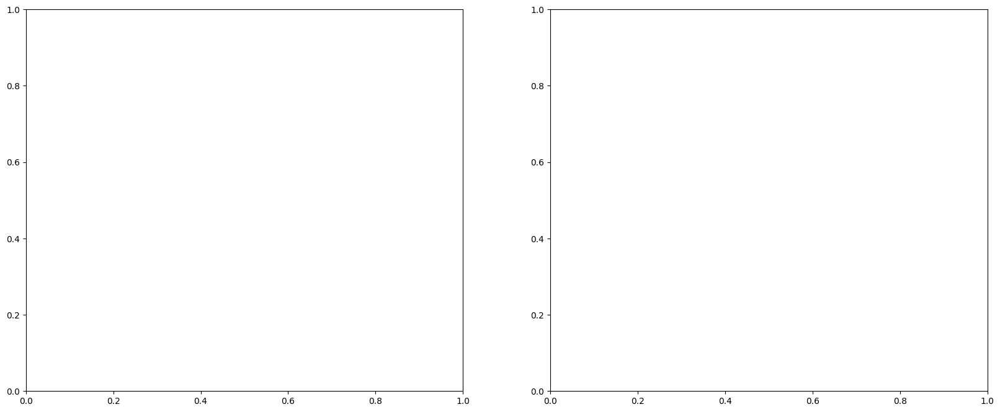

In [159]:
# Plot the population log in two separate plots
fig, ax = plt.subplots(1, 2, figsize=(20, 8))
ax[0].plot(np.array(log_specialist.log)[:,0])
ax[0].set_xlabel('Generation')
ax[0].set_ylabel('RMSE')
ax[0].legend(['Specialist 1'])
# Also plot the position on a twin axis
ax2 = ax[0].twinx()
ax2.plot(np.array(log_specialist.positions)[:,0], 'r')
ax2.set_ylabel('Position in population', color='r')

ax[1].plot(np.array(log_specialist.log)[:,1])
ax[1].set_xlabel('Generation')
ax[1].set_ylabel('RMSE')
ax[1].legend(['Specialist 2'])
# Also plot the position on a twin axis
ax2 = ax[1].twinx()
ax2.plot(np.array(log_specialist.positions)[:,1], 'r')
ax2.set_ylabel('Position in population', color='r')
plt.show()

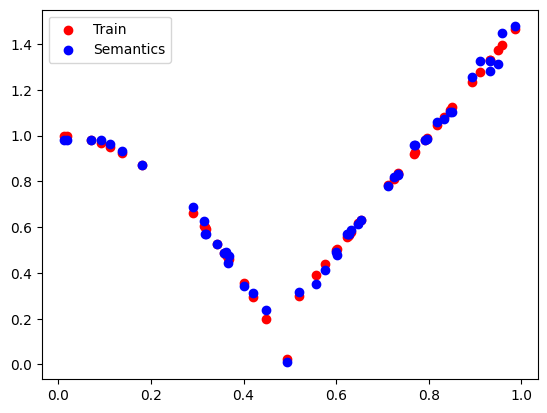

In [140]:
i = 5
pop = log_specialist.population_log[i]
errors = np.abs(pop.errors_case)
selected_best = np.argmin(errors, axis=0)
semantics = pop.train_semantics

sem_agg = []
for i, ind in enumerate(selected_best): 
    sem_agg.append(semantics[ind][i])

# Plot the semantics 
plt.scatter(X_train[:, 0], y_train, c='r', label='Train')
plt.scatter(X_train[:, 0], sem_agg, c='b', label='Semantics')
plt.legend()
plt.show()

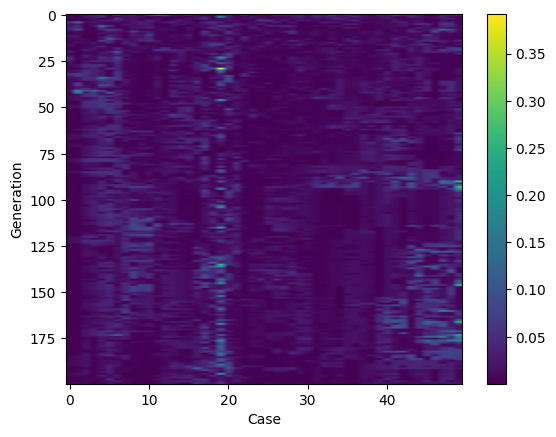

In [141]:
min_errors_track = []

for i in range(200):
    pop = log_specialist.population_log[i]
    errors = np.abs(pop.errors_case)
    min_errors = np.min(errors, axis=0)
    min_errors_track.append(min_errors)

# Plot with imshow  
fig, ax = plt.subplots()
ax.imshow(min_errors_track, aspect='auto')
ax.set_xlabel('Case')
ax.set_ylabel('Generation')
cbar = plt.colorbar(ax.imshow(min_errors_track, aspect='auto'))
plt.show()

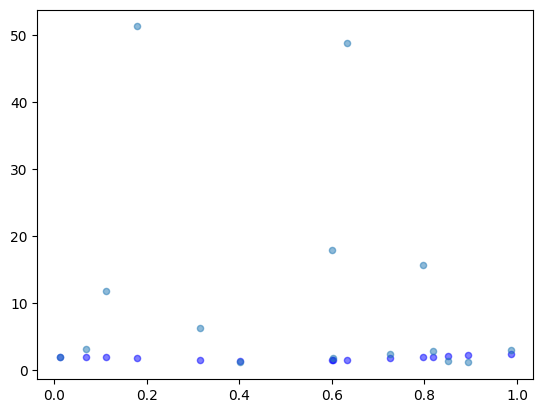

In [191]:
pop = log_specialist.population_log[0]
errors = pop.errors_case
num_cases = errors[0].shape[0]

medians = np.median(errors, axis=0)
epsilon = np.median(np.abs(errors - medians), axis=0)

err = np.abs(errors)
best_errors = np.min(err, axis=0) + epsilon

best_bool = err <= best_errors   
best_inds = np.sum(best_bool, axis=1)

# Get the 5 best individuals
best_inds = np.argsort(best_inds)[::-1][:5]

preds_collection = []

plt.scatter(X_train[:, 0], y_train, c='b', alpha=0.5, s=20)
for ind in best_inds:
    ind = pop[ind]
    # Plot the scatter plot
    preds = ind.predict(X_train)
    preds_collection.append(preds)
    # REmove outliers
    # if np.max(preds) > 50:
    #     # Find the outlier with a mask and then use the mask to plot 
    #     mask = preds < 50
    #     plt.scatter(X_train[mask, 0], preds[mask], alpha=0.5, s=20)
    # 
    # else:
    plt.scatter(X_train[:, 0], preds,  alpha=0.5, s=20)

    break

plt.show()

In [ ]:
for i in range(50):
    print(i)
    pop = log_specialist.population_log[i]

    errors = pop.errors_case
    num_cases = errors[0].shape[0]
    medians = np.median(errors, axis=0)
    epsilon = np.median(np.abs(errors - medians), axis=0)
    err = np.abs(errors)
    best_errors = np.min(err, axis=0) + epsilon
    best_bool = err <= best_errors   
    
    # Sort by the number of best cases
    best_inds = np.sum(best_bool, axis=1)
    best_inds = np.argsort(best_inds)[::-1]
    best_bool = best_bool[best_inds]

    # Plot the best bool with imshow
    plt.imshow(best_bool, aspect='auto')
    plt.colorbar()
    plt.xlabel('Case')
    plt.ylabel('Individual')
    plt.show()

    # time.sleep(3)

### Continuation 

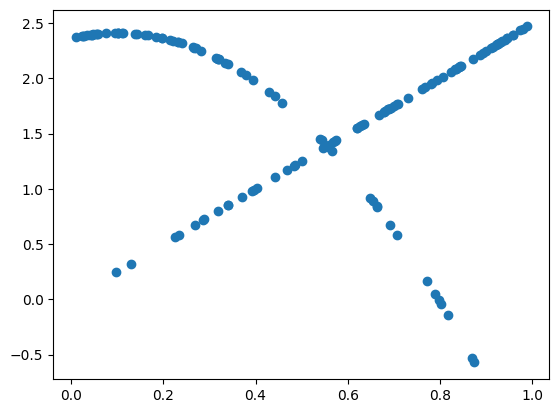

In [14]:
preds = ensemble_tree.predict(X_test)

# Plot the predictions against X_test
plt.scatter(X_test[:,0], preds)
plt.show()

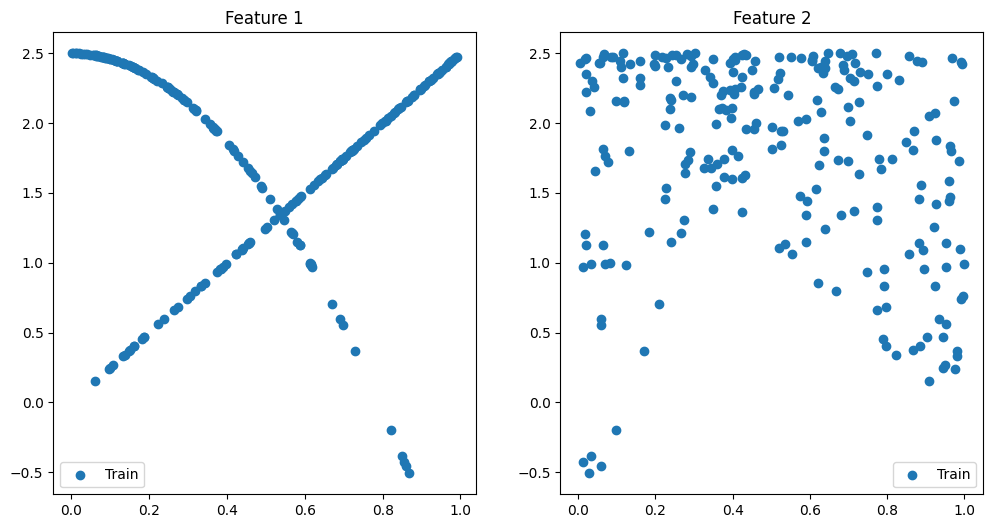

In [108]:
# Plot the scatterplots of the dataset
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].scatter(X_train[:, 0], y_train, label='Train')
ax[0].set_title('Feature 1')
ax[0].legend()

ax[1].scatter(X_train[:, 1], y_train, label='Train')
ax[1].set_title('Feature 2')
ax[1].legend()
plt.show()

In [ ]:
tree_1 = Tree(structure=('divide', 'x0', 'constant_0.39'), 
        train_semantics=None, 
        test_semantics=None,
        reconstruct=True)

tree_2 = Tree(structure=('add', 
                         ('divide', 'constant_1.0', 'constant_0.39'),   # 2.56 
                         ('multiply', 
                          ('multiply', 'x0', 'x0'), 
                          ('divide', 'constant_1.0', 'constant__0.25')  # 4 
                          )), 
        train_semantics=None,
        test_semantics=None,
        reconstruct=True)

perfect_1 = Individual([tree_1], None, None, True)
perfect_2 = Individual([tree_2], None, None, True)

perfect_1.calculate_semantics(X_train)
perfect_2.calculate_semantics(X_train)

perfect_1.evaluate(rmse, y_train, operator='mul')
perfect_2.evaluate(rmse, y_train, operator='mul')

perfect_1.version = 'SLIM*ABS'
perfect_2.version = 'SLIM*ABS'

print(perfect_1.fitness, perfect_2.fitness)

In [ ]:
# Plot the predictions of perfect_1 vs dataset and perfect_2 vs dataset
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].scatter(X_train[:, 0], y_train, label='Train')
ax[0].scatter(X_train[:, 0], perfect_1.train_semantics, label='Perfect 1')
ax[0].set_title('Feature 1')
ax[0].legend()

ax[1].scatter(X_train[:, 0], y_train, label='Train')
ax[1].scatter(X_train[:, 0], perfect_2.train_semantics, label='Perfect 2')
ax[1].set_title('Feature 2')
ax[1].legend()
plt.show()

In [9]:
seed = 10

slim_params = SlimParameters(pop_size=100, n_iter=1000, max_depth=10, init_depth=4, p_inflate=0.3, p_struct=0.3, n_cases=50,
                             prob_const=0.2, n_elites=0, selector='e_lexicase', decay_rate=0.2, p_xo=0, p_struct_xo=0, 
                             prob_terminal=0.7, mode='exp', elitism=False)

ensemble_tree, population, slim_pop = multi_slim(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, dataset_name='test',
                                params_gp=slim_params, gp_version='SLIM*ABS',
                                full_return=True, seed=seed, verbose=1, pop_size=100, n_iter=2000, p_mut=0.6, 
                                prob_terminal=0.7, prob_specialist=0.7, max_depth=2, depth_condition=3, 
                                test_elite=True, timeout=200)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |       div       |     avgStru     |      avgDep     |      struct     |     inflate     |     deflate     |        xo       |      lex_r      |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.890      |      0.954      |      0.009      |        5        |        3        |      2.750      |      2.750      |     N/A (0)     |     N/A (0)     |     N/A (0)     |     N/A (0)     |   

In [8]:
ensemble_tree.print_tree_representation()

if (
  subtract(
    divide(
      x0
      x0
    )
    add(
      x1
      x0
    )
  )
) > 0 then
  S_51
else
  S_91
endif



In [29]:
slim_pop[24].structure

[(np.str_('add'),
  (np.str_('add'),
   'constant_0.9',
   ('divide', 'constant__0.56', 'constant__0.96')),
  ('add', ('add', 'constant__0.94', 'x0'), ('multiply', 'x0', 'x0'))),
 [<function slim_gsgp_lib_np.algorithms.SLIM_GSGP.operators.mutators.two_trees_delta.<locals>.tt_delta(tr1, tr2, ms, testing)>,
  0.10480821841301868]]

In [67]:
# Calculate the correlations between the semantics of slim_pop
for _ in range(200):
    semantics = np.array([ind.train_semantics for ind in slim_pop])
    correlation = np.corrcoef(semantics)
# plt.imshow(correlation, cmap='viridis')
# plt.colorbar()
# plt.show()

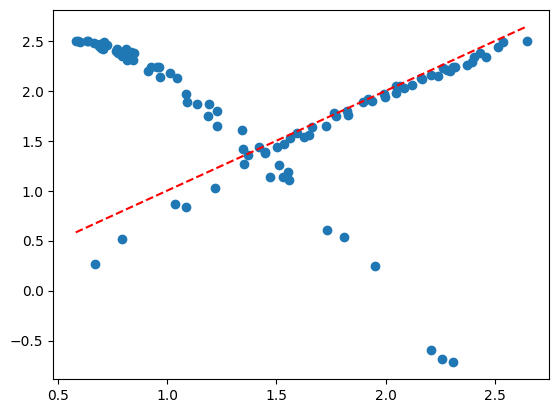

In [51]:
i = 50
plt.scatter(slim_pop[i].predict(X_train), y_train)
range_ = np.linspace(min(slim_pop[i].predict(X_train)), max(slim_pop[i].predict(X_train)), 100)
plt.plot(range_, range_, 'r--')
plt.show()

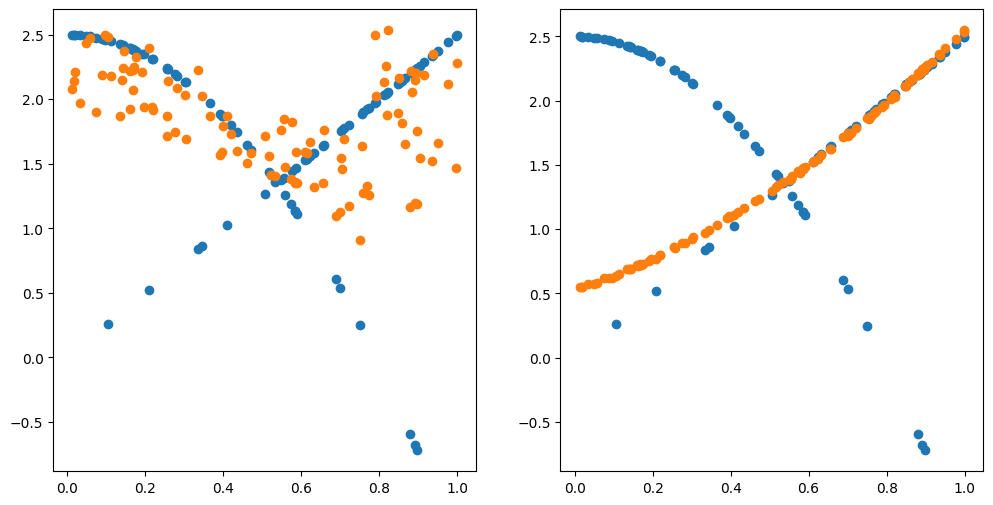

In [54]:
preds_1, preds_2 = slim_pop[0].predict(X_train), slim_pop[24].predict(X_train)

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].scatter(X_train[:, 0], y_train, label='Train')
axs[0].scatter(X_train[:, 0], preds_1, label='SLIM 1')

axs[1].scatter(X_train[:, 0], y_train, label='Train')
axs[1].scatter(X_train[:, 0], preds_2, label='SLIM 2')
plt.show()

In [71]:
ensemble_tree.print_tree_representation()

if (
  subtract(
    multiply(
      x0
      x2
    )
    multiply(
      x2
      constant_0.45
    )
  )
) > 0 then
  S_243
else
  S_231
endif



In [11]:
slim_pop[0].structure

[(np.str_('add'),
  ('add',
   ('divide',
    ('multiply', 'constant__0.56', ('multiply', 'x0', 'constant_0.29')),
    ('divide', 'x1', 'x0')),
   ('subtract', ('divide', 'x1', 'x1'), 'constant__0.52')),
  ('subtract', ('divide', 'x0', 'x0'), 'x1'))]

Removed 6 Pareto-dominated individuals
Removed 3 individuals due to similarity


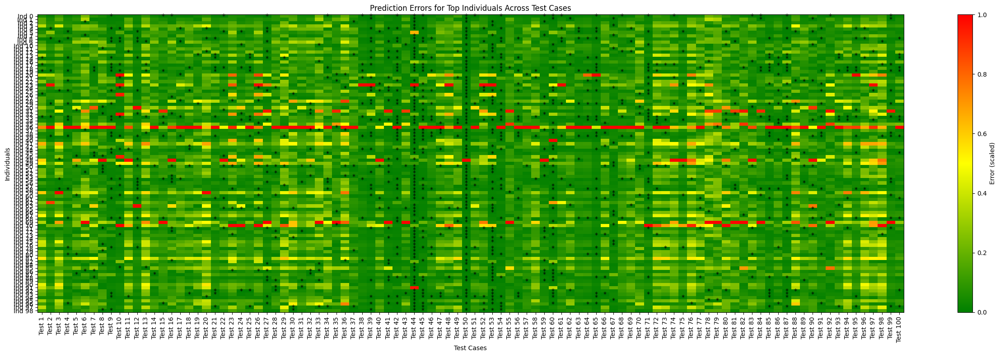

Maximum number of True values: 69 of 100
Best combinations of rows (indices in `errors`): [(6, 50), (19, 50), (33, 50), (50, 99)]
Total error of the ensemble: 0.261 vs 0.846 (-0.586)
Individual 6 covers 33 cases
Individual 50 covers 36 cases


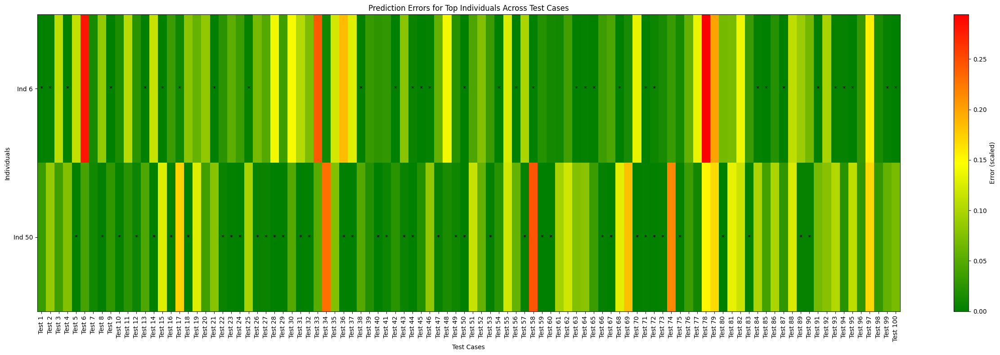

In [15]:
similarity_threshold = 0
threshold = 0.01

errors, unique_indices = simplify_population(slim_pop, X_train, y_train, similarity_threshold=similarity_threshold)
plot_errors(errors, unique_indices, threshold=threshold)
errors, chosen_indices = combine_simplify(slim_pop, X_train, y_train, threshold=threshold, n=2)
plot_errors(errors, chosen_indices, threshold=threshold)

#### SPECIALISTS FINDING METRIC ?


Pairwise Distance Matrix (Manhattan/Hamming Distance):
        I1    I2    I3    I4    I5    I6    I7    I8    I9   I10  ...   I91  \
I1     0.0  18.0  18.0  33.0  45.0  56.0  40.0  41.0  25.0  56.0  ...  38.0   
I2    18.0   0.0   0.0  15.0  27.0  38.0  22.0  23.0   7.0  38.0  ...  20.0   
I3    18.0   0.0   0.0  15.0  27.0  38.0  22.0  23.0   7.0  38.0  ...  20.0   
I4    33.0  15.0  15.0   0.0  42.0  53.0  37.0  38.0  22.0  53.0  ...  35.0   
I5    45.0  27.0  27.0  42.0   0.0  65.0  49.0  50.0  34.0  65.0  ...  47.0   
...    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
I96   30.0  12.0  12.0  27.0  39.0  50.0  34.0  35.0  19.0  50.0  ...  32.0   
I97   23.0   5.0   5.0  20.0  32.0  43.0  27.0  28.0  12.0  43.0  ...  25.0   
I98   20.0   2.0   2.0  17.0  25.0  40.0  24.0  25.0   9.0  40.0  ...  22.0   
I99   45.0  27.0  27.0  42.0   0.0  65.0  49.0  50.0  34.0  65.0  ...  47.0   
I100  45.0  27.0  27.0  42.0  54.0  65.0  49.0  50.0  34.0  65.0  ...  47.0

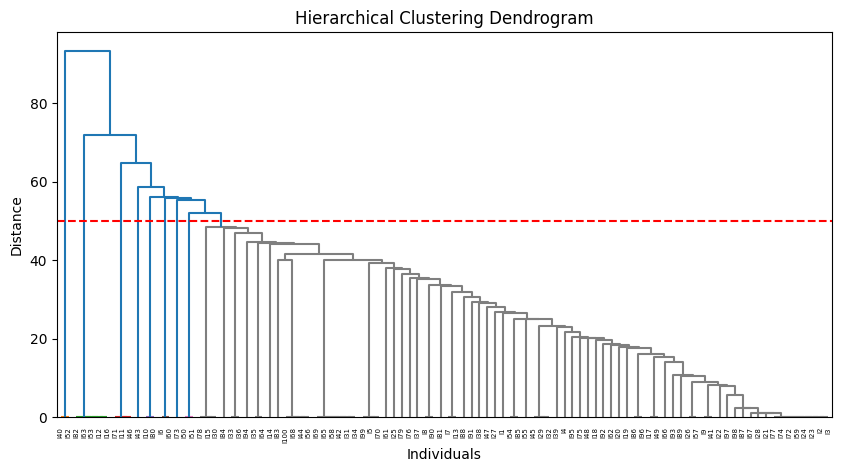


Cluster Assignments:
   Individual  Cluster
51        I52        1
39        I40        1
15        I16        2
11        I12        2
62        I63        2
..        ...      ...
96        I97        7
99       I100        7
97        I98        7
72        I73        8
42        I43        9

[100 rows x 2 columns]
Cluster
7    82
2     5
3     3
4     2
5     2
1     2
6     2
9     1
8     1
Name: count, dtype: int64


: 

In [ ]:
import numpy as np
import pandas as pd
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from scipy.spatial.distance import pdist, squareform

# PARAMS 
tau = 1e-2
threshold = 50

error_matrix = np.abs(population.errors_case)

# Step 2: Compute the minimum error per test case (column-wise)
min_errors = np.min(error_matrix, axis=0)

# Step 3: Convert to elitized binary matrix (0 if minimum, 1 otherwise)
elitized_matrix = (error_matrix <= min_errors + np.median(min_errors)*tau).astype(int)

# Step 4: Compute pairwise Manhattan (Hamming) distances
distance_matrix = squareform(pdist(elitized_matrix, metric="cityblock"))

# Convert to DataFrame for better readability
individuals = [f"I{i+1}" for i in range(100)]
distance_df = pd.DataFrame(distance_matrix, index=individuals, columns=individuals)

# Print the pairwise distance matrix
print("\nPairwise Distance Matrix (Manhattan/Hamming Distance):")
print(distance_df)

# Compute pairwise condensed Manhattan (Hamming) distances
condensed_distance = pdist(elitized_matrix, metric="cityblock")  

# Perform hierarchical clustering with the condensed distance matrix
linkage_matrix = sch.linkage(condensed_distance, method='average')

# Plot the dendrogram
plt.figure(figsize=(10, 5))
sch.dendrogram(linkage_matrix, labels=individuals, leaf_rotation=90, color_threshold=threshold)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Individuals")
plt.ylabel("Distance")
plt.axhline(y=threshold, color='r', linestyle='--')  # Example threshold for cutting clusters
plt.show()

from scipy.cluster.hierarchy import fcluster
clusters = fcluster(linkage_matrix, t=threshold, criterion='distance')

# Print cluster assignments
cluster_df = pd.DataFrame({"Individual": individuals, "Cluster": clusters})
print("\nCluster Assignments:")
print(cluster_df.sort_values(by="Cluster"))

print(cluster_df['Cluster'].value_counts())

#### FUNCTIONS 

In [12]:
def is_pareto_non_dominated(errors): 
    """
    Function to determine if a set of errors is Pareto non-dominated
    
    Returns
    --------
        Array of boolean values indicating if each individual is non-dominated
    """
    n_individuals = errors.shape[0]
    is_non_dominated = np.ones(n_individuals, dtype=bool)
    
    for i in range(n_individuals):
        for j in range(n_individuals):
            if i == j:
                continue
            if all(errors[i] <= errors[j]) and any(errors[i] < errors[j]):
                is_non_dominated[j] = False
    return is_non_dominated


def simplify_population(population, X_train, y_train, similarity_threshold=0.1):
    version = population.population[0].version
    for ind in population:
        ind.version = version
    best_individuals = sorted(population, key=lambda x: x.size)[:100]
    
    errors = np.array([np.abs(ind.predict(X_train) - y_train) for ind in best_individuals])
    
    pareto_mask = is_pareto_non_dominated(errors)
    pareto_indices = [i for i, mask in enumerate(pareto_mask) if mask]
    
    print(f"Removed {len(best_individuals) - len(pareto_indices)} Pareto-dominated individuals")
    
    errors = MinMaxScaler().fit_transform(errors)
    
    # Compute pairwise distances
    distance_matrix = squareform(pdist(errors, metric='euclidean'))
    mean_distance = distance_matrix.mean()
    
    # Select unique individuals based on similarity threshold
    unique_indices = []
    for i in pareto_indices:
        if not unique_indices or all(distance_matrix[i, j] > similarity_threshold * mean_distance for j in unique_indices):
            unique_indices.append(i)
    
    print(f"Removed {len(pareto_indices) - len(unique_indices)} individuals due to similarity")
    
    return errors[unique_indices], unique_indices

def plot_errors(errors, unique_indices, threshold=0.1):
    plt.figure(figsize=(25, 8))
    plt.imshow(errors, cmap=LinearSegmentedColormap.from_list("GreenRed", ["green", "yellow", "red"]), aspect="auto")
    plt.colorbar(label="Error (scaled)", orientation="vertical")
    
    for i, row in enumerate(errors):
        for j, val in enumerate(row):
            if val < threshold:
                plt.text(j, i, "*", color="black", ha="center", va="center", fontsize=10)
    
    plt.title("Prediction Errors for Top Individuals Across Test Cases")
    plt.xlabel("Test Cases")
    plt.ylabel("Individuals")
    plt.xticks(range(errors.shape[1]), [f"Test {i+1}" for i in range(errors.shape[1])], rotation=90)
    plt.yticks(range(errors.shape[0]), [f"Ind {idx}" for idx in unique_indices])
    plt.tight_layout()
    plt.show()

def combine_simplify(population, X_train, y_train, threshold=0.1, n=2):
    best_individuals = sorted(population, key=lambda x: x.size)[:100]
    errors = np.array([np.abs(ind.predict(X_train) - y_train) for ind in best_individuals])
    
    scaler = MinMaxScaler()
    scaled_errors = scaler.fit_transform(errors)
    
    bool_array = scaled_errors < threshold
    max_trues = 0
    best_combinations = []

    for comb in combinations(range(bool_array.shape[0]), n):
        combined_row = np.logical_or.reduce(bool_array[list(comb), :])
        true_count = np.sum(combined_row)
        if true_count > max_trues:
            max_trues = true_count
            best_combinations = [comb]
        elif true_count == max_trues:
            best_combinations.append(comb)

    print(f"Maximum number of True values: {max_trues} of {bool_array.shape[1]}")
    print(f"Best combinations of rows (indices in `errors`): {best_combinations}")

    if not best_combinations:
        print("No valid combinations found.")
        return scaled_errors, list(range(scaled_errors.shape[0]))

    # Choose one of the best combinations (e.g., the first one)
    chosen_combination = best_combinations[0]
    
    ensemble_indices = []
    individual_contributions = {}
    ensemble_errors = np.zeros(errors.shape[1])

    for individual_idx in chosen_combination:
        individual_cases = np.where(bool_array[individual_idx] & ~np.isin(range(errors.shape[1]), ensemble_indices))[0]
        individual_contributions[individual_idx] = individual_cases
        ensemble_indices.extend(individual_cases)
        ensemble_errors[individual_cases] = errors[individual_idx, individual_cases]

    total_error_ensemble = np.sqrt(np.mean(ensemble_errors))
    total_error_no_ensemble = np.sqrt(np.mean(np.mean(errors[list(chosen_combination)], axis=0)))

    print(f"Total error of the ensemble: {round(total_error_ensemble,3)} vs {round(total_error_no_ensemble,3)} ({round(total_error_ensemble-total_error_no_ensemble,3)})")

    for i, (individual_idx, cases) in enumerate(individual_contributions.items()):
        print(f"Individual {individual_idx} covers {len(cases)} cases")

    return scaled_errors[list(chosen_combination)], list(chosen_combination)

In [12]:
similarity_threshold = 0.2 
threshold = 0.025

errors, unique_indices = simplify_population(population, X_train, y_train, similarity_threshold=similarity_threshold)
plot_errors(errors, unique_indices, threshold=threshold)
errors, chosen_indices = combine_simplify(population, X_train, y_train, example_tree, threshold=threshold, similarity_threshold=similarity_threshold, n=2)
plot_errors(errors, chosen_indices, threshold=threshold)

AttributeError: 'Tree' object has no attribute 'size'

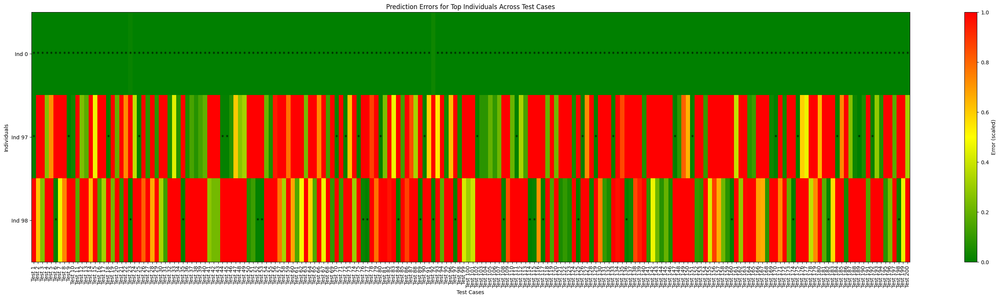

In [553]:
best_individuals = sorted(population, key=lambda x: x.fitness)[:99]
errors = []
individual_indices = []  # To track which individual corresponds to each row
threshold = 0.02
similarity_threshold = 0.5

# Calculate errors for each individual
for idx, individual in enumerate(best_individuals):
    individual.version = example_tree.version
    error = (individual.predict(X_train) - y_train) ** 2  # Squared error
    errors.append(error)
    individual_indices.append(idx)  # Keep track of the individual index

# Convert errors to a 2D array (rows = individuals, columns = test cases)
errors = np.array(errors)

# Compute pairwise distances between individuals
distance_matrix = squareform(pdist(errors, metric='euclidean'))
mean_distance = distance_matrix.mean()

# Select unique individuals based on similarity threshold
unique_indices = []
selected_individuals = []  # To keep track of selected individuals
for i, row in enumerate(errors):
    if all(distance_matrix[i, j] > similarity_threshold * mean_distance for j in unique_indices):
        unique_indices.append(i)
        selected_individuals.append(individual_indices[i])  # Map back to original individual index

# Filter errors and scale
errors = errors[unique_indices]
scaler = MinMaxScaler()
errors = scaler.fit_transform(errors)

# Sort errors by the number of values below the threshold
sorted_indices = np.sum(errors < threshold, axis=1).argsort()[::-1]
errors = errors[sorted_indices]
sorted_individuals = [selected_individuals[i] for i in sorted_indices]  # Update individual mapping

# Create a colormap for the plot
colors = LinearSegmentedColormap.from_list("GreenRed", ["green", "yellow", "red"])

# Plot the diagram
plt.figure(figsize=(30, 8))
plt.imshow(errors, cmap=colors, aspect="auto")
plt.colorbar(label="Error (scaled)", orientation="vertical")

# Add labels for values that are close to zero
for i in range(errors.shape[0]):  # Iterate over individuals
    for j in range(errors.shape[1]):  # Iterate over test cases
        if errors[i, j] < threshold:
            plt.text(j, i, "*", color="black", ha="center", va="center", fontsize=10)

# Add labels and titles
plt.title("Prediction Errors for Top Individuals Across Test Cases")
plt.xlabel("Test Cases")
plt.ylabel("Individuals")
plt.xticks(range(errors.shape[1]), labels=[f"Test {i+1}" for i in range(errors.shape[1])], rotation=90)
plt.yticks(range(errors.shape[0]), labels=[f"Ind {idx}" for idx in sorted_individuals])
plt.tight_layout()

# Show the plot
plt.show()

In [8]:
seed = 2

X,y = datasets[2]()
# Scale
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2, seed=0)

agelog = LogAge()
divlog = LogDiversity()
early_stop = EarlyStopping_train(patience=2500)

example_tree, population = slim(X_train=X_train, y_train=y_train,
                    dataset_name='test', test_elite=False, slim_version='SLIM*ABS', # initializer='simple',
                    max_depth=15, init_depth=5, pop_size=100, n_iter=500, seed=seed, verbose=1,
                    p_inflate=0.5, p_struct=0.2,
                    prob_const=0.06, n_elites=1, selector='lexicase', 
                    decay_rate=0.2, p_xo=0, p_struct_xo=0,
                    callbacks=[agelog, divlog, early_stop],
                    tournament_size=10, full_return=True, timeout=200,
    )

preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))

divlog.plot_diversity()

TypeError: selector() got an unexpected keyword argument 'eps_fraction'

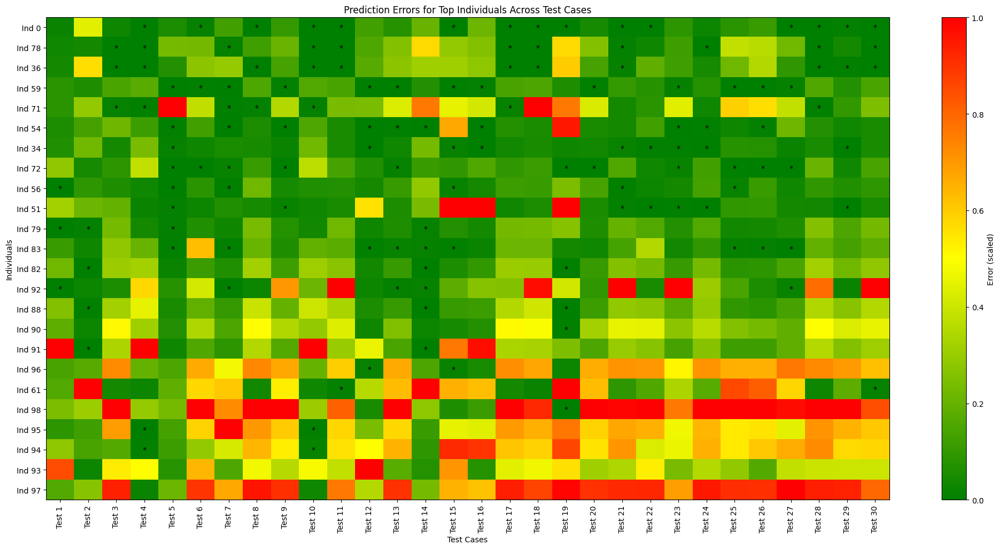

In [580]:
best_individuals = sorted(population, key=lambda x: x.fitness)[:99]
errors = []
individual_indices = []  # To track which individual corresponds to each row
threshold = 0.02
similarity_threshold = 0.4

# Calculate errors for each individual
for idx, individual in enumerate(best_individuals):
    individual.version = example_tree.version
    error = (individual.predict(X_train) - y_train) ** 2  # Squared error
    errors.append(error)
    individual_indices.append(idx)  # Keep track of the individual index

# Convert errors to a 2D array (rows = individuals, columns = test cases)
errors = np.array(errors)

# Compute pairwise distances between individuals
distance_matrix = squareform(pdist(errors, metric='euclidean'))
mean_distance = distance_matrix.mean()

# Select unique individuals based on similarity threshold
unique_indices = []
selected_individuals = []  # To keep track of selected individuals
for i, row in enumerate(errors):
    if all(distance_matrix[i, j] > similarity_threshold * mean_distance for j in unique_indices):
        unique_indices.append(i)
        selected_individuals.append(individual_indices[i])  # Map back to original individual index

# Filter errors and scale
errors = errors[unique_indices]
scaler = MinMaxScaler()
errors = scaler.fit_transform(errors)

# Sort errors by the number of values below the threshold
sorted_indices = np.sum(errors < threshold, axis=1).argsort()[::-1]
errors = errors[sorted_indices]
sorted_individuals = [selected_individuals[i] for i in sorted_indices]  # Update individual mapping

# Create a colormap for the plot
errors = errors[:,100:130]
colors = LinearSegmentedColormap.from_list("GreenRed", ["green", "yellow", "red"])

# Plot the diagram
plt.figure(figsize=(20, 10))
plt.imshow(errors, cmap=colors, aspect="auto")
plt.colorbar(label="Error (scaled)", orientation="vertical")

# Add labels for values that are close to zero
for i in range(errors.shape[0]):  # Iterate over individuals
    for j in range(errors.shape[1]):  # Iterate over test cases
        if errors[i, j] < threshold:
            plt.text(j, i, "*", color="black", ha="center", va="center", fontsize=10)

# Add labels and titles
plt.title("Prediction Errors for Top Individuals Across Test Cases")
plt.xlabel("Test Cases")
plt.ylabel("Individuals")
plt.xticks(range(errors.shape[1]), labels=[f"Test {i+1}" for i in range(errors.shape[1])], rotation=90)
plt.yticks(range(errors.shape[0]), labels=[f"Ind {idx}" for idx in sorted_individuals])
plt.tight_layout()

# Show the plot
plt.show()

In [176]:
y_train = y_train[:20]
X_train = X_train[:20]

Removed 34 Pareto-dominated individuals out of 100
Removed 27 individuals due to similarity out of 66


ValueError: The number of FixedLocator locations (39), usually from a call to set_ticks, does not match the number of labels (24).

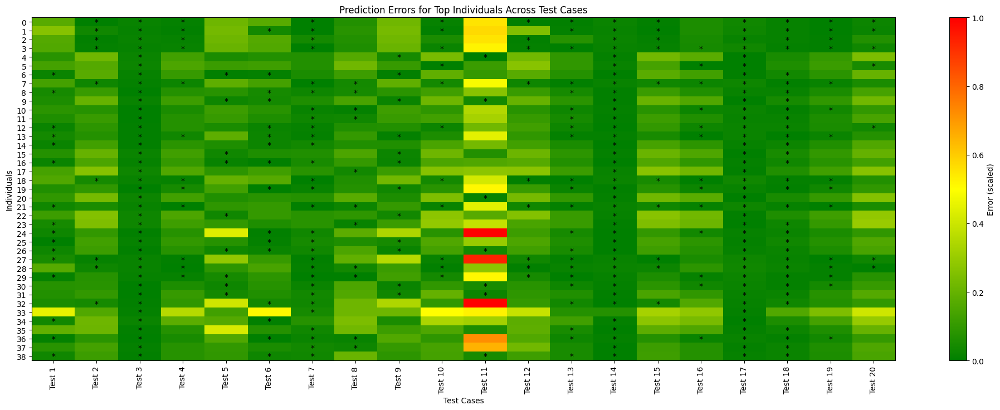

In [263]:
best_individuals = sorted(population, key=lambda x: x.size)[:100]
errors = []
individual_indices = []  # To track which individual corresponds to each row
threshold = 0.05

# Calculate errors for each individual
for idx, individual in enumerate(best_individuals):
    individual.version = example_tree.version
    error = np.abs((individual.predict(X_train) - y_train))
    errors.append(error)
    individual_indices.append(idx)  # Keep track of the individual index

errors = np.array(errors)

# Find Pareto-efficient individuals
pareto_mask = is_pareto_non_dominated(errors)
pareto_nondominated_ids = [idx for idx, mask in zip(individual_indices, pareto_mask) if mask]

# Calculate removal statistics
removed_count = len(best_individuals) - len(pareto_nondominated_ids)
print(f"Removed {removed_count} Pareto-dominated individuals out of {len(best_individuals)}")

# Use minmax scaling
scaler = MinMaxScaler()
errors = scaler.fit_transform(errors)
bellow_threshold = (errors < threshold)

# Remove individuals that are perfectly similar 
unique_indices = []
for i in pareto_nondominated_ids:
    if len(unique_indices) == 0:
        unique_indices.append(i)
        continue
    unique = True
    # If the individual is equal to any of the unique individuals, skip
    for j in unique_indices:
        if all(bellow_threshold[i] == bellow_threshold[j]):
            unique = False
            break
    if unique:
        unique_indices.append(i)

# Filter errors and scale
errors = errors[unique_indices]
# Print how many individuals were removed accounting for the previous removal
print(f"Removed {len(pareto_nondominated_ids) - len(unique_indices)} individuals due to similarity out of {len(pareto_nondominated_ids)}")


colors = LinearSegmentedColormap.from_list("GreenRed", ["green", "yellow", "red"])

# Plot the diagram
plt.figure(figsize=(25, 8))
plt.imshow(errors, cmap=colors, aspect="auto")
plt.colorbar(label="Error (scaled)", orientation="vertical")

# Add labels for values that are close to zero
for i in range(errors.shape[0]):  # Iterate over individuals
    for j in range(errors.shape[1]):  # Iterate over test cases
        if errors[i, j] < threshold:
            plt.text(j, i, "*", color="black", ha="center", va="center", fontsize=10)

# Add labels and titles
plt.title("Prediction Errors for Top Individuals Across Test Cases")
plt.xlabel("Test Cases")
plt.ylabel("Individuals")
plt.xticks(range(errors.shape[1]), labels=[f"Test {i+1}" for i in range(errors.shape[1])], rotation=90)
plt.yticks(range(errors.shape[0]), labels=[f"Ind {idx}" for idx in sorted_individuals])
plt.tight_layout()

# Show the plot
plt.show()

In [260]:
len(unique_indices)

39

In [249]:
bellow_threshold

array([[False, False,  True, ...,  True,  True, False],
       [False, False,  True, ...,  True,  True, False],
       [False, False,  True, ...,  True,  True, False],
       ...,
       [ True, False,  True, ...,  True, False, False],
       [ True, False,  True, ...,  True, False, False],
       [False, False, False, ..., False, False, False]])

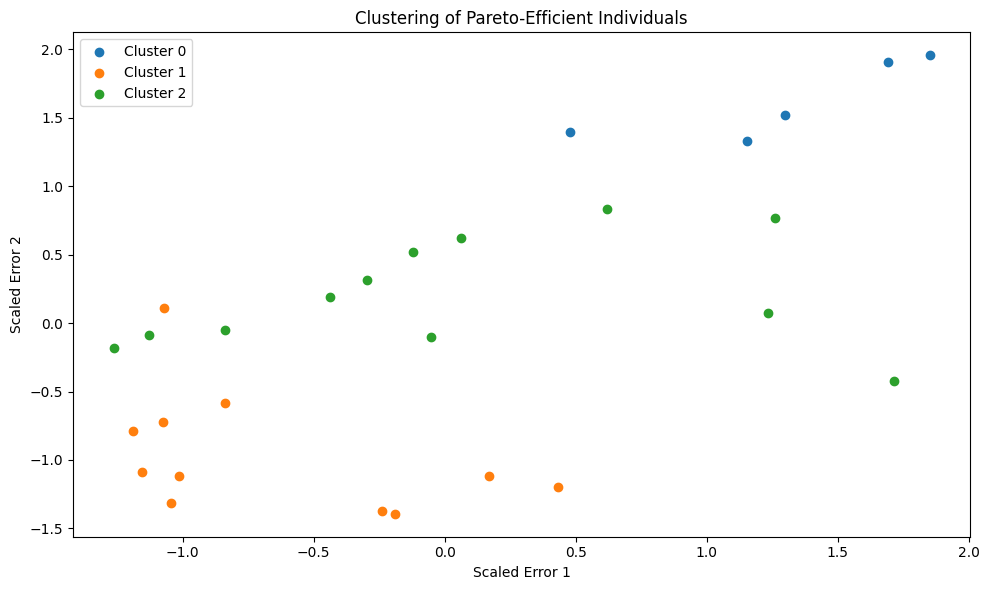

In [94]:
# Use k-means clustering to identify clusters
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Scale the errors
scaler = StandardScaler()
scaled_errors = scaler.fit_transform(errors)

# Perform clustering
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(scaled_errors)
cluster_labels = kmeans.labels_

# Plot the clusters
plt.figure(figsize=(10, 6))

# Plot the clusters
for i in range(n_clusters):
    plt.scatter(scaled_errors[cluster_labels == i, 0], scaled_errors[cluster_labels == i, 1], label=f"Cluster {i}")

# Add labels and titles
plt.xlabel("Scaled Error 1")
plt.ylabel("Scaled Error 2")
plt.title("Clustering of Pareto-Efficient Individuals")
plt.legend()
plt.tight_layout()


<Axes: ylabel='Density'>

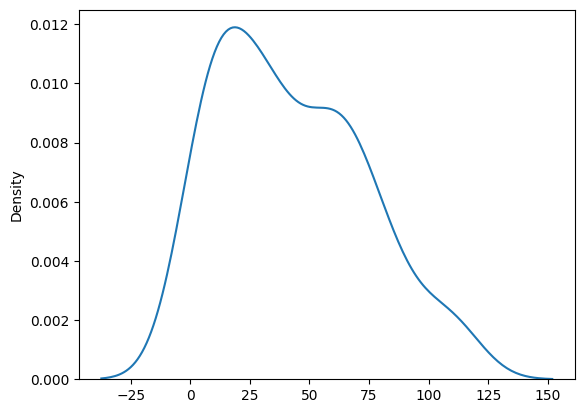

In [73]:
# PLot errors[:,12] distribution kdistplot
import seaborn as sns
sns.kdeplot(errors[:, 10])


In [ ]:
best_individuals = population
errors = []
individual_indices = []  # To track which individual corresponds to each row
threshold = 0.02
similarity_threshold = 0.4

# Calculate errors for each individual
for idx, individual in enumerate(best_individuals):
    individual.version = example_tree.version
    error = (individual.predict(X_train) - y_train) ** 2  # Squared error
    errors.append(error)
    individual_indices.append(idx)  # Keep track of the individual index

# Convert errors to a 2D array (rows = individuals, columns = test cases)
errors = np.array(errors)

# Compute pairwise distances between individuals
distance_matrix = squareform(pdist(errors, metric='euclidean'))
mean_distance = distance_matrix.mean()

# Select unique individuals based on similarity threshold
unique_indices = []
selected_individuals = []  # To keep track of selected individuals
for i, row in enumerate(errors):
    if all(distance_matrix[i, j] > similarity_threshold * mean_distance for j in unique_indices):
        unique_indices.append(i)
        selected_individuals.append(individual_indices[i])  # Map back to original individual index

# Filter errors and scale
errors = errors[unique_indices]
scaler = MinMaxScaler()
errors = scaler.fit_transform(errors)

# Sort errors by the number of values below the threshold
sorted_indices = np.sum(errors < threshold, axis=1).argsort()[::-1]
errors = errors[sorted_indices]
sorted_individuals = [selected_individuals[i] for i in sorted_indices]  # Update individual mapping

# Create a colormap for the plot
colors = LinearSegmentedColormap.from_list("GreenRed", ["green", "yellow", "red"])

# Plot the diagram
plt.figure(figsize=(25, 8))
plt.imshow(errors, cmap=colors, aspect="auto")
plt.colorbar(label="Error (scaled)", orientation="vertical")

# Add labels for values that are close to zero
for i in range(errors.shape[0]):  # Iterate over individuals
    for j in range(errors.shape[1]):  # Iterate over test cases
        if errors[i, j] < threshold:
            plt.text(j, i, "*", color="black", ha="center", va="center", fontsize=10)

# Add labels and titles
plt.title("Prediction Errors for Top Individuals Across Test Cases")
plt.xlabel("Test Cases")
plt.ylabel("Individuals")
plt.xticks(range(errors.shape[1]), labels=[f"Test {i+1}" for i in range(errors.shape[1])], rotation=90)
plt.yticks(range(errors.shape[0]), labels=[f"Ind {idx}" for idx in sorted_individuals])
plt.tight_layout()

# Show the plot
plt.show()

In [262]:
n = 3

bool_array = errors < threshold
max_trues = 0
best_combinations = []

# Iterate over all combinations of n rows
for comb in combinations(range(bool_array.shape[0]), n):
    combined_row = np.logical_or.reduce(bool_array[list(comb), :])
    true_count = np.sum(combined_row)
    if true_count > max_trues:
        max_trues = true_count
        best_combinations = [comb]
    elif true_count == max_trues:
        best_combinations.append(comb)

# Map combinations back to the original individuals
best_individuals_combinations = [
    [sorted_individuals[row] for row in comb] for comb in best_combinations
]

# Output results
print(f"Maximum number of True values: {max_trues} of {bool_array.shape[1]}")
print(f"Best combinations of rows (indices in `errors`): {best_combinations}")
print(f"Best combinations of individuals (indices in `best_individuals`): {best_individuals_combinations}")
print('-'*50)

# Example variables
bool_array = errors < threshold  # Boolean array (True where error < threshold)
mapped_combinations = best_combinations[0]

ensemble_indices = []  # Track indices of cases covered by the ensemble
individual_contributions = {}  # Track individual contributions
ensemble_errors = np.zeros(errors.shape[1])  # Placeholder for ensemble errors

# Unscale the errors using the inverse transformation
unscaled_errors = scaler.inverse_transform(errors)

# Calculate the overall unscaled error without ensemble
average_error_no_ensemble_unscaled = np.mean(unscaled_errors[mapped_combinations[0]], axis=0)
total_error_no_ensemble_unscaled = np.sqrt(np.mean(average_error_no_ensemble_unscaled))

# Iterate through individuals in the mapped combination
for individual_idx in mapped_combinations:
    # Identify cases where the individual excels
    individual_cases = np.where(bool_array[individual_idx] & ~np.isin(range(errors.shape[1]), ensemble_indices))[0]
    
    # Track individual contributions
    individual_contributions[individual_idx] = individual_cases
    
    # Add these cases to the ensemble indices
    ensemble_indices.extend(individual_cases)

    # Update the ensemble errors for these cases
    ensemble_errors[individual_cases] = unscaled_errors[individual_idx, individual_cases]

# Calculate the overall unscaled error of the ensemble
total_error_ensemble_unscaled = np.sqrt(np.mean(ensemble_errors))

# Output results
print(f"Total unscaled error of the ensemble: {round(total_error_ensemble_unscaled,3)} vs {round(total_error_no_ensemble_unscaled,3)} ({round(total_error_ensemble_unscaled-total_error_no_ensemble_unscaled,3)})")

print(f"Cases covered by each individual in the ensemble:")
for i, (individual_idx, cases) in enumerate(individual_contributions.items()):
    print(f"Individual {best_individuals_combinations[0][i]} covers {len(cases)} cases")

Maximum number of True values: 1160 of 1203
Best combinations of rows (indices in `errors`): [(0, 3, 12)]
Best combinations of individuals (indices in `best_individuals`): [[0, 59, 82]]
--------------------------------------------------
Total unscaled error of the ensemble: 14.052 vs 30.002 (-15.949)
Cases covered by each individual in the ensemble:
Individual 0 covers 670 cases
Individual 59 covers 338 cases
Individual 82 covers 152 cases


In [18]:
# Use the 10 best individuals to test the ensemble
best_individuals = sorted(population, key=lambda x: x.fitness)[:2]
ensemble_preds = []
for ind in best_individuals:
    ind.version = example_tree.version
    ensemble_preds.append(ind.predict(X_test))
ensemble_preds = np.array(ensemble_preds)
ensemble_preds = np.mean(ensemble_preds, axis=0)
print('Ensemble RMSE:', rmse(ensemble_preds, y_test))

Ensemble RMSE: 112.42278895974351


In [ ]:
for sem in population.train_semantics:
    try:
        sem_prod = np.prod(sem, axis=0)
        print(sem_prod)
    except:

        print(sem)

In [ ]:
seed = 100

X,y = datasets[2]()  # AIRFOIL
# Scale
scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.25, seed=0)
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, p_test=0.6, seed=0)
X_train = torch.tensor(scaler_X.fit_transform(X_train))
y_train = torch.tensor(scaler_y.fit_transform(y_train.reshape(-1,1))).flatten()
X_val = torch.tensor(scaler_X.transform(X_val))
y_val = torch.tensor(scaler_y.transform(y_val.reshape(-1,1))).flatten()
X_test = torch.tensor(scaler_X.transform(X_test))
y_test = torch.tensor(scaler_y.transform(y_test.reshape(-1,1))).flatten()

agelog = LogAge()
divlog = LogDiversity()
fitlog = LogFitness()
early_stop = EarlyStopping_train(patience=2500)

example_tree, population = slim(X_train=X_train, y_train=y_train, X_test=X_val, y_test=y_val,
                    dataset_name='test', test_elite=True, slim_version='SLIM+ABS', initializer='simple',
                    max_depth=17, init_depth=8, pop_size=100, n_iter=2000, seed=seed, fitness_sharing=False, verbose=1,
                    p_inflate=0.45, p_struct=0.3, struct_mutation=False, 
                    prob_const=0.3, n_elites=1, selector='tournament', pressure_size=0.5,
                    decay_rate=0.2, p_xo=0, p_struct_xo=0,
                    callbacks=[agelog, divlog, fitlog, early_stop],
                    depth_distribution='diz', tournament_size=2, full_return=True, timeout=200,
    )

preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))

divlog.plot_diversity()
fitlog.plot_fitness()

|       test      |       683       |      0.120      |      0.101      |      0.030      |       126       |        22       |      6.960      |      12.500     |     0.63 (9)    |     1.51 (9)    |     0.0 (30)    |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
683 iterations completed. Training stopped by callback.
RMSE: tensor(0.1220, dtype=torch.float64)

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |       div       |     avgStru     |      avgDep     |      struct     |     inflate     |     deflate     |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.187      |       None      |      0.121      |        3        |     3285198     |      4.520      |      4.520      |     N/A (0)     |     N/A (0)     |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-

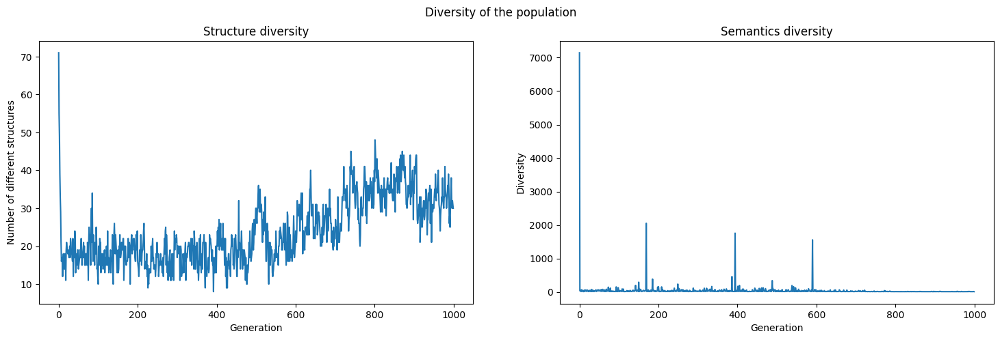

In [4]:
seed = 10

X,y = datasets[2]()  # AIRFOIL
# Scale
scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2, seed=seed)
X_train = torch.tensor(scaler_X.fit_transform(X_train))
y_train = torch.tensor(scaler_y.fit_transform(y_train.reshape(-1,1))).flatten()
X_test = torch.tensor(scaler_X.transform(X_test))
y_test = torch.tensor(scaler_y.transform(y_test.reshape(-1,1))).flatten()

agelog = LogAge()
divlog = LogDiversity()
early_stop = EarlyStopping_train(patience=2500)

example_tree, population = slim(X_train=X_train, y_train=y_train, test_elite=False,
                    dataset_name='test', slim_version='SLIM*ABS',
                    max_depth=17, init_depth=8, pop_size=100, n_iter=1000, seed=seed, fitness_sharing=False, verbose=1,
                    p_inflate=0.45, p_struct=0.25, struct_mutation=True, 
                    prob_const=0.2, n_elites=1, selector='tournament', pressure_size=0.5,
                    decay_rate=0.2, p_xo=0, p_struct_xo=0,
                    callbacks=[agelog, divlog, early_stop],
                    depth_distribution='diz', tournament_size=2, full_return=True, timeout=200,
    )

preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))

divlog.plot_diversity()

|       test      |       1000      |      0.116      |       None      |      0.061      |       164       |        7        |      7.960      |      13.010     |    0.73 (13)    |    0.55 (53)    |    0.06 (33)    |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
RMSE: tensor(0.1250, dtype=torch.float64)


|       test      |       1000      |      0.133      |       None      |      0.078      |       196       |        23       |      2.030      |      12.810     |    0.62 (10)    |    0.88 (42)    |    0.18 (47)    |     N/A (0)     |
|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|-----------------|
RMSE: tensor(0.1464, dtype=torch.float64)


In [23]:
count = 0
for num in population.fit:
    count += num.item()

print('Average fitness:', count/len(population.fit))

Average fitness: 684.4216248960993


In [26]:
datasets[2]()[0].shape

torch.Size([1503, 5])

In [27]:
X.shape

torch.Size([100, 1])

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |       div       |     avgStru     |      avgDep     |      struct     |     inflate     |     deflate     |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      1.216      |       None      |      0.022      |        3        |        0        |      2.000      |      2.000      |     N/A (0)     |     N/A (0)     |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-

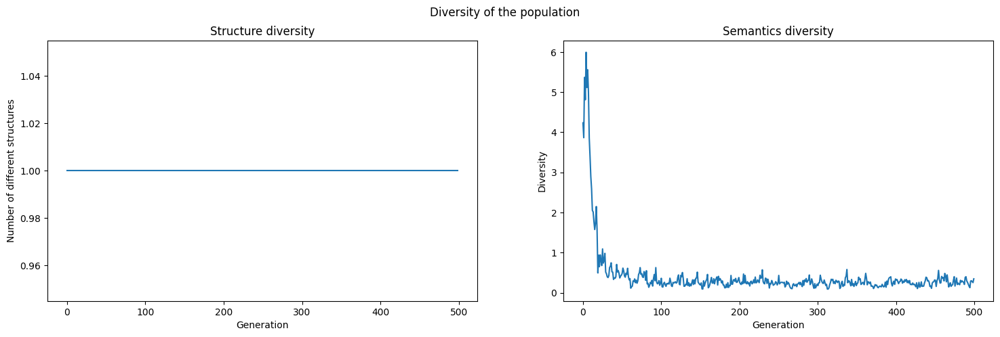

In [35]:
seed = 50
# Create a mock dataset
X = torch.randn(100, 1) + 2
y = -0.1 * X + torch.randn(100, 1) * 0.1
y = y.flatten()

X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2, seed=seed)

agelog = LogAge()
divlog = LogDiversity()

example_tree, population = slim(X_train=X_train, y_train=y_train, test_elite=False,
                    dataset_name='test', slim_version='SLIM*SIG1', initializer='simple',
                    max_depth=17, init_depth=8, pop_size=100, n_iter=500, seed=seed, verbose=1,
                    p_inflate=0.5, prob_const=0.20, n_elites=1, selector='tournament',
                    decay_rate=0.12, p_xo=0, p_struct_xo=0, struct_mutation=False,
                    callbacks=[agelog, divlog], ms_lower=0, ms_upper=1,
                    depth_distribution='norm', tournament_size=2, full_return=True, timeout=200,
    )

preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))

divlog.plot_diversity()

In [38]:
# Use the 10 best individuals to test the ensemble
best_individuals = sorted(population, key=lambda x: x.fitness)[:1]
ensemble_preds = []
for ind in best_individuals:
    ind.version = example_tree.version
    ensemble_preds.append(ind.predict(X_test))
ensemble_preds = np.array(ensemble_preds)
ensemble_preds = torch.tensor(np.mean(ensemble_preds, axis=0))
print('Ensemble RMSE:', rmse(ensemble_preds, y_test))

Ensemble RMSE: tensor(0.2360)


In [9]:
seen_semantics = {}
total_mutations = 0
for ind in population.population:
    semantics = ind.train_semantics[1:]
    for sem_ in semantics:
        total_mutations += 1
        sem = sem_[:2]
        sem = sem.tolist()
        sem = str(sem)
        if sem in seen_semantics:
            seen_semantics[sem] += 1
        else:
            seen_semantics[sem] = 1

seen_semantics = {k: v for k, v in sorted(seen_semantics.items(), key=lambda item: item[1], reverse=True)}
seen_semantics

{'[0.7230196215769629, 0.6002229638017295]': 14,
 '[0.24796877708827428, 0.2479687770882788]': 6,
 '[0.30017995673080594, 0.27233717394464]': 4,
 '[0.3187892641318919, 0.45899144458541086]': 4,
 '[0.0020311404438714963, 0.0008681491847771386]': 4,
 '[0.27158352572178357, 0.3533709826224462]': 2,
 '[1.84063092704671e-05, 2.169333863430165e-05]': 2,
 '[-0.07684937859118623, -0.13131736710802744]': 2,
 '[0.044274846711818534, 0.06370220906924576]': 2,
 '[0.0, 0.0]': 2,
 '[0.0004907770662783563, 0.0013050828354391956]': 2,
 '[0.20576008307512586, 0.09953229934861142]': 1,
 '[0.007425623029711139, 0.012889177956393251]': 1,
 '[0.010917039004823563, 0.01626504675423389]': 1,
 '[0.1088245171169006, 0.050542047254475066]': 1,
 '[-0.5512001167212511, -0.8423733538179834]': 1,
 '[0.975037526555191, 0.0]': 1,
 '[-0.0013744028073024487, -0.08114125153987757]': 1,
 '[0.20078269144766503, 0.20482835891112713]': 1,
 '[0.15695009627917758, 0.22653591229798553]': 1,
 '[-0.24889990972506074, -0.41043121

In [5]:
# Check how many individuals have the most common semantics
most_common_semantics = list(seen_semantics.keys())[0]
count = 0
count_ = 0
for ind in population.population:
    semantics = ind.train_semantics[1:]
    check = True
    for sem_ in semantics:
        sem = sem_[:2]
        sem = sem.tolist()
        sem = str(sem)
        if sem == most_common_semantics:
            count += 1
            break
count

4

In [6]:
population.population[0].structure

[('multiply',
  ('add',
   ('subtract',
    'constant__0.76',
    ('add', ('multiply', 'constant__0.18', 'constant__0.9'), 'constant_0.05')),
   ('multiply',
    ('add',
     ('divide', ('add', 'x2', 'x4'), ('divide', 'x4', ('divide', 'x3', 'x3'))),
     ('divide', ('add', 'x4', 'constant_0.83'), 'x1')),
    ('multiply', 'x0', 'x4'))),
  'constant__0.67')]

In [163]:
# Which ones dont have 
for ind in population.population:
    semantics = ind.train_semantics[1:]
    for sem_ in semantics:
        sem = sem_[:5]
        sem = sem.tolist()
        sem = str(sem)
        if sem != most_common_semantics:
            print(sem)
            break

[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[1.1213422461523217, 1.0826020837220371, 1.107485585333633, 1.1092573946161297, 1.0144084577210426]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713]
[0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.5436079502105713, 0.543607950

In [40]:
preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))
print('Nodes:', example_tree.nodes_count)

example_tree_ = simplify_individual(example_tree, y_val, X_val, threshold=0.05)
preds_ = example_tree_.predict(X_test)
print('RMSE:', rmse(preds_, y_test))
print('Nodes:', example_tree_.nodes_count)

RMSE: tensor(0.1206, dtype=torch.float64)
Nodes: 124
RMSE: tensor(0.1289, dtype=torch.float64)
Nodes: 17


In [41]:
example_tree_.structure

[(np.str_('divide'),
  ('subtract',
   ('multiply',
    ('add', 'constant_0.4', ('divide', 'x1', 'x2')),
    ('multiply', ('multiply', 'x4', 'x2'), ('divide', 'x0', 'x4'))),
   'constant_0.41'),
  'constant__0.61')]

In [49]:
# Try a NN with the same architecture
from keras.models import Sequential 
from keras.layers import Dense
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

model = Sequential()
model.add(Dense(10, input_dim=5, activation='relu'))
model.add(Dense(1, activation='linear'))
model.compile(optimizer=Adam(learning_rate=0.01), loss='mean_squared_error')
model.fit(X_train, y_train, epochs=1000, validation_data=(X_val, y_val), callbacks=[EarlyStopping(patience=250)])
preds = model.predict(X_test)
print('RMSE:', rmse(torch.tensor(preds).flatten(), y_test))

ModuleNotFoundError: No module named 'tensorflow'

In [25]:
example_tree_.structure[0]
simplified = example_tree_

In [8]:
def get_indices_with_levels_mod(tree):
    """
    Get all indices that can be used to access valid subtrees or terminal nodes in a tree,
    along with their corresponding levels in the tree.

    Parameters
    ----------
    tree : tuple
        The root node of the tree.

    Returns
    -------
    list
        A list of tuples, each containing an index path and its corresponding level in the tree.
    """
    
    def traverse(sub_tree, path=(), level=0):
        indices_with_levels = []
        
        # If not tuple 
        if not isinstance(sub_tree, tuple):
            indices_with_levels.append((path, level))

        # If tuple, separate
        else:
            indices_with_levels.append((path, level)) if path != () else None
            op, left, right = sub_tree  
            # Can substitute the left or right
            indices_with_levels.extend(traverse(left, path + (1,), level + 1))
            indices_with_levels.extend(traverse(right, path + (2,), level + 1))

        return indices_with_levels
    
    return [((), (0))] + traverse(tree)

def structure_mutation(FUNCTIONS, TERMINALS, CONSTANTS, depth_dist="norm"):
    """
    Generate a function for the structure mutation.

    Parameters
    ----------
    FUNCTIONS : dict
        The dictionary of functions used in the mutation.
    TERMINALS : dict
        The dictionary of terminals used in the mutation.
    CONSTANTS : dict
        The dictionary of constants used in the mutation.
    depth_dist : str, optional
        Distribution to choose the depth of the new tree (default: "norm"), options: "norm", "exp", "uniform", "max", "diz"
        If diz is chosen, then we can only decrease/increase the depth by 1 or not change it at all.
    Returns
    -------
    
    Callable
        A structure mutation function (`structure`).
        
    """
    def structure(individual,
                        X,
                        max_depth=8,
                        p_c=0.1,
                        X_test=None,
                        grow_probability=1,
                        reconstruct=True, 
                        decay_rate=0.2,
                        **args,
    ):
        """
        Perform a mutation on a given Individual by changing the main structure of the tree.

        Parameters
        ----------
        individual : Individual
            The Individual to be mutated.
        X : torch.Tensor
            Input data for calculating semantics.
        max_depth : int, optional
            Maximum depth for generated trees (default: 8).
        p_c : float, optional
            Probability of choosing constants (default: 0.1).
        p_prune : float, optional
            Probability of pruning the tree (default: 0.5).
        X_test : torch.Tensor, optional
            Test data for calculating test semantics (default: None).
        grow_probability : float, optional
            Probability of growing trees during mutation (default: 1). 
            If changed, trees will be completely replaced during mutation more often.
        replace_probability : float, optional
            Probability of replacing the main tree during mutation (default: 0.1).
        X_test : torch.Tensor, optional
            Test data for calculating test semantics (default: None).
        exp_decay : bool, optional
            Flag to indicate whether exponential decay should be used to soften the mutation (default: False).
        reconstruct : bool
            Whether to store the Individuals structure after mutation.

        Returns
        -------
        Individual
            The mutated individual
        """

        indices_with_levels = get_indices_with_levels_mod(individual.structure[0])
        valid_indices_with_levels = [(index, level) for index, level in indices_with_levels if max_depth - len(index) >= 2]

        if not valid_indices_with_levels:
            raise ValueError("No valid indices satisfy the condition max_depth - len(index) >= 2")

        valid_indices, valid_levels = zip(*valid_indices_with_levels)

        if depth_dist == "diz": 
            # Can only choose either an index with max depth, or the one before
            individual_depth = individual.depth_collection[0]
            if random.random() < 0.5:
                chosen_level = individual_depth - 2
                depth = random.choice([1, 2, 3])
            else:
                chosen_level = individual_depth - 1
                depth = random.choice([1, 2])

            valid_indices = [index for index, level in valid_indices_with_levels if level == chosen_level]
            random_index = random.choice(valid_indices)

        else:
            probs = exp_decay_prob(max(valid_levels) + 1, decay_rate=decay_rate)
            level_probs = [probs[level] for level in valid_levels]
            random_index = random.choices(valid_indices, weights=level_probs)[0]

            if depth_dist == "norm":
                depth = choose_depth_norm(max_depth, random_index, mean=None, std_dev=None)
                
            else:
                depth = max_depth - len(random_index)   
                depths = np.arange(1, depth + 1) if len(random_index) > 1 else np.arange(2, depth + 1)
                
                if depth_dist == "exp":
                    probs = exp_decay_prob(len(depths), decay_rate=decay_rate)
                    depth = random.choices(depths, weights=probs)[0]    
                    
                elif depth_dist == "uniform":
                    depth = random.choice(depths)
                    
                elif depth_dist == "max":
                    depth = depths[-1]
                            
        
        # If just a node is selected
        if depth == 1:
            if random.random() < p_c:
                new_block = random.choice(list(CONSTANTS.keys()))
            else:
                new_block = random.choice(list(TERMINALS.keys()))
            
            # Swap the subtree in the main tree
            new_structure = swap_sub_tree(individual.structure[0], new_block, list(random_index))
                        
        else:
            rt = get_random_tree(
            depth,
            FUNCTIONS,
            TERMINALS,
            CONSTANTS,
            inputs=X,
            p_c=p_c,
            grow_probability=grow_probability,
            logistic=False,
        )         

            # Swap the subtree in the main tree
            new_structure = swap_sub_tree(individual.structure[0], rt.structure, list(random_index))
    
        # Create the new block
        new_block = Tree(structure=new_structure,
                            train_semantics=None,
                            test_semantics=None,
                            reconstruct=True)
        
        new_block.calculate_semantics(X)            
        
        # Create the offspring individual
        if X_test is not None:
            new_block.calculate_semantics(X_test, testing=True, logistic=False)
            
        offs = Individual(
            collection=[new_block, *individual.collection[1:]],
            train_semantics=torch.stack(
                [
                    new_block.train_semantics,
                    *individual.train_semantics[1:],
                ]   
            ),
            test_semantics=(
                torch.stack(
                    [
                        new_block.test_semantics,
                        *individual.test_semantics[1:],
                    ]
                )
                if X_test is not None
                else None
            ),
            reconstruct=reconstruct
        )

        # computing offspring attributes
        offs.size = individual.size
        offs.nodes_collection = [new_block.nodes,*individual.nodes_collection[1:]]
        offs.nodes_count = sum(offs.nodes_collection) + offs.size - 1

        offs.depth_collection = [new_block.depth, *individual.depth_collection[1:]]
        offs.depth = max(offs.depth_collection) + offs.size - 1
        offs.version = individual.version

        offs.id = individual.id

        return offs    
    
    return structure

In [12]:
simplified.depth_collection[0]

3

In [11]:
struct_mut = structure_mutation(FUNCTIONS=simplified.collection[1].FUNCTIONS, 
                                CONSTANTS=simplified.collection[1].CONSTANTS,
                                TERMINALS=simplified.collection[1].TERMINALS,
                                depth_dist='exp')

rmse_vals = []
size_vals = []
current_best_score = 0.5
current_best = None

for i in range(5000):
    simplified_mut = struct_mut(simplified, X=X_train, max_depth=7, decay_rate=2)
    # simplified_mut = simplify_individual(simplified_mut, y_val, X_val, threshold=0.01)
    simplified_mut.version = simplified.version
    preds_ = simplified_mut.predict(X_test)
    rmse_ = rmse(preds_, y_test)
    if rmse_ < current_best_score:
        current_best_score = rmse_
        current_best = simplified_mut
        print('New best:', rmse_)
        print(simplified_mut.structure[0])
    rmse_vals.append(rmse_)
    size_vals.append(simplified_mut.nodes_collection[0])

New best: tensor(0.4806, dtype=torch.float64)
('multiply', ('add', 'x2', 'x3'), 'constant_0.37')
New best: tensor(0.4568, dtype=torch.float64)
('multiply', ('add', 'x1', ('subtract', 'x1', ('multiply', ('subtract', 'x1', 'x1'), 'x3'))), 'constant_0.37')
New best: tensor(0.3165, dtype=torch.float64)
('multiply', ('add', 'x2', 'x1'), 'constant_0.37')
New best: tensor(0.2693, dtype=torch.float64)
('multiply', ('divide', 'x2', 'x2'), 'constant_0.37')
New best: tensor(0.2232, dtype=torch.float64)
('multiply', ('subtract', 'constant_0.75', 'x4'), 'constant_0.37')
New best: tensor(0.1469, dtype=torch.float64)
('multiply', 'constant_0.7', ('divide', 'constant_0.32', ('divide', 'x0', 'x0')))
New best: tensor(0.1327, dtype=torch.float64)
('multiply', ('divide', 'constant_0.77', 'constant_0.97'), 'constant_0.37')


In [17]:
preds = current_best.predict(X_test)
print('RMSE:', rmse(preds, y_test))
print('Nodes:', current_best.nodes_count)

current_best_ = simplify_individual(current_best, y_train, X_train, threshold=0.01)
preds_ = current_best_.predict(X_test)
print('RMSE:', rmse(preds_, y_test))
print('Nodes:', current_best_.nodes_count)

RMSE: tensor(0.1280, dtype=torch.float64)
Nodes: 124
RMSE: tensor(0.1280, dtype=torch.float64)
Nodes: 124


RMSE: tensor(0.1158, dtype=torch.float64) </br>
('multiply', 'constant_0.7', ('add', 'x1', 'constant__0.26'))

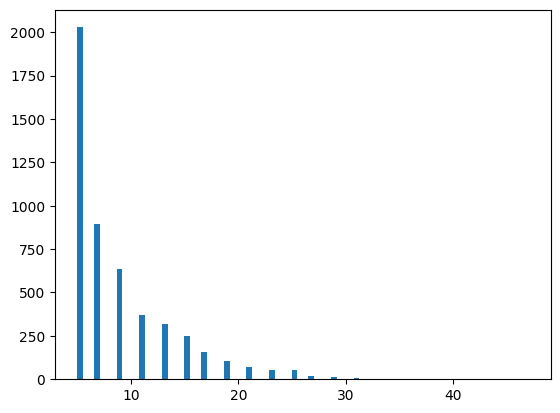

In [113]:
# Plot the distribution of the size of the trees
plt.hist(size_vals, bins=80)
plt.show()

In [114]:
np.min(size_vals)

np.int64(5)

In [80]:
rmse_vals = np.array(rmse_vals)
print('Mean RMSE:', np.min(rmse_vals))
best_id = np.argmin(rmse_vals)
print('Best ID:', best_id)

Mean RMSE: 0.12632628496653595
Best ID: 929


In [40]:
seed = 0

X,y = datasets[13]()
# Scale
scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X = torch.tensor(scaler_X.fit_transform(X))
y = torch.tensor(scaler_y.fit_transform(y.reshape(-1,1)).reshape(-1))
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2, seed=seed)

agelog = LogAge()
divlog = LogDiversity()

example_tree, population = slim(X_train=X_train, y_train=y_train, # X_test=X_test, y_test=y_test,
                    dataset_name='test', test_elite=False, slim_version='SLIM*SIG1',
                    max_depth=12, init_depth=4, pop_size=20, n_iter=2000, seed=seed, fitness_sharing=False, verbose=1,
                    p_inflate=0.4, p_struct=0.2, # selector='e_lexicase',
                    struct_mutation=True, decay_rate=0.1, p_xo=0, type_structure_mutation='new', callbacks=[agelog, divlog],
    )

preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |       div       |     avgStru     |      avgDep     |      struct     |     inflate     |     deflate     |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.409      |       None      |      0.006      |        3        |       258       |      2.950      |      2.950      |     N/A (0)     |     N/A (0)     |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-

best 0.243070

In [2]:
def choose_depth(max_depth, random_index, mean=None, std_dev=None):
    # Calculate the available depths
    depth = max_depth - len(random_index)
    depths = np.arange(1, depth + 1) if len(random_index) > 1 else np.arange(2, depth + 1)
    
    # Set mean and standard deviation
    if mean is None:
        mean = depths.mean()  # Default mean: middle of the range
    if std_dev is None:
        std_dev = (depths[-1] - depths[0]) / 4
    
    # Generate probabilities using the normal distribution formula
    probabilities = np.exp(-((depths - mean) ** 2) / (2 * std_dev ** 2))
    probabilities /= probabilities.sum()  # Normalize
    
    # Choose a depth using the probabilities
    chosen_depth = random.choices(depths, weights=probabilities, k=1)[0]
    
    return chosen_depth

In [ ]:
def choose_depth(max_depth, random_index, mean=None, std_dev=None):
    # Calculate the available depths
    depth = max_depth - len(random_index)
    depths = np.arange(1, depth + 1) if len(random_index) > 1 else np.arange(2, depth + 1)
    
    # Set mean and standard deviation
    if mean is None:
        mean = depths.mean()  # Default mean: middle of the range
    if std_dev is None:
        std_dev = (depths[-1] - depths[0]) / 4
    
    # Generate probabilities using the normal distribution formula
    probabilities = np.exp(-((depths - mean) ** 2) / (2 * std_dev ** 2))
    probabilities /= probabilities.sum()  # Normalize
    
    # Choose a depth using the probabilities
    chosen_depth = random.choices(depths, weights=probabilities, k=1)[0]
    
    return chosen_depth

# Example usage
max_depth = 22
random_index = [1, 2,2,2,2,2]  # Example index

depths = []
for i in range(10000):
    depths.append(choose_depth(max_depth, random_index))
    
plt.hist(depths, bins=np.arange(1, max_depth + 1) - 0.5, rwidth=0.8)
plt.show()

In [2]:
seed = 0

X,y = datasets[10]()
# Scale
scaler_X, scaler_y = MinMaxScaler(), MinMaxScaler()
X = torch.tensor(scaler_X.fit_transform(X))
y = torch.tensor(scaler_y.fit_transform(y.reshape(-1,1)).reshape(-1))
X_train, X_test, y_train, y_test = train_test_split(X, y, p_test=0.2, seed=seed)

agelog = LogAge()
divlog = LogDiversity()

example_tree, population = slim(X_train=X_train, y_train=y_train, # X_test=X_test, y_test=y_test,
                    dataset_name='test', test_elite=False, slim_version='SLIM*SIG1',
                    max_depth=22, init_depth=10, pop_size=100, n_iter=100, seed=seed, fitness_sharing=False, verbose=1,
                    p_inflate=0.4, p_struct=0.2, selector='e_lexicase',
                    struct_mutation=False, decay_rate=0.1, p_xo=0, type_structure_mutation='new', callbacks=[agelog, divlog],
    )

preds = example_tree.predict(X_test)
print('RMSE:', rmse(preds, y_test))

+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|     dataset     |        it       |      train      |       test      |       time      |      nodes      |       div       |     avgStru     |      avgDep     |      struct     |     inflate     |     deflate     |        xo       |
+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+-----------------+
|       test      |        0        |      0.234      |       None      |      0.213      |        3        |    2128770183   |      4.910      |      4.910      |     N/A (0)     |     N/A (0)     |     N/A (0)     |     N/A (0)     |
|-----------------|-----------------|-----------------|-

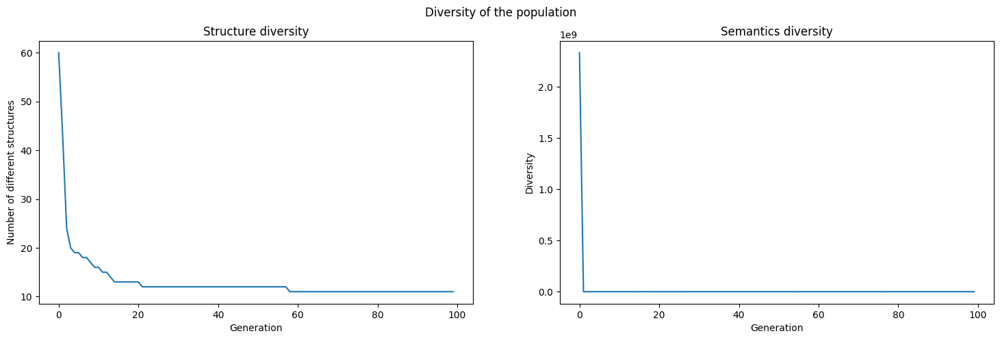

In [3]:
divlog.plot_diversity()

In [94]:
# Check the fitness for each individual
fitnesses = []

for tree in population.population:
    preds = tree.predict(X_test)
    fitnesses.append(rmse(preds, y_test))

# Get the 10 best fitnesses from the fitnesses list 
best_fitnesses = sorted(fitnesses)[:10]

# Get the ids 
best_ids = [fitnesses.index(i) for i in best_fitnesses]

ten_best = [population.population[i] for i in best_ids]

# Create a dataset and predict a linear model for the stacking ensemble
X_train_stacking = torch.zeros((X_train.shape[0], size))
X_test_stacking = torch.zeros((X_test.shape[0], size))

for i, tree in enumerate(ten_best):
    tree.version = 'SLIM*SIG1'
    X_train_stacking[:, i] = tree.predict(X_train)
    X_test_stacking[:, i] = tree.predict(X_test)
    
# Train a linear model
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train_stacking, y_train)

preds = lr.predict(X_test_stacking)
print('RMSE:', rmse(torch.tensor(preds), y_test))

RMSE: tensor(0.1013, dtype=torch.float64)


In [ ]:
constants = example_tree.collection[0].CONSTANTS
functions = example_tree.collection[0].FUNCTIONS
terminals = example_tree.collection[0].TERMINALS
depths = []

for i in range(10000):
    dep = choose_depth(14, [1,1,1,1])
    # dep = random.choice(np.arange(1, 14 + 1))
    # probs = exp_decay_prob(14, 0.3)
    # dep = random.choices(np.arange(1, 14 + 1), weights=probs, k=1)[0]
    if dep == 1:
        depths.append(1)
    else:
        depth = get_random_tree(max_depth=dep, 
                        FUNCTIONS=functions,
                        TERMINALS=terminals,
                        CONSTANTS=constants,
                        p_c=0.1).depth
        
        depths.append(depth)

plt.hist(depths, bins=np.arange(1, 14 + 1) - 0.5, rwidth=0.8)
plt.show()

In [15]:
indices_with_levels = get_indices_with_levels(example_tree.structure[0])
valid_indices_with_levels = [(index, level) for index, level in indices_with_levels if 22 - len(index) >= 2]


valid_indices, valid_levels = zip(*valid_indices_with_levels)
probs = exp_decay_prob(max(valid_levels) + 1, decay_rate=0.2)
level_probs = [probs[level] for level in valid_levels]
random_index = random.choices(valid_indices, weights=level_probs)[0]

In [4]:
indices_list = get_indices_with_levels(example_tree.structure[0])

In [ ]:
get_indices_with_levels(example_tree.structure[0])

In [ ]:
exp_decay_prob(5, decay_rate=0.3)

In [ ]:
decay_prob

In [17]:
counts_dict = {}

for i in range(10000):
    random_index = random.choices(indices_list, weights=decay_prob)[0]
    if random_index in counts_dict:
        counts_dict[random_index] += 1
    else:
        counts_dict[random_index] = 1

In [ ]:
counts_dict